In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import scipy
from scipy import stats
# import pywt
from scipy.signal import find_peaks
from scipy.stats import linregress, pearsonr, spearmanr, kurtosis, skew, shapiro, ttest_ind, zscore
from scipy.optimize import curve_fit
import pickle as pkl
import statsmodels.api as sm
import ast
import math

import warnings
warnings.filterwarnings("ignore")

In [2]:
def merge_and_keep(dfs, on, drop=True):
    how_merge = 'inner' if drop else 'outer'
    merged_df = dfs[0].copy()

    for df in dfs[1:]:
        df = df.copy()  
        shared_cols = set(merged_df.columns) & set(df.columns) - {on}
        rename_map = {col: f"{col}_dup" for col in shared_cols}
        df = df.rename(columns=rename_map)
        
        merged_df = pd.merge(merged_df, df, on=on, how=how_merge)

    return merged_df[~merged_df[on].duplicated(keep='first')]

In [3]:
def set_display(enable=True):
    value = None if enable else 10
    pd.set_option('display.max_rows', value)
    pd.set_option('display.max_columns', value)
    pd.set_option('display.max_colwidth', value)
    pd.set_option('display.width', value)
    pd.set_option('display.max_seq_item', value)

# Getting Calibration Data

In [4]:
raw_cal_fldr ='/home/workspace/files/Data/Raw/RS2/cpCST/behav/behav_1_31_2025_drop/calCST/'
raw_cal_files = []
raw_cal_data = {}
for file in os.listdir(raw_cal_fldr):
    if 'CPTCal' in file:
        raw_cal_files.append(os.path.join(raw_cal_fldr, file))
        ptp = file.split('_')[0].split('-')[-1]
        raw_cal_data[ptp] = pd.read_csv(os.path.join(raw_cal_fldr, file))

In [5]:
def format_df(ptp_dirs):
    ptp = ptp_dirs.split('/')[-1].split('sub-')[1].split('_')[0]
    data = pd.read_csv(ptp_dirs, index_col=0)

    temp = pd.DataFrame(columns=['participant'] + list(data.columns))
    temp.loc[0, 'participant'] = ptp

    for col in data.columns:
        non_nan_values = data[col].dropna()
        if len(non_nan_values) == 1:
            temp.loc[0, col] = non_nan_values.iloc[0]
        else:
            temp.loc[0, col] = [*non_nan_values]

    temp = temp.astype(object)
    return temp


In [6]:
calcst_feature_dirs = '/home/workspace/files/Data/Processed/RS2/cpCST/behav/calCST/proc_cal_feb_1_2025_drop/'
ptp_file_list = []
proc_cal_data = None
for ptp_file in os.listdir(calcst_feature_dirs):
    if '#' in ptp_file:
        continue
    ptp_dirs = os.path.join(calcst_feature_dirs, ptp_file)
    ptp_file_list.append(ptp_dirs)
    if proc_cal_data is None:
        proc_cal_data = format_df(ptp_dirs)
    else:
        proc_cal_data = pd.concat([proc_cal_data, 
                                   format_df(ptp_dirs)], axis=0, ignore_index=True)

In [7]:
ind_diff = pd.read_csv('/home/workspace/files/Data/Raw/RS2/Participant_Data/RocklandSample2-IndividualDifference_DATA_2025-02-05_1025.csv')
ind_diff = ind_diff.drop(columns=['redcap_event_name', 'redcap_repeat_instrument', 'redcap_repeat_instance', 'dominanthand'])
ind_diff = ind_diff.groupby('recordid').apply(lambda group: group.ffill().bfill()).drop_duplicates()
ind_diff = ind_diff[['recordid', 'ursi']].reset_index(drop=True)


In [8]:
if 'length_trial' in proc_cal_data.columns:
    proc_cal_data = proc_cal_data.rename(columns={'length_trial':'cal_duration'})
if 'final_3_lambda_mean' in proc_cal_data.columns:
    proc_cal_data = proc_cal_data.rename(columns={'final_3_lambda_mean':'final_3_mean_lambda'})
object_columns = proc_cal_data.select_dtypes(include=['object']).columns
object_columns = object_columns.drop('participant')
for col in object_columns:
    proc_cal_data[col] = pd.to_numeric(proc_cal_data[col], errors='ignore')

In [9]:
ind_diff = pd.read_csv('/home/workspace/files/Data/Raw/RS2/Participant_Data/RocklandSample2-IndividualDifference_DATA_2025-02-05_1025.csv')
ind_diff = ind_diff.drop(columns=['redcap_event_name', 'redcap_repeat_instrument', 'redcap_repeat_instance', 'dominanthand'])
ind_diff = ind_diff.groupby('recordid').apply(lambda group: group.ffill().bfill()).drop_duplicates()
ind_diff = ind_diff.drop(columns=['recordid']).groupby('ursi').apply(lambda group: group.ffill().bfill()).drop_duplicates()
ind_diff['age'] = np.where(ind_diff['mobi2_age'].notna(), ind_diff['mobi2_age'], ind_diff['mobi1_age'])
ind_diff = ind_diff[ind_diff.ursi.notna()]
ind_diff = ind_diff.rename(columns={'biological_sex':'sex', 'ursi':'participant'})
ind_diff = ind_diff[['participant', 'age', 'sex']].reset_index(drop=True)


In [10]:
proc_cal_data = pd.merge(ind_diff, proc_cal_data, on='participant', how='inner')
proc_cal_data['sex_f'] = proc_cal_data['sex'].apply(lambda x: 1 if x == 2 else (0 if x == 1 else 1))
proc_cal_data['sex_m'] = proc_cal_data['sex'].apply(lambda x: 1 if x == 1 else (0 if x == 2 else 0))


In [11]:
proc_cal_data['motor_stability_threshold'] = proc_cal_data['lambda_vals_at_crashes'].apply(lambda lam_list: np.mean(sorted(lam_list)[-3:]))
proc_cal_data['lambda_vals_at_crashes'] = proc_cal_data['lambda_vals_at_crashes'].apply(lambda lam_list: [val for val in lam_list if val != 0.1])
proc_cal_data['lambda_idx_at_crashes'] = proc_cal_data['lambda_idx_at_crashes'].apply(lambda lam_list: [val for val in lam_list if val != 0.0])



In [12]:
mst_ind = proc_cal_data['lambda_vals_at_crashes'].apply(lambda lam_list: np.argsort(lam_list)[-3:][::-1])

print('What pct of ptps reach their top three by trial 5?')
print(mst_ind.apply(lambda mst_ind_list: len([val for val in mst_ind_list if val < 6]) == 3).value_counts())
print(mst_ind.apply(lambda mst_ind_list: len([val for val in mst_ind_list if val < 6]) == 3).value_counts(normalize=True) * 100)

print('\n')
print('What pct reach at least one of their top 3 by trial 5?')
print(mst_ind.apply(lambda mst_ind_list: len([val for val in mst_ind_list if val < 6]) > 0).value_counts())
print(mst_ind.apply(lambda mst_ind_list: len([val for val in mst_ind_list if val < 6]) > 0).value_counts(normalize=True) * 100)


What pct of ptps reach their top three by trial 5?
lambda_vals_at_crashes
False    211
True      61
Name: count, dtype: int64
lambda_vals_at_crashes
False    77.573529
True     22.426471
Name: proportion, dtype: float64


What pct reach at least one of their top 3 by trial 5?
lambda_vals_at_crashes
True     261
False     11
Name: count, dtype: int64
lambda_vals_at_crashes
True     95.955882
False     4.044118
Name: proportion, dtype: float64


In [13]:
proc_cal_data[['asym_lambda', 'asym_idx']] = np.nan

def compute_asym_values(row):
    p_inf = row['P_inf']
    decay_curve = np.array(row['raw_fitted_curve'])
    asym_lambda = row['raw_projected_score'] * 0.95
    asym_idx = (np.nan if p_inf > 1000 else
                np.where(decay_curve >= asym_lambda)[0][0] if np.any(decay_curve >= asym_lambda) else 
                np.nan)
    asym_lambda = (np.nan if pd.isna(asym_idx) else 
                   np.nan if p_inf > 1000 else 
                   decay_curve[asym_idx])
    asym_time = asym_idx*30
    lambda_list = row['lambda_idx_at_crashes']
    asym_trial = (next((i for i, val in enumerate(lambda_list) if val >= asym_idx), None) if pd.notna(asym_idx) else 
                      np.nan)
    asym_trial = (asym_trial + 1 if pd.notna(asym_trial) else 
                  np.nan)
        
    
    return pd.Series([asym_lambda, asym_idx, asym_time, asym_trial], index=['asym_lambda', 'asym_idx', 'asym_time', 'asym_trial'])

proc_cal_data[['asym_lambda', 'asym_idx', 'asym_time', 'asym_trial']] = proc_cal_data.apply(compute_asym_values, axis=1)

# Analyzing Calibration Data
## Summary Stats

In [14]:
def plot_dist(data, title, perc_thresh=0.95, rounding_thresh=3, cumulative=False):
    data = sorted(data.dropna())
    
    if cumulative:
        data = np.cumsum(data)
    
    bin_edges = np.histogram_bin_edges(data, bins='auto')

    if perc_thresh != 0:
        threshold_idx = int(len(data) * perc_thresh)
        left_data = data[:threshold_idx]
        right_data = data[threshold_idx:]

        plt.hist([left_data, right_data], bins=bin_edges, stacked=True, 
                 color=['red', 'skyblue'], alpha=0.5, 
                 label=[f'Left {int(perc_thresh*100)}%', f'Right {100-int(perc_thresh*100)}%'])
    else:
        plt.hist(data, bins=bin_edges, alpha=0.8)

    if rounding_thresh!=0:
        plt.axvline(x=np.mean(data), linestyle='--', color='black', alpha=0.4, label=f'mean: {np.round(np.mean(data), rounding_thresh)}')
    else:
        plt.axvline(x=np.mean(data), linestyle='--', color='black', alpha=0.4, label=f'mean: {int(np.ceil(np.mean(data)))}')

    plt.title(title)
    plt.legend()
    plt.show()

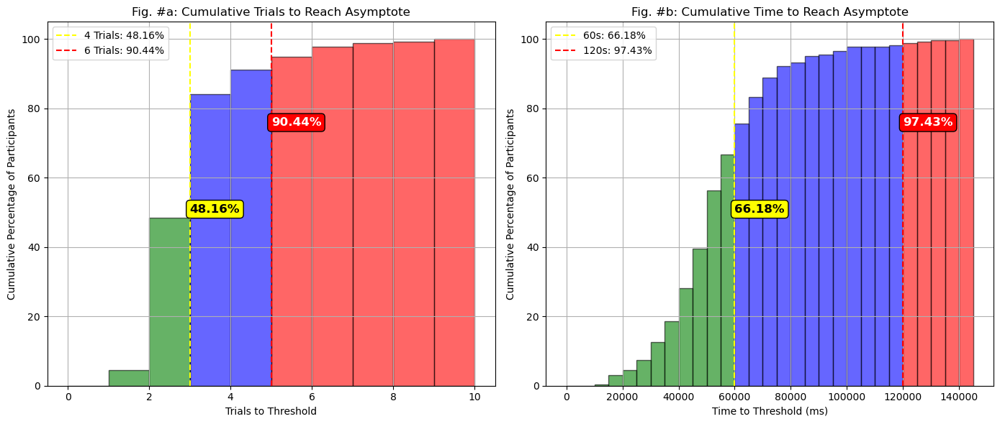

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # Two-column subplots

asym_trial = proc_cal_data['asym_trial'].dropna()
sorted_trials = np.sort(asym_trial)
cumulative_counts = np.arange(1, len(sorted_trials) + 1) / len(sorted_trials) * 100

bin_edges_trial = np.arange(0, 11, 1)  
cumulative_hist_trial, _ = np.histogram(sorted_trials, bins=bin_edges_trial)
cumulative_hist_trial = np.cumsum(cumulative_hist_trial) / len(sorted_trials) * 100

colors_trial = ['green' if edge < 3 else 'blue' if edge < 5 else 'red' for edge in bin_edges_trial[:-1]]
thresh_2_trial = np.round(len(proc_cal_data[proc_cal_data['asym_trial'] < 3]) / len(proc_cal_data) * 100, 2)
thresh_3_trial = np.round(len(proc_cal_data[proc_cal_data['asym_trial'] < 5]) / len(proc_cal_data) * 100, 2)

axes[0].bar(bin_edges_trial[:-1], cumulative_hist_trial, width=1, align='edge', color=colors_trial, edgecolor='black', alpha=0.6)
axes[0].axvline(x=3, color='yellow', linestyle='--', label=f'4 Trials: {thresh_2_trial}%')
axes[0].axvline(x=5, color='red', linestyle='--', label=f'6 Trials: {thresh_3_trial}%')

axes[0].text(3, 50, f"{thresh_2_trial}%", color="black", fontsize=12, fontweight="bold", 
         bbox=dict(facecolor="yellow", edgecolor="black", boxstyle="round,pad=0.3"))
axes[0].text(5, 75, f"{thresh_3_trial}%", color="white", fontsize=12, fontweight="bold", 
         bbox=dict(facecolor="red", edgecolor="black", boxstyle="round,pad=0.3"))

axes[0].set_xlabel("Trials to Threshold")
axes[0].set_ylabel("Cumulative Percentage of Participants")
axes[0].set_title("Fig. #a: Cumulative Trials to Reach Asymptote")
axes[0].legend()
axes[0].grid(True)

asym_time = proc_cal_data['asym_time'].dropna()
sorted_times = np.sort(asym_time)
cumulative_counts_time = np.arange(1, len(sorted_times) + 1) / len(sorted_times) * 100

bin_edges_time = np.arange(0, sorted_times.max() + 5000, 5000)
cumulative_hist_time, _ = np.histogram(sorted_times, bins=bin_edges_time)
cumulative_hist_time = np.cumsum(cumulative_hist_time) / len(sorted_times) * 100

colors_time = ['green' if edge < 60000 else 'blue' if edge < 120000 else 'red' for edge in bin_edges_time[:-1]]
thresh_2_time = np.round(len(proc_cal_data[proc_cal_data['asym_time'] < 60000]) / len(proc_cal_data) * 100, 2)
thresh_3_time = np.round(len(proc_cal_data[proc_cal_data['asym_time'] < 120000]) / len(proc_cal_data) * 100, 2)

axes[1].bar(bin_edges_time[:-1], cumulative_hist_time, width=5000, align='edge', color=colors_time, edgecolor='black', alpha=0.6)
axes[1].axvline(x=60000, color='yellow', linestyle='--', label=f'60s: {thresh_2_time}%')
axes[1].axvline(x=120000, color='red', linestyle='--', label=f'120s: {thresh_3_time}%')

axes[1].text(60000, 50, f"{thresh_2_time}%", color="black", fontsize=12, fontweight="bold", 
         bbox=dict(facecolor="yellow", edgecolor="black", boxstyle="round,pad=0.3"))
axes[1].text(120000, 75, f"{thresh_3_time}%", color="white", fontsize=12, fontweight="bold", 
         bbox=dict(facecolor="red", edgecolor="black", boxstyle="round,pad=0.3"))

axes[1].set_xlabel("Time to Threshold (ms)")
axes[1].set_ylabel("Cumulative Percentage of Participants")
axes[1].set_title("Fig. #b: Cumulative Time to Reach Asymptote")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()

How many trials do ptps need to adapt?

In [16]:
trial_thres = 3
num_ptps_asym_before_trial_X = len([trial for trial in proc_cal_data['asym_trial'] if trial is not None and trial <= trial_thres])
print(f'~{np.round((num_ptps_asym_before_trial_X/len(proc_cal_data["asym_trial"])) * 100, 2)}% participants reach asymptote during or before trial {trial_thres}')

trial_thres = 5
num_ptps_asym_before_trial_X = len([trial for trial in proc_cal_data['asym_trial'] if trial is not None and trial <= trial_thres])
print(f'~{np.round((num_ptps_asym_before_trial_X/len(proc_cal_data["asym_trial"])) * 100, 2)}% participants reach asymptote during or before trial {trial_thres}')


~83.46% participants reach asymptote during or before trial 3
~94.12% participants reach asymptote during or before trial 5


In [17]:
trial_thres = 120000
num_ptps_asym_before_trial_X = len([trial for trial in proc_cal_data['asym_time'] if trial is not None and trial <= trial_thres])
print(f'~{np.round((num_ptps_asym_before_trial_X/len(proc_cal_data["asym_time"])) * 100, 2)}% participants reach asymptote during or before {trial_thres/1000}ms')

trial_thres = 300000
num_ptps_asym_before_trial_X = len([trial for trial in proc_cal_data['asym_time'] if trial is not None and trial <= trial_thres])
print(f'~{np.round((num_ptps_asym_before_trial_X/len(proc_cal_data["asym_time"])) * 100, 2)}% participants reach asymptote during or before {trial_thres/1000}ms')


~97.43% participants reach asymptote during or before 120.0ms
~99.26% participants reach asymptote during or before 300.0ms


Do ptps trend positively or negatively after asymptote? How strong are those trends?

In [18]:
proc_cal_data['final_3_mean_lambda'] = proc_cal_data['lambda_vals_at_crashes'].apply(
    lambda lambda_list: (np.mean(list(lambda_list)[-3:]) if lambda_list is not None else np.nan))


In [19]:
proc_cal_data['diff_after_asym'] = proc_cal_data['asym_lambda'] - proc_cal_data['final_3_mean_lambda']
proc_cal_data['cat_diff_after_asym'] = proc_cal_data['diff_after_asym'].apply(lambda x: 1 if x >= 0 else 0)


In [20]:
proc_cal_data['std_after_asym_trial'] = np.nan

proc_cal_data['std_after_asym_trial'] = proc_cal_data.apply(
    lambda row: np.std(row['lambda_vals_at_crashes'][int(row['asym_trial']):]) 
    if pd.notna(row['asym_trial']) and isinstance(row['lambda_vals_at_crashes'], (list, np.ndarray)) 
    else np.nan, 
    axis=1
    )

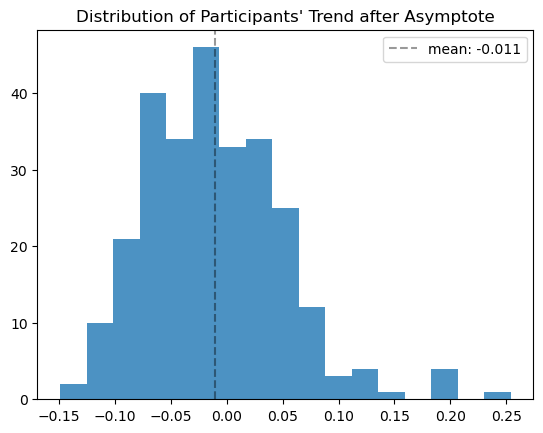

In [21]:
plot_dist(proc_cal_data['diff_after_asym'], "Distribution of Participants' Trend after Asymptote", perc_thresh=0)


## Checking for Outliers
Things to check for:
- Ptps whose performance hasn't stabilized even after asymptote ('std_after_asym_trial')
- Ptps whose performance dropped significantly after asymptote ('diff_after_asym')
- Ptps who never reach asymptote (['asym_trial'].isna())
- Ptps whose plateaued performance is remarkably low (*'diff_after_asym' and 'mst' or 'asym_lambda' are significantly low*)
- Ptps with statistical outliers for MST, asym_lambda, or cal_duration

Detecting Outliers

In [22]:
def detect_outliers_std(df, column, all_outliers=None, threshold=3, upper=True, lower=True):
    if isinstance(column, list):
        for col in column:
            df = detect_outliers_std(df, col, all_outliers=all_outliers, threshold=threshold, upper=upper, lower=lower)
    else:
        mean = df[column].mean()
        std = df[column].std()
        lower_bound = mean - threshold * std
        upper_bound = mean + threshold * std

        outlier_label = f"{column}_outlier"
        if upper and lower:
            outliers = ((df[column] < lower_bound) | (df[column] > upper_bound) | (df[column].isna())).astype(int)
        elif not upper and lower:
            outliers = ((df[column] < lower_bound) | (df[column].isna())).astype(int)
        elif upper and not lower:
            outliers = ((df[column] > upper_bound) | (df[column].isna())).astype(int)
        else:
            return df

        if all_outliers is not None:
            df[all_outliers] = df.get(all_outliers, 0) | outliers
        df[outlier_label] = outliers

    return df

In [23]:
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['std_after_asym_trial'], 
                                    all_outliers='calCST_outlier', lower=False)
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['diff_after_asym'], 
                                    all_outliers='calCST_outlier', lower=False)
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['motor_stability_threshold'], 
                                    all_outliers='calCST_outlier', upper=False)
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['asym_trial'], 
                                    all_outliers='calCST_outlier', lower=False)
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['asym_lambda'], 
                                    all_outliers='calCST_outlier', upper=False)
proc_cal_data = detect_outliers_std(proc_cal_data, 
                                    ['cal_duration'], 
                                    all_outliers='calCST_outlier', upper=False)


Plotting Outliers' Calibration Data

In [24]:
ptps_in_base_paper = pd.read_csv('/home/workspace/files/DGB/Projects/cpCST/data/raw/cpcst_base_Ss.csv')

In [25]:
ptps_in_base_paper_crash_data = proc_cal_data[proc_cal_data['participant'].isin(ptps_in_base_paper['ursi'].values)]

In [26]:
len(ptps_in_base_paper_crash_data[ptps_in_base_paper_crash_data['asym_time']<=90000])/163

0.9447852760736196

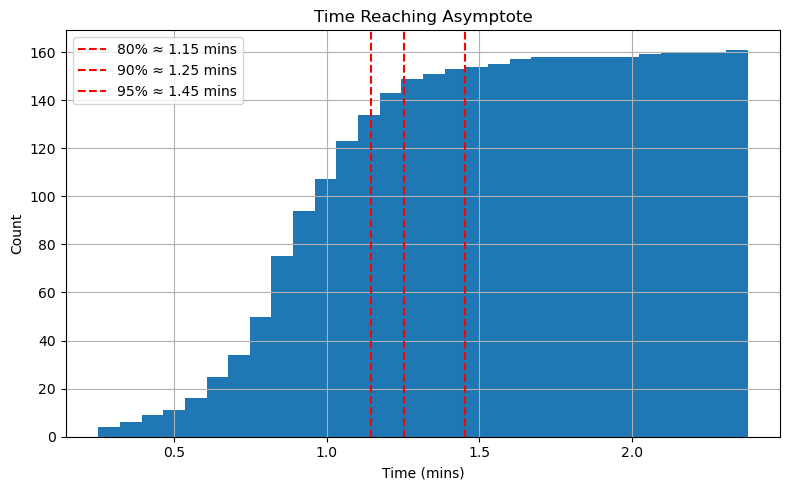

In [27]:
data = ptps_in_base_paper_crash_data['asym_time'].dropna()
data = data/60000

percentiles = [80, 90, 95]
thresholds = {p: np.percentile(data, p) for p in percentiles}

plt.figure(figsize=(8, 5))
data.hist(bins=30, cumulative=True)

for p, val in thresholds.items():
    plt.axvline(val, color='red', linestyle='--', label=f"{p}% ≈ {np.round(val, 2)} mins")

plt.title("Time Reaching Asymptote")
plt.xlabel("Time (mins)")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
plt.show()

In [28]:
'''
Additionally, only ~62.0% asymptoted in 1 minute but ~94.5% reach asymptote in 1.5 mins
'''

'\nAdditionally, only ~62.0% asymptoted in 1 minute but ~94.5% reach asymptote in 1.5 mins\n'

std_after_asym_trial_outlier


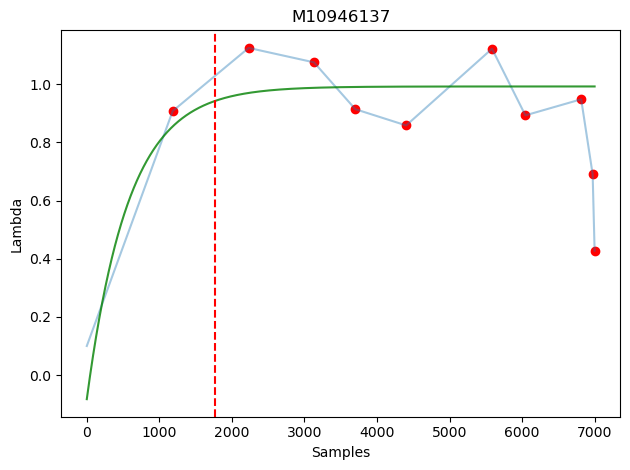

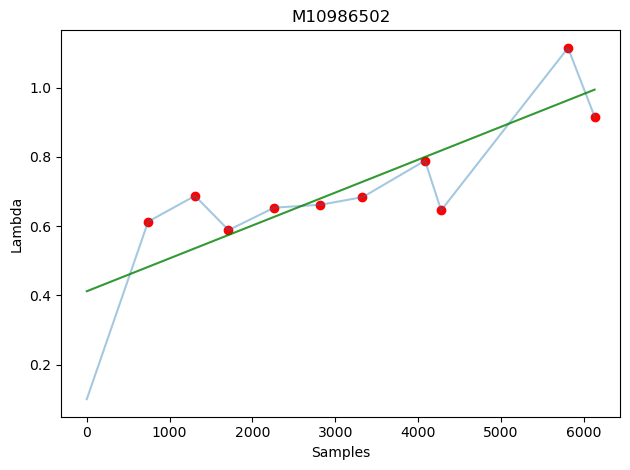

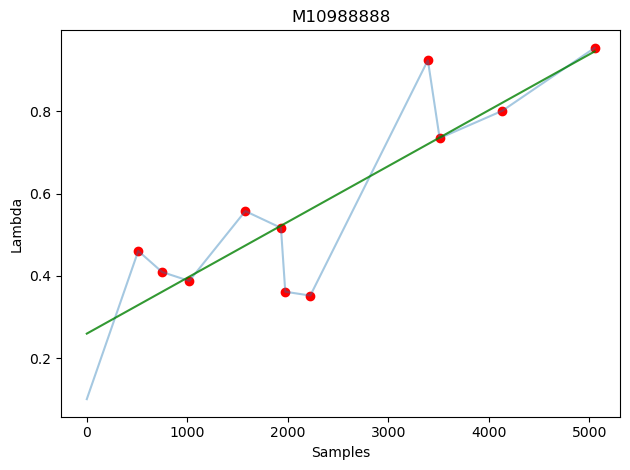

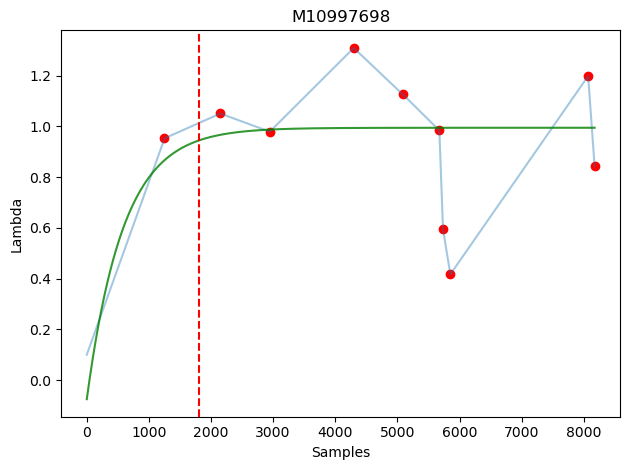

diff_after_asym_outlier


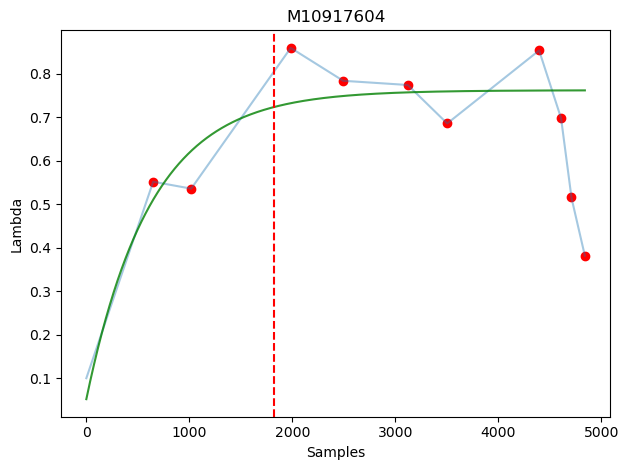

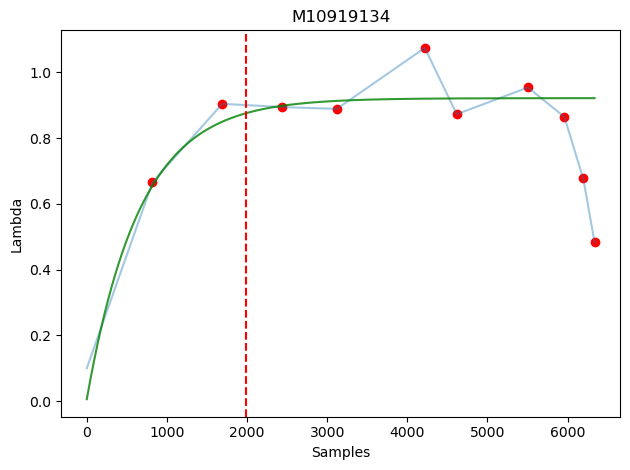

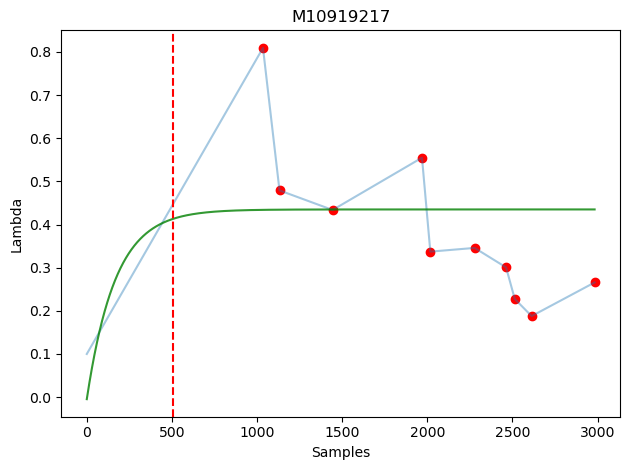

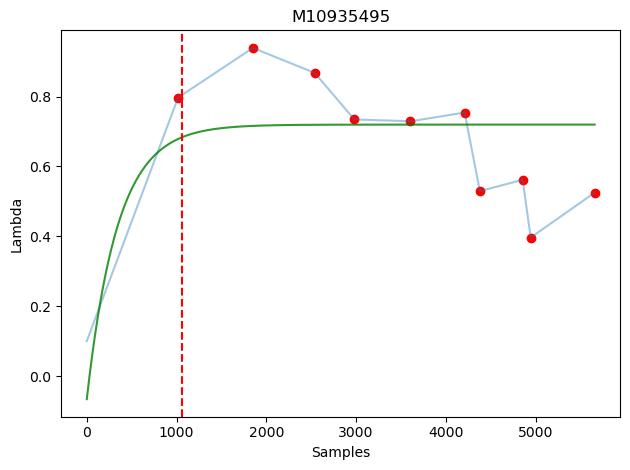

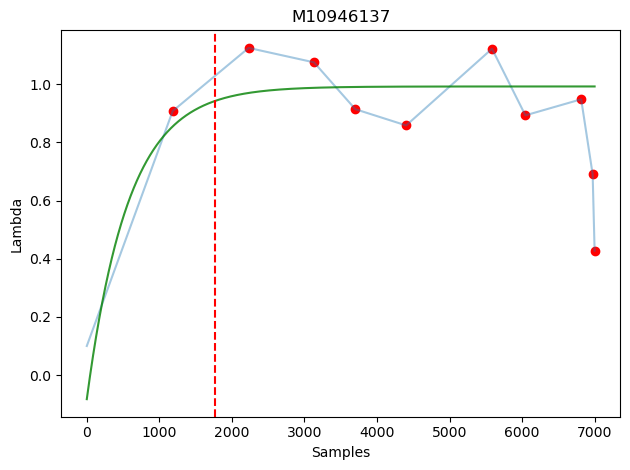

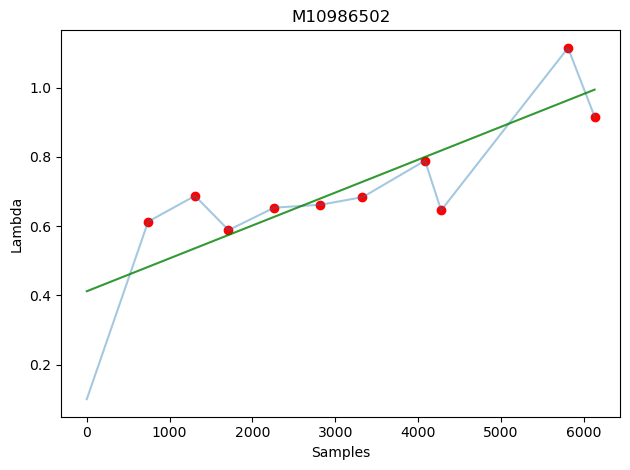

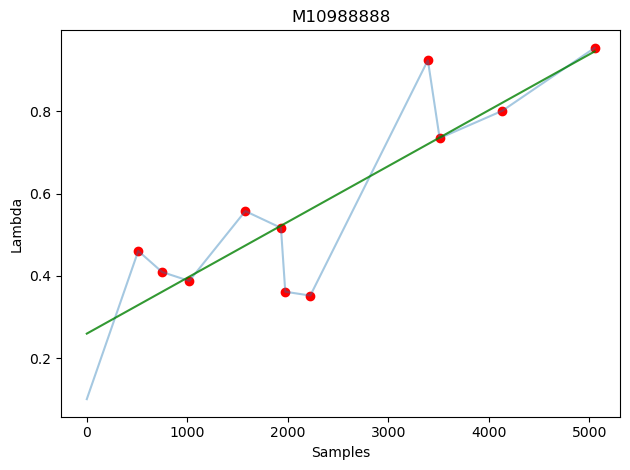

motor_stability_threshold_outlier


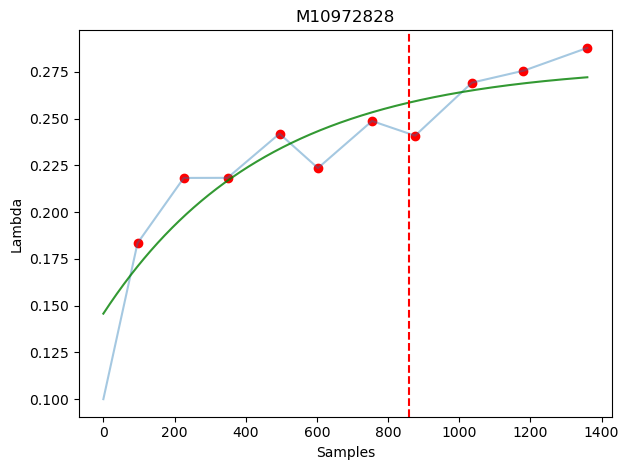

asym_trial_outlier


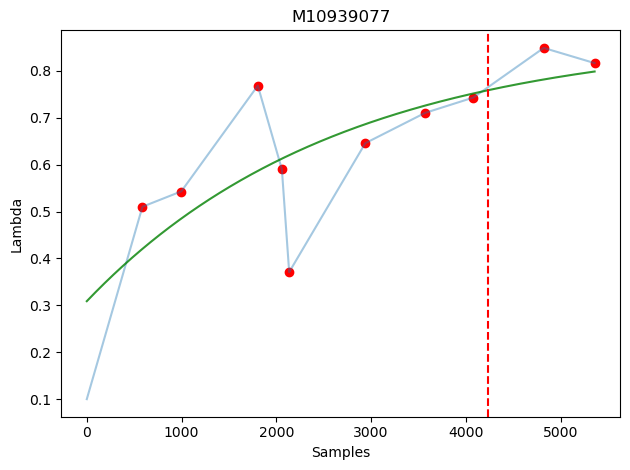

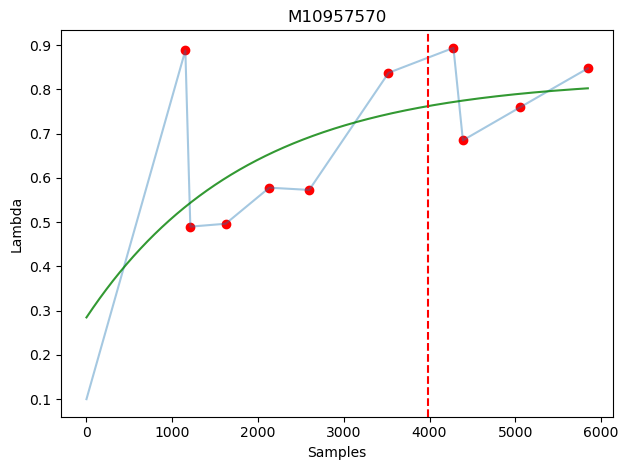

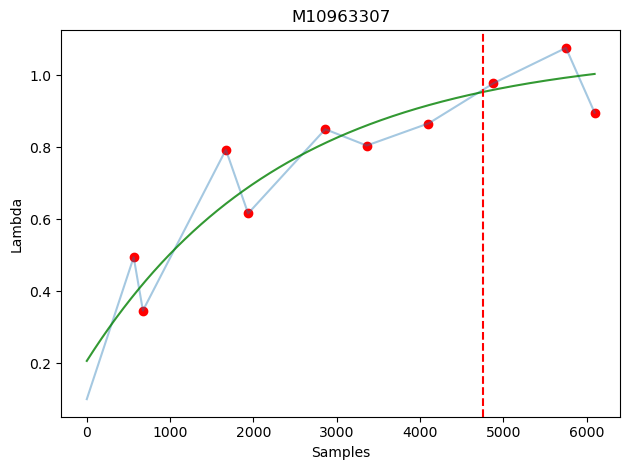

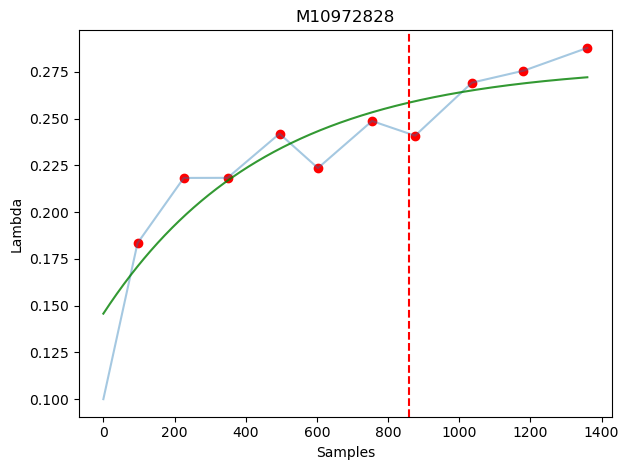

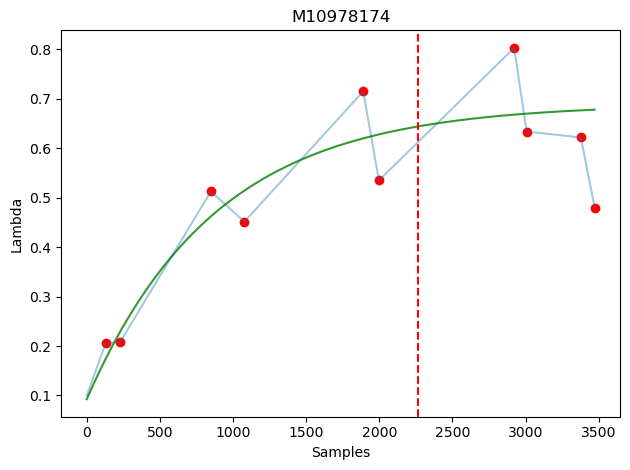

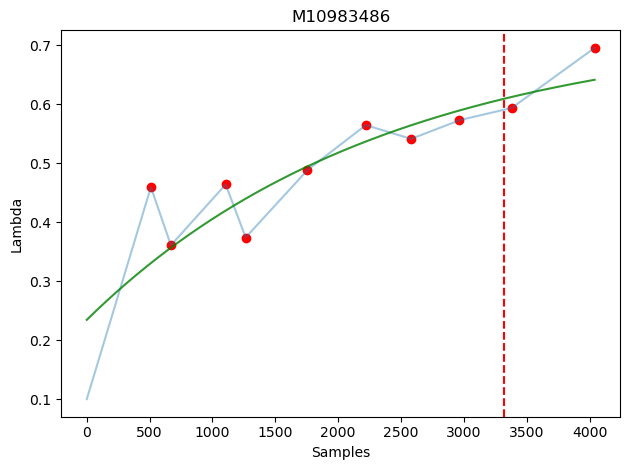

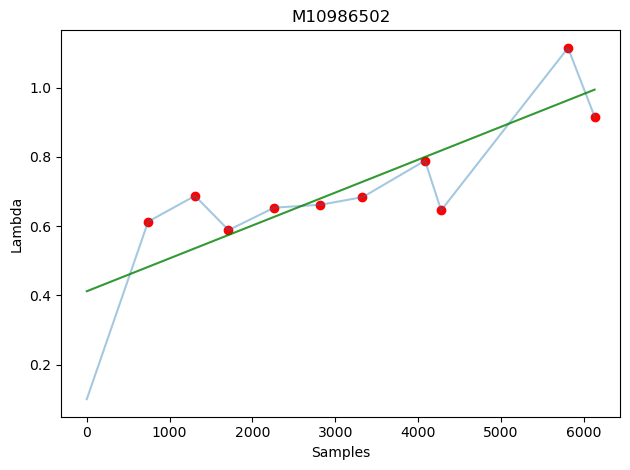

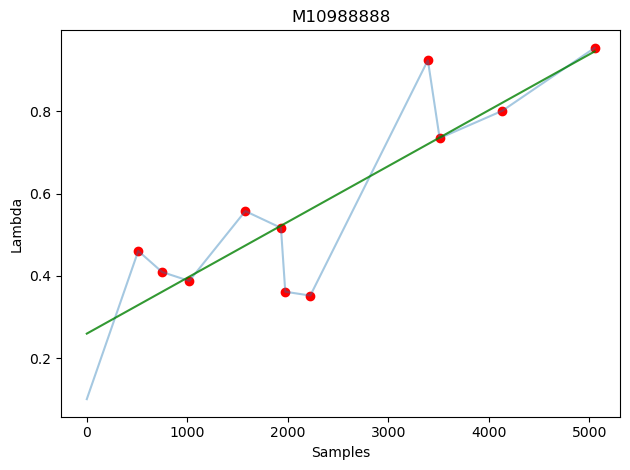

asym_lambda_outlier


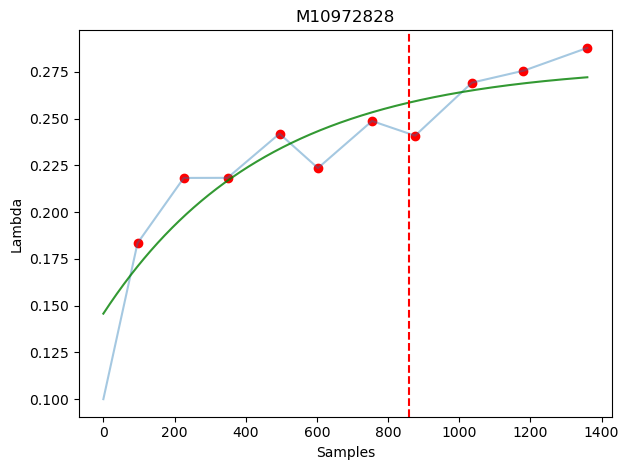

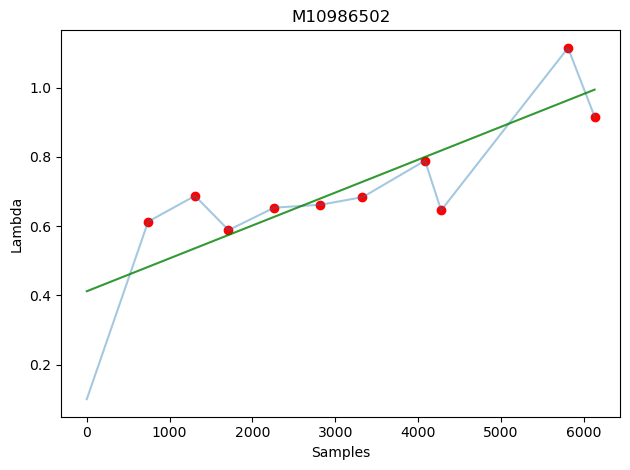

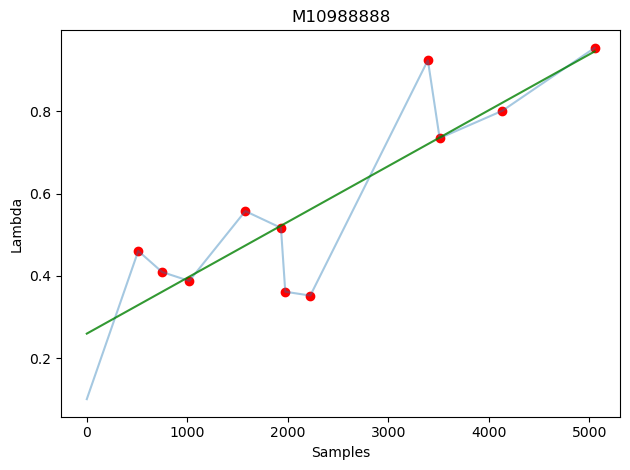

cal_duration_outlier


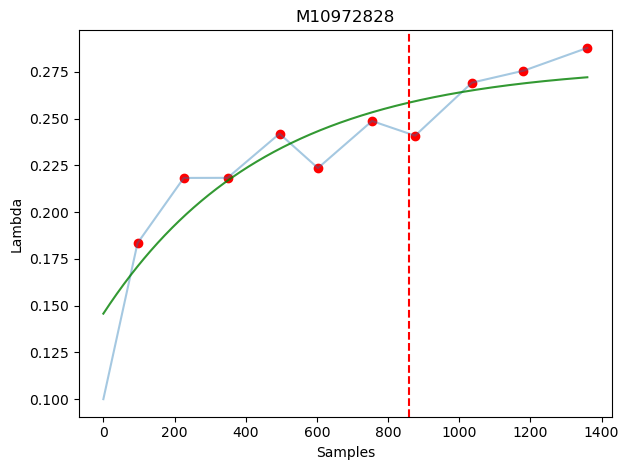

In [29]:
outlier_data = proc_cal_data[proc_cal_data['calCST_outlier']==1]
outlier_cols = [col for col in proc_cal_data.columns if 'outlier' in col and 'calCST' not in col]
for col in outlier_cols:
    print(col)
    for ptp_ind, ptp_num in proc_cal_data[proc_cal_data[col]==1]['participant'].items():
        ptp_data = proc_cal_data.loc[ptp_ind]
        lambda_vals = ptp_data['lambda_vals']
        ind_at_crashes = proc_cal_data.loc[ptp_ind, 'lambda_idx_at_crashes']
        lambda_vals_at_crashes = proc_cal_data.loc[ptp_ind, 'lambda_vals_at_crashes']
        plt.scatter(ind_at_crashes, lambda_vals_at_crashes, color='red', alpha=1)
        plt.plot(lambda_vals, alpha=0.4)
        plt.plot(ptp_data['raw_fitted_curve'], color='g', alpha=0.8)
        plt.axvline(ptp_data['asym_idx'], color='r', linestyle='--', alpha=1)
        plt.ylabel('Lambda')
        plt.xlabel('Samples')
        plt.title(ptp_num)

        plt.tight_layout()
        plt.show()

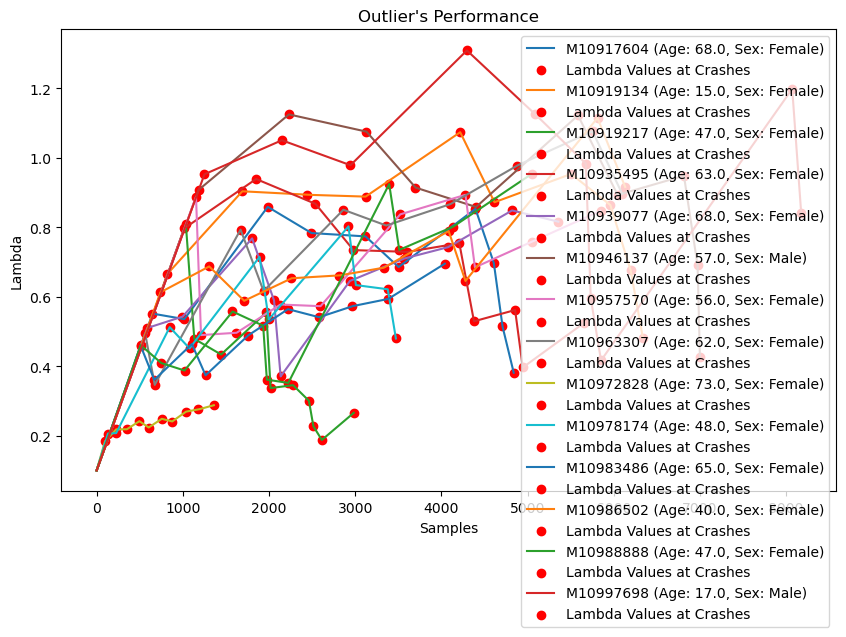

In [30]:
plt.figure(figsize=(10, 6))
outlier_data = proc_cal_data[proc_cal_data.calCST_outlier==1]

for ind in outlier_data.index:
    outlier_m_num = outlier_data.loc[ind, 'participant']
    outlier_age = outlier_data.loc[ind, 'age']
    outlier_sex = 'Male' if outlier_data.loc[ind, 'sex_f'] == 0 else 'Female'
    
    plt.plot(outlier_data.loc[ind, 'lambda_vals'], label=f'{outlier_m_num} (Age: {outlier_age}, Sex: {outlier_sex})')
    plt.scatter(outlier_data.loc[ind, 'lambda_idx_at_crashes'], 
                    outlier_data.loc[ind, 'lambda_vals_at_crashes'], 
                    c='red', label='Lambda Values at Crashes')
    

plt.title("Outlier's Performance")
plt.xlabel('Samples')
plt.ylabel('Lambda')
plt.legend()
plt.show()

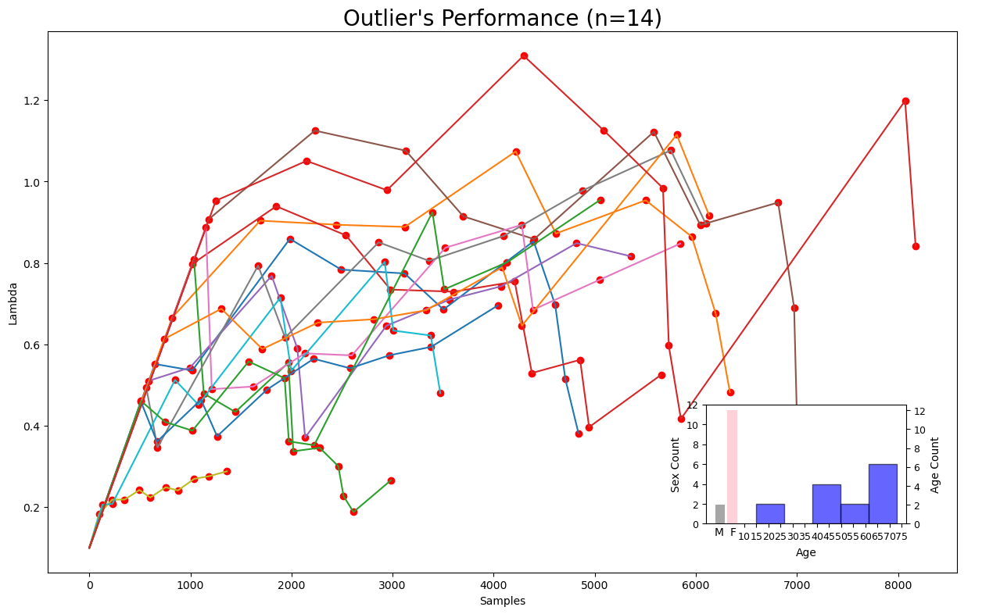

In [31]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.figure(figsize=(15, 9))
outlier_data = proc_cal_data[proc_cal_data.calCST_outlier == 1]

for ind in outlier_data.index:
    outlier_m_num = outlier_data.loc[ind, 'participant']
    outlier_age = outlier_data.loc[ind, 'age']
    outlier_sex = 'Female' if outlier_data.loc[ind, 'sex_f'] == 1 else 'Male'
    
    plt.plot(outlier_data.loc[ind, 'lambda_vals'], label=f'{outlier_m_num} (Age: {outlier_age}, Sex: {outlier_sex})')
    plt.scatter(outlier_data.loc[ind, 'lambda_idx_at_crashes'], 
                outlier_data.loc[ind, 'lambda_vals_at_crashes'], 
                c='red')

plt.title(f"Outlier's Performance (n={len(outlier_data)})", fontsize=20)
plt.xlabel('Samples')
plt.ylabel('Lambda')

ax_inset = inset_axes(plt.gca(), width="22%", height="22%", loc='lower right', bbox_to_anchor=(-0.05, 0.08, 1, 1), bbox_transform=plt.gca().transAxes)

bins = np.linspace(outlier_data['age'].min(), outlier_data['age'].max(), 6)
hist_vals, bin_edges, _ = ax_inset.hist(outlier_data['age'], bins=bins, color='blue', alpha=0.6, edgecolor='black')

ax_inset.set_xlabel("Age", fontsize=10, labelpad=5)
ax_inset.set_ylabel("Age Count", fontsize=10)
ax_inset.set_xticks(np.arange(10, max(outlier_data['age'])+5, 5))
ax_inset.set_xticklabels([f'{int(x)}' for x in np.arange(10, max(outlier_data['age'])+5, 5)], fontsize=9)

sex_counts = outlier_data['sex_f'].value_counts()
ax_sex = ax_inset.twinx()
bar_width = 4  # Set the width for the bars

# Move the bars apart by adjusting their positions
ax_sex.bar(np.array([0, 5]), [sex_counts.get(0, 0), sex_counts.get(1, 0)], 
           color=['gray', 'pink'], alpha=0.7, width=bar_width)

# Swap the y-axes labels and their corresponding data
ax_inset.set_ylabel("Sex Count", fontsize=10)
ax_sex.set_ylabel("Age Count", fontsize=10)
ax_inset.tick_params(axis='x', labelsize=9)
ax_inset.tick_params(axis='y', labelsize=9)
ax_sex.tick_params(axis='y', labelsize=9)

ax_sex.set_yticks(np.arange(0, max(sex_counts.max(), hist_vals.max()) + 1, step=2))  # Reduced step size by 2

# Increase the step size of the left y-axis by 2
ax_inset.set_yticks(np.arange(0, max(sex_counts.max(), hist_vals.max()) + 1, step=2))

# Adding 'M' and 'F' under the Male and Female bars
ax_sex.text(-0.5, -0.3, 'M', ha='center', va='top', fontsize=10)
ax_sex.text(5.5, -0.3, 'F', ha='center', va='top', fontsize=10)

plt.show()

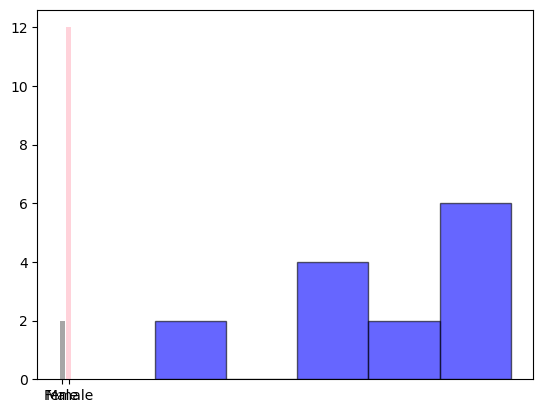

In [32]:
plt.hist(outlier_data['age'], bins=5, 
              color='blue', alpha=0.6, edgecolor='black')
sex_counts = outlier_data['sex_f'].value_counts()
plt.bar(['Male', 'Female'], [sex_counts.get(0, 0), sex_counts.get(1, 0)], color=['gray', 'pink'], alpha=0.7)
plt.show()

In [33]:
outlier_data['participant'].values

array(['M10917604', 'M10919134', 'M10919217', 'M10935495', 'M10939077',
       'M10946137', 'M10957570', 'M10963307', 'M10972828', 'M10978174',
       'M10983486', 'M10986502', 'M10988888', 'M10997698'], dtype=object)

## Effects of Age and Sex

In [34]:
def prepare_data_for_model(data, model_effects):
    """Prepare data for modeling by adding required derived columns."""
    data = data.copy()
    if 'np.power(age, 2)' in model_effects:
        data['age_squared'] = np.power(data['age'], 2)
        model_effects = ['age_squared' if effect == 'np.power(age, 2)' else effect for effect in model_effects]
    return data, model_effects

def calculate_predictions(model, x_vals, model_effects):
    coef = model.params
    y_vals = np.full_like(x_vals, coef['Intercept'])  # Create an array of intercepts with the same shape as x_vals
    if 'age' in model_effects:
        y_vals += coef.get('age', 0) * x_vals
    if 'age_squared' in model_effects:
        y_vals += coef.get('age_squared', 0) * np.power(x_vals, 2)

    x_pred = {'age': x_vals, 'age_squared': np.power(x_vals, 2), 'sex_f': 0}
    x_pred = {k: v for k, v in x_pred.items() if k in model_effects}
    x_pred = pd.DataFrame(x_pred, index=np.arange(len(x_vals)))  # Add an index here
    x_pred = sm.add_constant(x_pred, has_constant='add')

    pred = model.get_prediction(x_pred)
    conf_int = pred.conf_int(alpha=0.05)
    return y_vals, conf_int[:, 0], conf_int[:, 1]

def plot_effect(ax, x, y, x_vals, y_vals, y_lower, y_upper, sex_f, vector, model_effects, p_vals, palette):
    """Plot the scatter, line of best fit, and confidence intervals for one effect."""
    sns.scatterplot(x=x, y=y, hue=sex_f, palette=palette, alpha=0.7, ax=ax, legend=False)
    ax.plot(x_vals, y_vals, color='red', label='Best Fit Line', linewidth=2)
    ax.fill_between(x_vals, y_lower, y_upper, color='red', alpha=0.2, label='95% Confidence Interval')

    ax.set_xlabel('Age')
    ax.set_ylabel(vector)
    p_val_text = ", ".join(
        f"{effect}: {'<0.001**' if p < 0.001 else f'={np.round(p, 3)}*' if p < 0.05 else f'={np.round(p, 3)}'}"
        for effect, p in p_vals.items() if p is not None
    )
    ax.set_title(f'{vector} vs. Age\n(p-values: {p_val_text})')

def plot_all_effects(data, title=None, col_num=3, model_effects=None, fname=None):
    """Main function to model and plot effects of predictors on dependent variables."""
    if model_effects is None:
        model_effects = ['age', 'sex_f', 'np.power(age, 2)']
    data = data.astype(float)

    data, model_effects = prepare_data_for_model(data, model_effects)

    formula_base = ' + '.join(model_effects)
    significant_vectors = []
    p_values_dict = {}  # Dictionary to store p-values

    for vector in data.columns:
        if vector in ['participant', 'age', 'sex_f', 'age_squared'] or 'age' not in data:
            continue

        data = data[data[vector].notna()]
        model_formula = f'{vector} ~ {formula_base}'
        model = smf.ols(model_formula, data=data).fit()

        significant_vectors.append((vector, model))
        # Store the p-values for each model effect
        p_values_dict[vector] = {effect: np.round(model.pvalues.get(effect, None), 5) for effect in model_effects}

    if not significant_vectors:
        print("No significant effects found.")
        return pd.DataFrame()  # Return an empty DataFrame if no significant vectors

    n_cols = col_num
    n_rows = (len(significant_vectors) + n_cols - 1) // n_cols
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
    axs = axs.flatten()

    palette = {0: 'blue', 1: 'red'}

    for i, (vector, model) in enumerate(significant_vectors):
        x = data['age']
        y = data[vector]
        sex_f = data['sex_f']
        x_vals = np.linspace(x.min(), x.max(), 100)

        try:
            y_vals, y_lower, y_upper = calculate_predictions(model, x_vals, model_effects)
        except Exception as e:
            print(f"Prediction failed for {vector}: {e}")
            continue

        p_vals = p_values_dict.get(vector, {})
        plot_effect(axs[i], x, y, x_vals, y_vals, y_lower, y_upper, sex_f, vector, model_effects, p_vals, palette)

    for j in range(len(significant_vectors), len(axs)):
        fig.delaxes(axs[j])

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    if title:
        plt.suptitle(title, fontsize=20, y=1.04)
    plt.show()

    p_values_df = pd.DataFrame(p_values_dict)
    if fname is not None:
        p_values_df.to_csv(fname)
    return p_values_df


In [35]:
proc_data_dirs = '/home/workspace/files/Data/Processed/RS2/cpCST/'

ind_diff_data_dirs = os.path.join(proc_data_dirs, 'individual_differences_datasets')

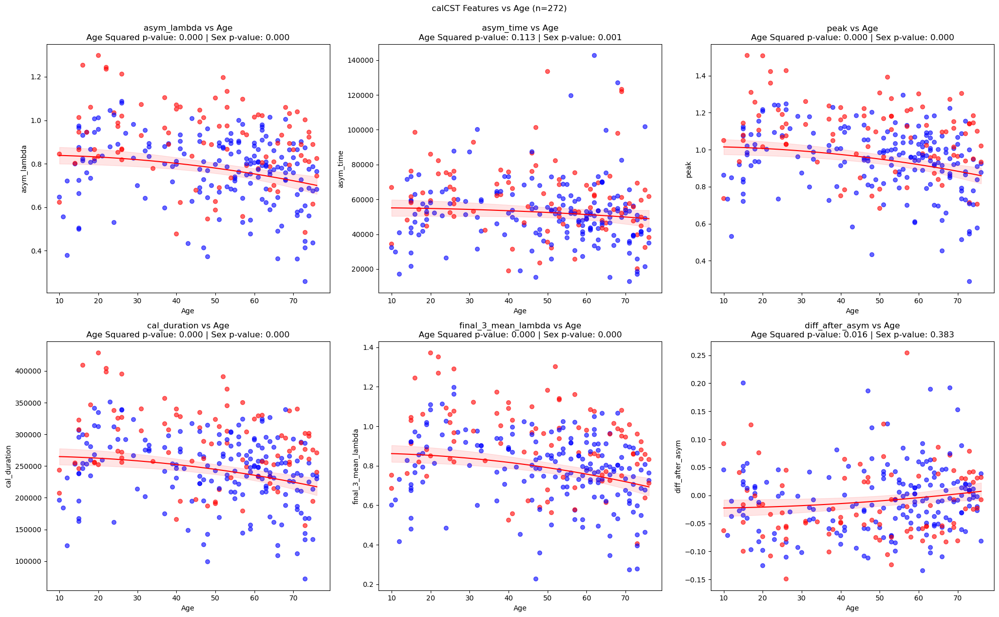

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.formula.api as smf
import pandas as pd

# Your data preprocessing step
data_filt = proc_cal_data[['asym_lambda', 'asym_time', 'peak', 'cal_duration', 
                           'final_3_mean_lambda', 'diff_after_asym', 'age', 'sex_f']]
data_filt['age_squared'] = data_filt['age'] ** 2

# Define the model effects to include both the quadratic effect of age and sex
model_effects = ['age_squared', 'sex_f']

vectors = [col for col in data_filt if col not in ['age', 'age_squared', 'sex_f']]
cols = 3
rows = int(np.ceil(len(vectors) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 12))

ax = axes.flatten()

# Loop over the dependent variables (vectors)
for i, dep in enumerate(vectors):
    # Define the formula with the quadratic effect of age and sex as predictors
    formula = f'{dep} ~ age_squared + sex_f'

    # Fit the model
    model = smf.ols(formula=formula, data=data_filt).fit()

    # Extract the p-values for age_squared and sex_f
    age_squared_pvalue = model.pvalues['age_squared']
    sex_f_pvalue = model.pvalues['sex_f']

    # Scatter plot with color coding for sex_f
    colors = data_filt['sex_f'].map({0: 'red', 1: 'blue'})
    ax[i].scatter(data_filt['age'], data_filt[dep], label='Data', c=colors, alpha=0.6)

    # Generate prediction values across the age range (use linear and quadratic effects of age)
    x_vals = np.linspace(data_filt['age'].min(), data_filt['age'].max(), 100)
    pred_df = pd.DataFrame({
        'age_squared': x_vals ** 2,  # Quadratic effect of age
        'age': x_vals,  # Linear effect of age
        'sex_f': 1  # Assuming sex_f = 1 (you can modify this for different levels of sex)
    })

    # Predict using the model (including sex effect)
    pred = model.get_prediction(pred_df).summary_frame(alpha=0.05)  # 95% CI
    y_vals = pred['mean']
    y_lower, y_upper = pred['mean_ci_lower'], pred['mean_ci_upper']

    # Plot quadratic fit and confidence interval
    ax[i].plot(x_vals, y_vals, label='Quadratic fit', color='red')
    ax[i].fill_between(x_vals, y_lower, y_upper, color='red', alpha=0.1)  # Shaded CI

    # Set the title with p-values
    ax[i].set_title(f'{dep} vs Age\nAge Squared p-value: {age_squared_pvalue:.3f} | Sex p-value: {sex_f_pvalue:.3f}')
    ax[i].set_xlabel('Age')
    ax[i].set_ylabel(dep)

# Final layout adjustments
plt.tight_layout()
plt.suptitle(f'calCST Features vs Age (n={len(data_filt)})', y=1.02)
plt.show()

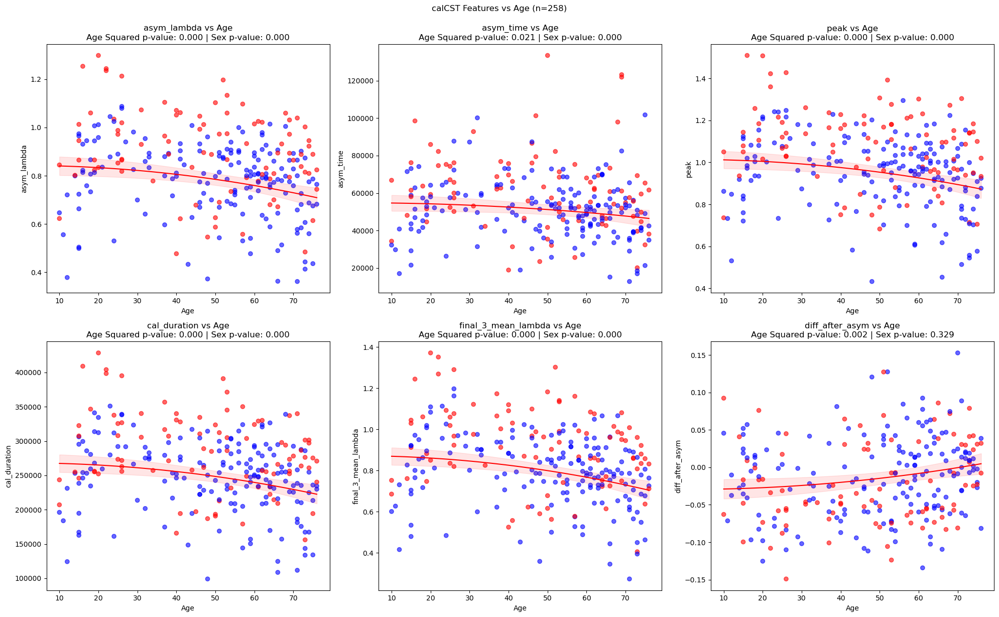

In [37]:
data_filt = proc_cal_data[proc_cal_data.calCST_outlier==0]
data_filt = data_filt[['asym_lambda', 'asym_time', 'peak', 'cal_duration', 
                           'final_3_mean_lambda', 'diff_after_asym', 'age', 'sex_f']]
data_filt['age_squared'] = data_filt['age'] ** 2

# Define the model effects to include both the quadratic effect of age and sex
model_effects = ['age_squared', 'sex_f']

vectors = [col for col in data_filt if col not in ['age', 'age_squared', 'sex_f']]
cols = 3
rows = int(np.ceil(len(vectors) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(20, 12))

ax = axes.flatten()

# Loop over the dependent variables (vectors)
for i, dep in enumerate(vectors):
    # Define the formula with the quadratic effect of age and sex as predictors
    formula = f'{dep} ~ age_squared + sex_f'

    # Fit the model
    model = smf.ols(formula=formula, data=data_filt).fit()

    # Extract the p-values for age_squared and sex_f
    age_squared_pvalue = model.pvalues['age_squared']
    sex_f_pvalue = model.pvalues['sex_f']

    # Scatter plot with color coding for sex_f
    colors = data_filt['sex_f'].map({0: 'red', 1: 'blue'})
    ax[i].scatter(data_filt['age'], data_filt[dep], label='Data', c=colors, alpha=0.6)

    # Generate prediction values across the age range (use linear and quadratic effects of age)
    x_vals = np.linspace(data_filt['age'].min(), data_filt['age'].max(), 100)
    pred_df = pd.DataFrame({
        'age_squared': x_vals ** 2,  # Quadratic effect of age
        'age': x_vals,  # Linear effect of age
        'sex_f': 1  # Assuming sex_f = 1 (you can modify this for different levels of sex)
    })

    # Predict using the model (including sex effect)
    pred = model.get_prediction(pred_df).summary_frame(alpha=0.05)  # 95% CI
    y_vals = pred['mean']
    y_lower, y_upper = pred['mean_ci_lower'], pred['mean_ci_upper']

    # Plot quadratic fit and confidence interval
    ax[i].plot(x_vals, y_vals, label='Quadratic fit', color='red')
    ax[i].fill_between(x_vals, y_lower, y_upper, color='red', alpha=0.1)  # Shaded CI

    # Set the title with p-values
    ax[i].set_title(f'{dep} vs Age\nAge Squared p-value: {age_squared_pvalue:.3f} | Sex p-value: {sex_f_pvalue:.3f}')
    ax[i].set_xlabel('Age')
    ax[i].set_ylabel(dep)

# Final layout adjustments
plt.tight_layout()
plt.suptitle(f'calCST Features vs Age (n={len(data_filt)})', y=1.02)
plt.show()

We had also looked at the distribution of ptp's trends after asymptote based on age

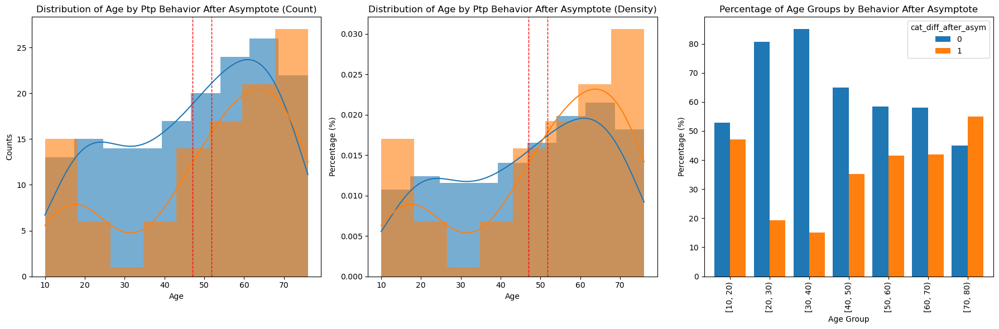

In [38]:
def plot_histograms(data, ax, stat_type='count'):
    for cat, group in data.groupby('cat_diff_after_asym'):
        sns.histplot(group['age'], kde=True, label=f'cat_diff_after_asym {cat}', 
                     alpha=0.6, edgecolor=None, ax=ax, stat=stat_type, common_norm=False if stat_type == 'density' else True)
    
    means = data.groupby('cat_diff_after_asym').age.mean()
    for mean in means:
        ax.axvline(mean, color='red', linestyle='dashed', linewidth=1)

    ax.set_xlabel('Age')
    ax.set_title(f'Distribution of Age by Ptp Behavior After Asymptote ({stat_type.capitalize()})')

def plot_age_group_bars(data, ax):
    bins = list(range(10, 81, 10))
    data['age_group'] = pd.cut(data['age'], bins=bins, right=False)

    grouped_data = data.groupby(['age_group', 'cat_diff_after_asym']).size().unstack(fill_value=0)

    percentage_data = grouped_data.div(grouped_data.sum(axis=1), axis=0) * 100

    percentage_data.plot(kind='bar', ax=ax, width=0.8)
    ax.set_xlabel('Age Group')
    ax.set_ylabel('Percentage (%)')
    ax.set_title('Percentage of Age Groups by Behavior After Asymptote')

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

plot_histograms(proc_cal_data, axes[0], stat_type='count')
plot_histograms(proc_cal_data, axes[1], stat_type='density')

plot_age_group_bars(proc_cal_data, axes[2])

axes[0].set_ylabel('Counts')
axes[1].set_ylabel('Percentage (%)')

plt.tight_layout()
plt.show()

We noticed that the shapes are interestingly different

In [39]:
# Seeing if age can predict the trend based on the diff values
lin_model = smf.ols(f'diff_after_asym ~ age', 
                    data=proc_cal_data.dropna(
                        subset=['age', 'diff_after_asym'])).fit()
print('p=', np.round(lin_model.pvalues['age'], 3))

# Seeing if age can predict the trend based on the categorical values
log_model_data = proc_cal_data.dropna(subset=[
    'age', 'cat_diff_after_asym'])
log_model_data['cat_diff_after_asym'] = log_model_data[
    'cat_diff_after_asym'].astype('category').cat.codes
log_model = smf.logit('cat_diff_after_asym ~ age', 
                      data=log_model_data).fit()
print('p=', np.round(log_model.pvalues['age'], 3))


p= 0.032
Optimization terminated successfully.
         Current function value: 0.662749
         Iterations 5
p= 0.046


# Import Flanker Data

In [40]:
raw_flanker_dirs = '/home/workspace/files/Data/Raw/RS2/Flanker/jan_31_2025_drop/'
raw_flanker_dict = {}
for i, file in enumerate(os.listdir(raw_flanker_dirs)):
    if 'test' not in file.lower() and 'eye' not in file.lower():
        ptp = file.split('_')[0].split('-')[-1]
        df = pd.read_csv(os.path.join(raw_flanker_dirs, file))
        if 'sectionname' in df.iloc[0].values:
            df.columns = df.iloc[0]
            df = df[1:].reset_index(drop=True) 
        df = df.applymap(lambda x: pd.to_numeric(x, errors='ignore') if isinstance(x, str) else x)
        raw_flanker_dict[ptp] = df

If looking for mean time between onsets of trials

In [41]:
iti_dict = {}
for ptp in raw_flanker_dict.keys():
    data = raw_flanker_dict[ptp]
    practice_data = data[(data['sectionname'].str.contains('Practice', na=False)) & (data['condition'].notna())]
    raw_data = data[(data['sectionname'].str.contains('Stim', na=False)) & (data['condition'].notna())]

    stim1 = raw_data[raw_data['sectionname'].str.contains('Stim1')]
    stim2 = raw_data[raw_data['sectionname'].str.contains('Stim2')]
    stim3 = raw_data[raw_data['sectionname'].str.contains('Stim3')]

    stim1_iti = list(np.diff(stim1['starttime']))
    stim2_iti = list(np.diff(stim2['starttime']))
    stim3_iti = list(np.diff(stim3['starttime']))

    iti_dict[ptp] = np.mean(stim1_iti + stim2_iti + stim3_iti)

If looking for mean time between offset and onset of trials

In [42]:
iti_dict = {}
for ptp in raw_flanker_dict.keys():
    data = raw_flanker_dict[ptp]
    practice_data = data[(data['sectionname'].str.contains('Practice', na=False)) & (data['condition'].notna())]
    raw_data = data[(data['sectionname'].str.contains('Stim', na=False)) & (data['condition'].notna())]

    stim1 = raw_data[raw_data['sectionname'].str.contains('Stim1')]
    stim2 = raw_data[raw_data['sectionname'].str.contains('Stim2')]
    stim3 = raw_data[raw_data['sectionname'].str.contains('Stim3')]

    stim1_iti = list(np.array(stim1['starttime'])[1:] - np.array(stim1['endtime'])[:-1])
    stim2_iti = list(np.array(stim2['starttime'])[1:] - np.array(stim2['endtime'])[:-1])
    stim3_iti = list(np.array(stim3['starttime'])[1:] - np.array(stim3['endtime'])[:-1])

    iti_dict[ptp] = np.mean(stim1_iti + stim2_iti + stim3_iti)

In [43]:
filter_outlier = lambda x: x[x < (np.mean(x) + np.std(x)*3)]
flanker_data_features = {}
flanker_log = {}
for ptp in raw_flanker_dict.keys():
    data = raw_flanker_dict[ptp]
    practice_data = data[(data['sectionname'].str.contains('Practice', na=False)) & (data['condition'].notna())]
    raw_data = data[(data['sectionname'].str.contains('Stim', na=False)) & (data['condition'].notna())]
    
    flanker_data_features[ptp] = {}
    flanker_log[ptp] = {}
    
    #--------------------------------------- Across all Trials Types
    # Counting Problematic Accuracy
    accuracy = raw_data.accuracy.sum()/len(raw_data)
    if accuracy < 0.8:
        flanker_log[ptp]['accuracy_below_80%'] = 1
    else:
        flanker_log[ptp]['accuracy_below_80%'] = 0
    
    # Counting Problematic RTs
    raw_accurate_data = raw_data[raw_data.accuracy == 1]
    preemptive_resp_count = len(raw_accurate_data[raw_accurate_data['delta'] < 0.2])
    
    rt_var, rt_mean = raw_accurate_data['delta'].std(), raw_accurate_data['delta'].mean()
    upper_bound = (3 * rt_var) + rt_mean
    delayed_resp_count = len(raw_accurate_data[raw_accurate_data['delta'] > upper_bound])
    
    flanker_log[ptp]['preemptive_response_count'] = preemptive_resp_count
    flanker_log[ptp]['delayed_resp_count'] = delayed_resp_count
    
    # Removing Problematic RTs
    raw_data = raw_data[(raw_data['delta'] > 0.2) & (raw_data['delta'] < upper_bound)]
    raw_accurate_data = raw_data[raw_data.accuracy == 1]
    
    # Getting Features Across all Trials
    accuracy = raw_data.accuracy.sum()/len(raw_data)
    flanker_data_features[ptp]['grand_mean_accuracy'] = float(accuracy)
    flanker_data_features[ptp]['grand_mean_error_rate'] = 1-float(accuracy)
    flanker_data_features[ptp]['grand_mean_rt'] = float(raw_accurate_data['delta'].mean())
    flanker_data_features[ptp]['grand_mean_rt_var'] = float(raw_accurate_data['delta'].var())
    
    #---------------------------------------

    congruent_data = raw_data[(raw_data['condition'].str.contains('con', na=False))]
    incong_data = raw_data[(raw_data['condition'].str.contains('inc', na=False))]
    neut_data = raw_data[(raw_data['condition'].str.contains('neut', na=False))]
    
    #--------------------------------------- Across all Congruent Trials

    cong_accuracy = float(congruent_data.accuracy.sum()/len(congruent_data))
    congruent_accurate_data = congruent_data[congruent_data.accuracy == 1]
    cong_rt_data = filter_outlier(congruent_accurate_data.delta)
    cong_rt = float(cong_rt_data.mean())
    cong_rt_var = float(cong_rt_data.var())
    flanker_data_features[ptp]['cong_accuracy'] = cong_accuracy
    flanker_data_features[ptp]['cong_rt'] = cong_rt
    flanker_data_features[ptp]['cong_rt_var'] = cong_rt_var
    
    #--------------------------------------- Across all Incongruent Trials

    incong_accuracy = float(incong_data.accuracy.sum()/len(incong_data))
    incong_accurate_data = incong_data[incong_data.accuracy == 1]
    incong_rt_data = filter_outlier(incong_accurate_data.delta)
    incong_rt = float(incong_rt_data.mean())
    incong_rt_var = float(incong_rt_data.var())
    flanker_data_features[ptp]['incong_accuracy'] = incong_accuracy
    flanker_data_features[ptp]['incong_rt'] = incong_rt
    flanker_data_features[ptp]['incong_rt_var'] = incong_rt_var
    
    #--------------------------------------- Across all Neutral Trials

    neut_accuracy = float(neut_data.accuracy.sum()/len(neut_data))
    neut_accurate_data = neut_data[neut_data.accuracy == 1]
    neut_rt_data = filter_outlier(neut_accurate_data.delta)
    neut_rt = float(neut_rt_data.mean())
    neut_rt_var = float(neut_rt_data.var())
    flanker_data_features[ptp]['neut_accuracy'] = neut_accuracy
    flanker_data_features[ptp]['neut_rt'] = neut_rt
    flanker_data_features[ptp]['neut_rt_var'] = neut_rt_var
    
    #---------------------------------------
    
    I_C_conflict_effect = incong_rt - cong_rt
    I_N_conflict_effect = incong_rt - neut_rt
    C_N_conflict_effect = cong_rt - neut_rt
    
    flanker_data_features[ptp]['I_C_conflict_effect'] = I_C_conflict_effect
    flanker_data_features[ptp]['I_N_conflict_effect'] = I_N_conflict_effect
    flanker_data_features[ptp]['C_N_conflict_effect'] = C_N_conflict_effect

    flanker_data_features[ptp]['I_C_C_pct_interference_effect'] = (I_C_conflict_effect/cong_rt)*100
    flanker_data_features[ptp]['I_N_N_pct_interference_effect'] = (I_N_conflict_effect/neut_rt)*100
    flanker_data_features[ptp]['C_N_N_pct_interference_effect'] = (C_N_conflict_effect/neut_rt)*100

In [44]:
flanker_df = pd.DataFrame(flanker_data_features).T
flanker_df.loc[:, flanker_df.columns.str.contains('rt')] *= 1000
flanker_df['participant'] = flanker_df.index
flanker_df = flanker_df.reset_index(drop=True)
flanker_df['base_rt'] = (flanker_df['cong_rt'] + flanker_df['neut_rt'])/2
flanker_log_df = pd.DataFrame(flanker_log).T

In [45]:
def detect_outliers_zscore(df, cols, threshold=3):
    for col in cols:
        df[f'{col}_outlier'] = np.abs(zscore(df[col])) > threshold
    return df

conflict_effects = ['I_C_conflict_effect', 'I_N_conflict_effect', 'C_N_conflict_effect']
flanker_df = detect_outliers_zscore(flanker_df, conflict_effects)

In [46]:
def get_bounds(array):
    mean_val = np.mean(array)
    std_val = np.std(array)
    lower_bound = mean_val - 3 * std_val
    upper_bound = mean_val + 3 * std_val
    return lower_bound, upper_bound

for trial_type in ['grand_mean', 'cong', 'incong', 'neut']:
    outlier_cols = []
    
    for data_type in ['accuracy', 'rt', 'rt_var']:
        feature = f'{trial_type}_{data_type}'
        outlier_col = f'{feature}_outlier'
        outlier_cols.append(outlier_col)

        flanker_df[outlier_col] = 0
        lower_bound, upper_bound = get_bounds(flanker_df[feature])

        if data_type == 'accuracy':
            if lower_bound < 0.8:
                flanker_df.loc[flanker_df[feature] < 0.8, outlier_col] = 1
            else:
                flanker_df.loc[flanker_df[feature] < lower_bound, outlier_col] = 1
        else:
            flanker_df.loc[(flanker_df[feature] < lower_bound) | (flanker_df[feature] > upper_bound), 
                           outlier_col] = 1

    flanker_df[f'{trial_type}_outlier'] = flanker_df[outlier_cols].max(axis=1)

In [47]:
flanker_df['flanker_outlier'] = 0
flanker_df.loc[
    (flanker_df['grand_mean_accuracy'] < 0.80) |
    (flanker_df['grand_mean_rt_outlier'] == 1) |
    (flanker_df['grand_mean_rt_var_outlier'] == 1),
    'flanker_outlier'
] = 1

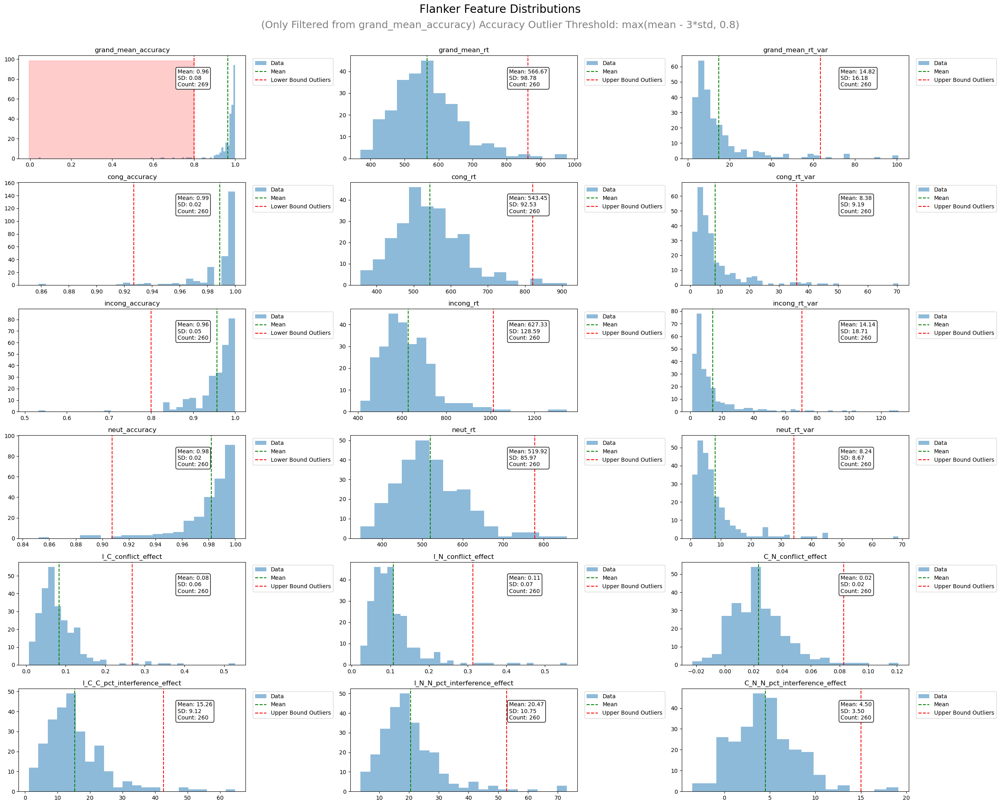

In [48]:
fig, ax = plt.subplots(6, 3, figsize=(25, 20))
ax = ax.flatten()

trial_types = ['grand_mean', 'cong', 'incong', 'neut']
data_types = ['accuracy', 'rt', 'rt_var']
flanker_feature_list = [col for col in flanker_df.columns if 'error' not in col and 
                        'outlier' not in col and 'participant' not in col]

for i in range(len(ax)):
    fill = False
    col = flanker_feature_list[i]
    if col is not 'grand_mean_accuracy':
        val_list = flanker_df.loc[flanker_df['grand_mean_accuracy_outlier'] == 0, col]
    else:
        val_list = flanker_df[col]

    if 'effect' in col:
        val_list = flanker_df.loc[(flanker_df['grand_mean_accuracy_outlier'] == 0), col]
    participants = flanker_df['participant']

    mean_val = np.mean(val_list)
    std_val = np.std(val_list)
    lower_bound, upper_bound = get_bounds(val_list)
    if 'accuracy' in col:
        fill = True
        lower_bound = max(lower_bound, 0.8)
    
    ax[i].hist(val_list, bins='auto', alpha=0.5, label='Data')
    ax[i].axvline(mean_val, color='green', linestyle='--', label='Mean')
    if 'rt' in col or 'effect' in col:
        ax[i].axvline(upper_bound, color='red', linestyle='--', label='Upper Bound Outliers')
        if fill:
            ax[i].fill_betweenx(
                [0, ax[i].get_ylim()[1]], upper_bound, ax[i].get_xlim()[1], color='red', alpha=0.1
            )
    else:
        ax[i].axvline(lower_bound, color='red', linestyle='--', label='Lower Bound Outliers')
        if fill:
            if col is 'grand_mean_accuracy':
                a = 0.2
            else:
                a = 0.0
            ax[i].fill_betweenx(
                [0, ax[i].get_ylim()[1]], ax[i].get_xlim()[0], lower_bound, color='red', alpha=a
            )
    ax[i].set_title(f'{col}')
    
    ax[i].legend(loc='upper left', bbox_to_anchor=(1.02, 1.0))
    
    ax[i].annotate(
        f'Mean: {mean_val:.2f}\nSD: {std_val:.2f}\nCount: {len(val_list)}', 
        xy=(0.7, 0.7), 
        xycoords='axes fraction', 
        fontsize=10, 
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
    )

fig.suptitle('Flanker Feature Distributions', y=1.0, fontsize=20)
fig.text(0.5, 0.97, '(Only Filtered from grand_mean_accuracy) Accuracy Outlier Threshold: max(mean - 3*std, 0.8)', 
         ha='center', fontsize=18, color='gray')
plt.tight_layout(rect=[0, 0, 1, 0.975])  
plt.show()

In [49]:
cal_flanker_data = merge_and_keep([proc_cal_data, flanker_df], on='participant')

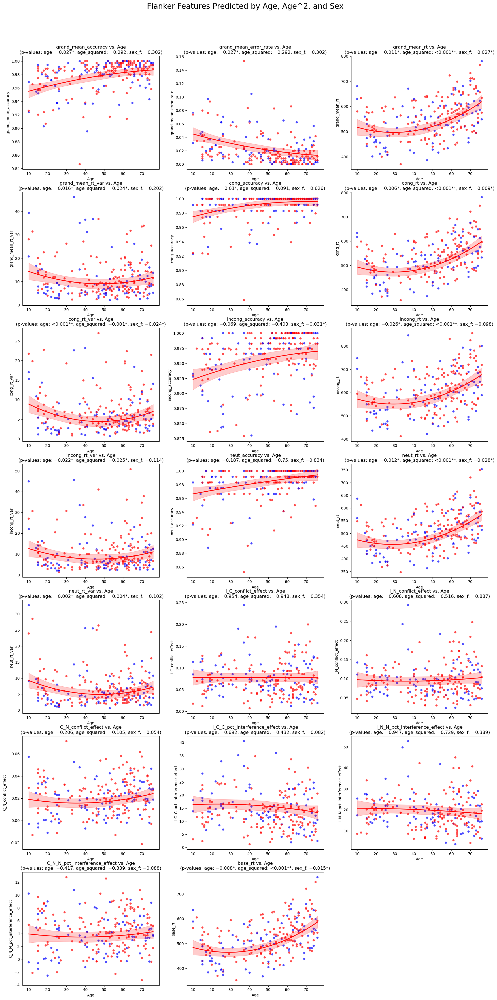

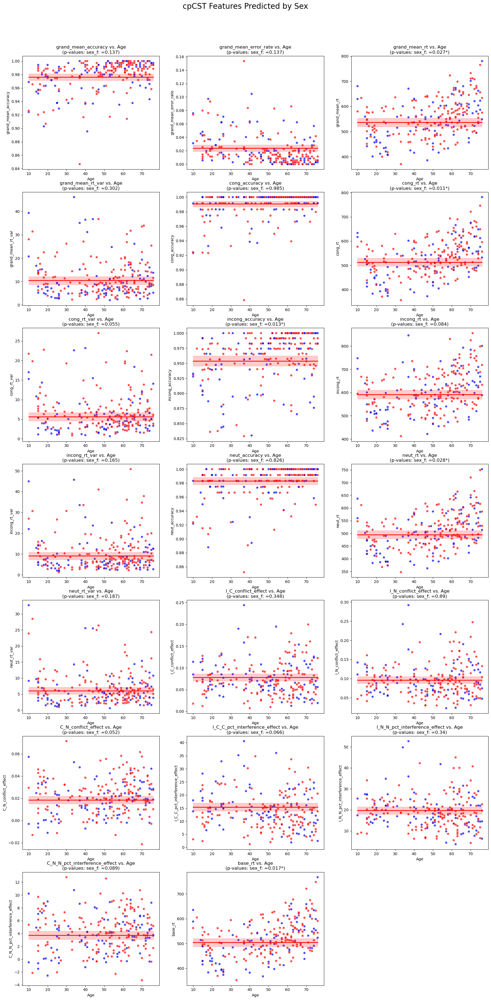

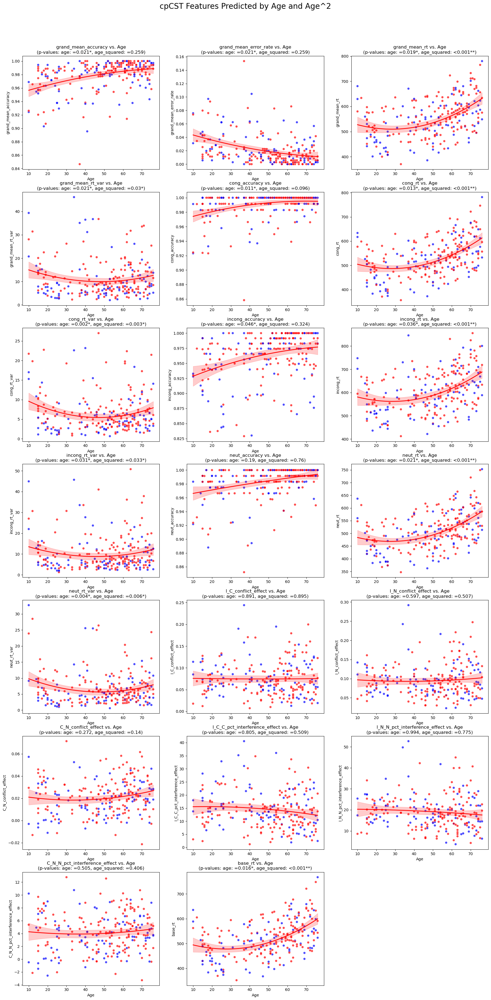

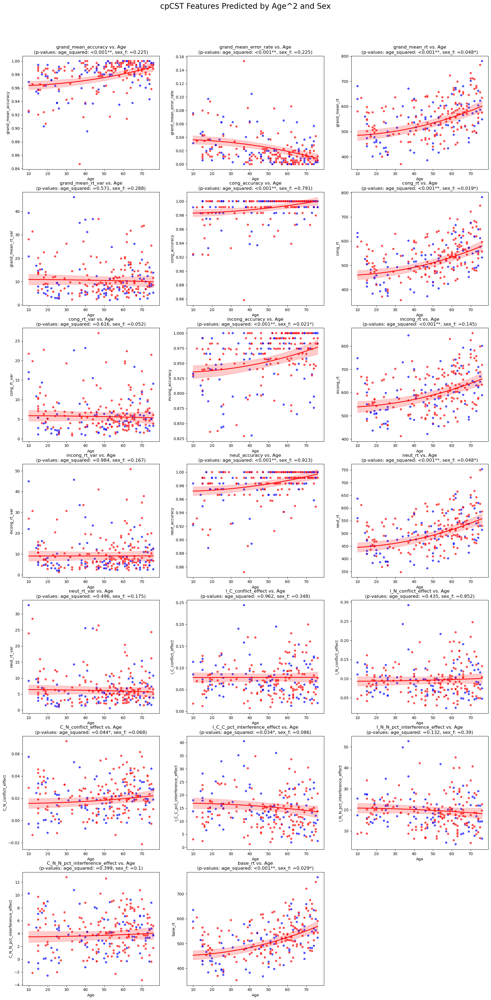

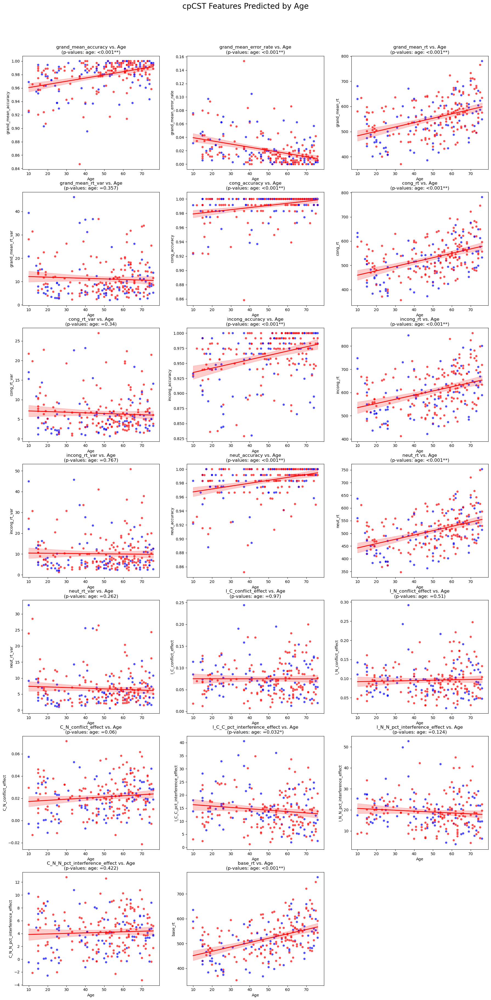

In [50]:
outlier_columns = [col for col in flanker_df.columns if 'outlier' in col]

data_filt = cal_flanker_data[cal_flanker_data[outlier_columns].eq(0).all(axis=1)]
data_filt = data_filt[[col for col in flanker_df.columns if 'outlier' not in col and 'part' not in col] + ['age', 'sex_f']]
data_filt = data_filt[(data_filt['sex_f'] == 1) | (data_filt['sex_f'] == 0)]

flanker_ind_diff_data_dirs = os.path.join(ind_diff_data_dirs, 'flanker')
flanker_age_age2_sex = plot_all_effects(data_filt, model_effects=['age', 'np.power(age, 2)', 'sex_f'], title=
                                        'Flanker Features Predicted by Age, Age^2, and Sex')#, fname=os.path.join(flanker_ind_diff_data_dirs, 'flanker_age_age2_sex.csv'))
flanker_sex = plot_all_effects(data_filt, model_effects=['sex_f'], title='cpCST Features Predicted by Sex')#,fname=os.path.join(flanker_ind_diff_data_dirs, 'flanker_sex.csv'))
flanker_age_age2 = plot_all_effects(data_filt, model_effects=['age', 'np.power(age, 2)'], 
                                    title='cpCST Features Predicted by Age and Age^2')#, fname=os.path.join(flanker_ind_diff_data_dirs, 'flanker_age_age2.csv'))
flanker_age2_sex = plot_all_effects(data_filt, model_effects=['np.power(age, 2)', 'sex_f'], 
                                    title='cpCST Features Predicted by Age^2 and Sex')#, fname=os.path.join(flanker_ind_diff_data_dirs, 'flanker_age2_sex.csv'))
flanker_age = plot_all_effects(data_filt, model_effects=['age'], title='cpCST Features Predicted by Age')#, fname=os.path.join(flanker_ind_diff_data_dirs, 'flanker_age.csv'))


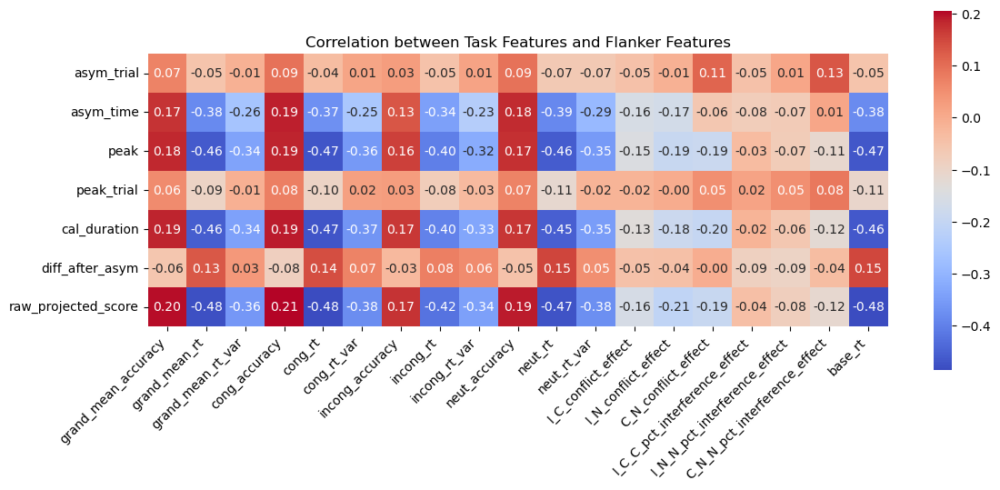

In [51]:
def calculate_correlations(df, features_task, flanker_features):
    correlations = {}
    for feature in flanker_features:
        correlations[feature] = df[features_task].corrwith(df[feature])
    return correlations

cpcst_features = [
    'asym_trial', 
    'asym_time', 
    'peak', 
    'peak_trial', 
    'cal_duration', 
    'diff_after_asym',
    'raw_projected_score',
]

flanker_features = flanker_feature_list

correlation_results = calculate_correlations(cal_flanker_data, cpcst_features, flanker_features)
correlation_df = pd.DataFrame(correlation_results)

plt.figure(figsize=(12, 6))
sns.heatmap(correlation_df, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})

plt.title('Correlation between Task Features and Flanker Features')
plt.xticks(rotation=45, ha='right') 
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

,grand_mean_rt,grand_mean_rt_var,cong_rt,cong_rt_var,incong_rt,neut_rt,neut_rt_var,base_rt
asym_time,-0.383596,NaN,-0.374049,NaN,NaN,-0.386135,NaN,-0.382279
peak,-0.461207,NaN,-0.469636,-0.356762,-0.403244,-0.458066,-0.352898,-0.466985
cal_duration,-0.455999,NaN,-0.468766,-0.365265,-0.396579,-0.454578,NaN,-0.464838
raw_projected_score,-0.476921,-0.358785,-0.484816,-0.378148,-0.421450,-0.473020,-0.376031,-0.482151


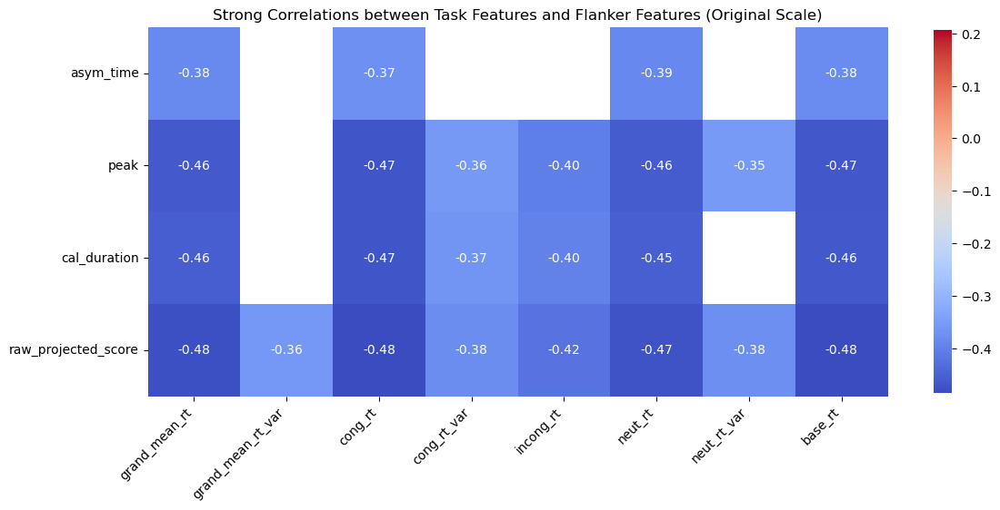

In [52]:
strong_correlations = correlation_df[(correlation_df.abs() > 0.35) & (correlation_df != 1)]
strong_correlations_clean = strong_correlations.dropna(axis=0, how='all').dropna(axis=1, how='all')
display(strong_correlations_clean)


vmin = correlation_df.min().min()
vmax = correlation_df.max().max() 

plt.figure(figsize=(12, 6))
sns.heatmap(strong_correlations_clean, annot=True, fmt=".2f", cmap='coolwarm', square=True, 
            vmin=vmin, vmax=vmax, cbar_kws={"shrink": .8})

plt.title('Strong Correlations between Task Features and Flanker Features (Original Scale)')
plt.xticks(rotation=45, ha='right') 
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Adaptation Capacity
The principle's pretty simple: if each ptp's performance is mapped onto some predetermined decay curve and we're interested in how efficiently they're adapting to the task to reach an asymptote along the curve, then we can simply divide the amount of time it takes them to reach asymptote by the total duration of calibration.
- Importantly, this is only because their performance is always mapped onto a curve of identical shape, so the only difference is their placement and scale along the curve.

In [53]:
def find_adapt_eff(ptp, ax=None, plot=True, fname=None, title=None):
    ptp_ind = np.where(proc_cal_data.participant==ptp)[0][0]
    fitted_curve = proc_cal_data.loc[ptp_ind, 'perf_fitted_curve']
    raw_fitted_curve = proc_cal_data.loc[ptp_ind, 'raw_fitted_curve']
    raw_projected_score = proc_cal_data.loc[ptp_ind, 'raw_projected_score']
    P_inf = proc_cal_data.loc[ptp_ind, 'P_inf']

    try:
        asym_idx = np.where(fitted_curve >= P_inf * 0.95)[0][0]
    except IndexError:
        print(f"Participant {ptp} does not reach the specified levels in the fitted curve.")
        return None

    adapt_cap = asym_idx/len(fitted_curve)

    if plot:
        if ax is None:
            fig, ax = plt.subplots()
        
        ax.set_ylim(0, 1.4)
        ax.plot(raw_fitted_curve, label="Raw Fitted Curve")
        ax.plot(proc_cal_data.loc[ptp_ind, 'lambda_vals'], alpha=0.6, label="Lambda Values (Interpolated)")
#         ax.plot(raw_cal_data[ptp].lambda_val, alpha=0.6, label="Lambda Val (Raw)", linestyle="--")
        ax.scatter(asym_idx, raw_fitted_curve[asym_idx], color="red", label="Asymptotic Point")

        ax.fill_between(range(0, asym_idx), y1=-0.1, 
                        y2=raw_fitted_curve[0:asym_idx], color='red', alpha=0.25)
        ax.axvline(x=0, color='blue', linestyle='--', alpha=0.4)
        ax.axvline(x=asym_idx, color='red', linestyle='--', alpha=0.4)

        text = f"Adaptation Capacity: {np.round(adapt_cap*100, 2)}%"
        ax.text(asym_idx + len(fitted_curve) // 50, 0.65, text, fontsize=10, 
                verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

        ax.legend()
        if title:
            ax.set_title(title)
        else:
            ax.set_title(f'Participant {ptp}')
        ax.set_xlabel('Index')
        ax.set_ylabel('Performance')

        if fname and ax is None:
            fig.savefig(fname)
            plt.close(fig)

    return [adapt_cap, P_inf]

In [54]:
proc_cal_data['adapt_cap'] = np.nan
num_cols = 10
num_plots = len(proc_cal_data)
num_rows = (num_plots + num_cols - 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(100, 5 * num_rows))
axs = axs.flatten()

for i, ptp in enumerate(proc_cal_data.participant):
    try:
        proc_cal_data['adapt_cap'] = find_adapt_eff(ptp, ax=axs[i], plot=False)[0]
    except Exception as e:
        pass

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.suptitle('Adaptive Capacity Plots', fontsize=20, y=1.01)
plt.show()

Participant M10939077 does not reach the specified levels in the fitted curve.
Participant M10963307 does not reach the specified levels in the fitted curve.
Participant M10983486 does not reach the specified levels in the fitted curve.
Participant M10986502 does not reach the specified levels in the fitted curve.
Participant M10988888 does not reach the specified levels in the fitted curve.


In [55]:
z_scores = np.abs(zscore(proc_cal_data['adapt_cap']))

# Mark outliers based on a Z-score threshold (commonly 3)
proc_cal_data['adapt_cap_outlier'] = np.where(z_scores > 3, 1, 0)

# Finding Correlations between IRT, cpCST, AC, and Flanker Features

In [56]:
total_possible_ptps = []

for ptp in flanker_df.participant:
    if ptp not in total_possible_ptps:
        total_possible_ptps.append(ptp)
        
for ptp in proc_cal_data.participant:
    if ptp not in total_possible_ptps:
        total_possible_ptps.append(ptp)
        
len(total_possible_ptps)

272

# Importing WJ Data

In [57]:
wj_fpath = '/home/workspace/files/Data/Raw/RS2/Woodcock-Johnson/WJ_V3_trimmed.csv'
wj_df = pd.read_csv(wj_fpath, index_col=0)
wj_df = wj_df.rename(columns={'ursi':'participant'})
wj_df = wj_df.dropna(subset=['BIA_Z', 'ACHBRF_Z'])[['participant', 'BIA_Z', 'ACHBRF_Z']]


In [58]:
def get_bounds(array):
    mean_val = np.mean(array)
    std_val = np.std(array, ddof=1)
    return mean_val - 3 * std_val, mean_val + 3 * std_val

wj_df['wj_outlier'] = 0

for col in ['BIA_Z', 'ACHBRF_Z']:
    lower, upper = get_bounds(wj_df[col])
    wj_df[f'{col}_outlier'] = ((wj_df[col] < lower) | (wj_df[col] > upper)).astype(int)
    wj_df['wj_outlier'] |= wj_df[f'{col}_outlier']

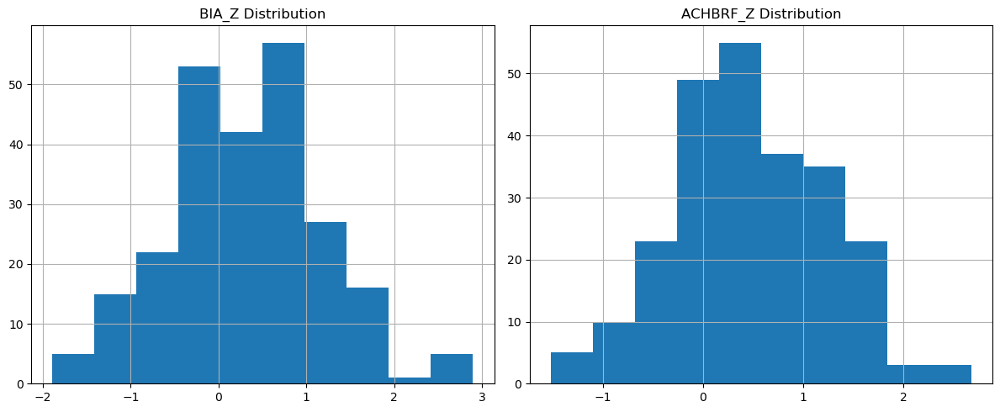

In [59]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

wj_df['BIA_Z'].hist(ax=axs[0])
axs[0].set_title('BIA_Z Distribution')

wj_df['ACHBRF_Z'].hist(ax=axs[1])
axs[1].set_title('ACHBRF_Z Distribution')

plt.tight_layout()
plt.show()

# Importing ML Data

In [60]:
gad_phq_fpath = '/home/workspace/files/Data/Raw/RS2/Mindlogger_survey_data/gad_phq_merge_03092024.csv'
eswan_fpath = '/home/workspace/files/Data/Raw/RS2/Mindlogger_survey_data/ESWAN_G_03142025.csv'
ml_df = merge_and_keep([pd.read_csv(gad_phq_fpath), pd.read_csv(eswan_fpath)], on='ursi')
ml_df = ml_df.rename(columns={'ursi':'participant'})

# Importing Flanker Regression Data

In [61]:
flanker_resid_fpath = '/home/workspace/files/Data/Processed/RS2/flanker_inc_reg_03262025.csv'
flanker_resid_df = pd.read_csv(flanker_resid_fpath)
flanker_resid_df = flanker_resid_df.rename(columns={'ursi':'participant'})

# Importing VO2 Data

In [62]:
vo2_fpath = '/home/workspace/files/Data/Processed/RS2/VO2Max/VO2_final.csv'
vo2_df = pd.read_csv(vo2_fpath, index_col=0)
vo2_df['participant'] = vo2_df['Name'].apply(lambda ursi: ursi.split(',')[0].split('_')[0])
vo2_df = vo2_df[['participant', 'VO2/kg_maxVO2', 'VO2_max', 'RER_max', 'HR_max', 'HR_agemax', 'pct_hr_agemax']]
vo2_df = vo2_df.rename(columns={'VO2/kg_maxVO2':'VO2_weight_reg'})


# Setting up for Global Analyses

In [63]:
def is_not_list_or_dict_or_interval(column):
    return not (column.apply(lambda x: isinstance(x, (list, dict, np.ndarray, pd.Interval))).any())

flanker_columns = [
    col for col in flanker_df.columns 
    if 'participant' not in col 
    and 'outlier' not in col 
    and 'age' not in col 
    and 'sex' not in col
    and 'log' not in col.split('_')[0]
    and is_not_list_or_dict_or_interval(flanker_df[col])
]

calCST_columns = [
    col for col in proc_cal_data.columns 
    if 'participant' not in col 
    and 'outlier' not in col 
    and 'age' not in col 
    and 'sex' not in col 
    and 'log' not in col.split('_')[0]
    and is_not_list_or_dict_or_interval(proc_cal_data[col])
]

wj_columns = [
    col for col in wj_df.columns 
    if 'participant' not in col 
    and 'outlier' not in col 
    and 'age' not in col 
    and 'sex' not in col 
    and 'log' not in col.split('_')[0]
]


In [64]:
filt_data = merge_and_keep([wj_df, proc_cal_data, flanker_df, vo2_df], on='participant', drop=False)
filt_data = filt_data.dropna(subset=['BIA_Z', 'ACHBRF_Z'])

filt_data = filt_data[
    (filt_data['wj_outlier']==0)&
    (filt_data['flanker_outlier']==0)&
    (filt_data['calCST_outlier']==0)
                     ]

filt_data = filt_data[[col for col in filt_data.columns if 'outlier' not in col]]

# Flanker Regressions vs calCST

# calCST Analysis

## Correlating Key Features

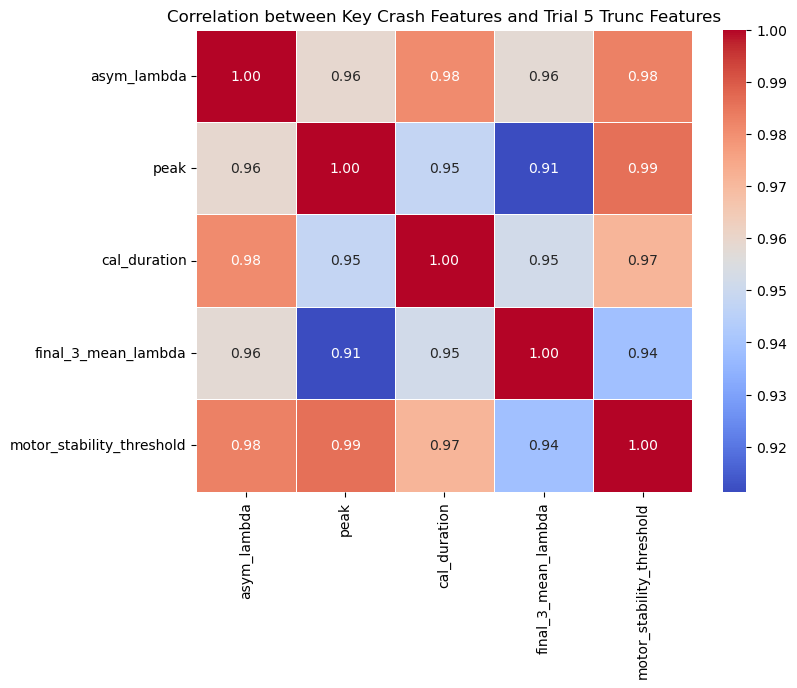

In [65]:
key_crash_features = ['asym_lambda', 'peak', 'cal_duration', 'final_3_mean_lambda', 'motor_stability_threshold']

subset = filt_data[key_crash_features]
correlation_matrix = subset.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation between Key Crash Features and Trial 5 Trunc Features')
plt.show()

## Time Efficacy Validation 
### Limit all participant's data to first 5 trials and find peak and duration

In [66]:
proc_cal_data['trial_5_peak'], proc_cal_data['trial_5_peak_trial'], proc_cal_data['trial_5_duration'] = np.nan, np.nan, np.nan


In [67]:
for i in range(len(proc_cal_data)):
    ptp = proc_cal_data.loc[i, 'participant']
    lambda_vals_at_crashes = proc_cal_data.loc[i]['lambda_vals_at_crashes']
    lambda_idx_at_crashes = proc_cal_data.loc[i]['lambda_idx_at_crashes']
    trunc_data = [lambda_idx_at_crashes[5], lambda_vals_at_crashes[1:6]] if lambda_idx_at_crashes[0] == 0 else [lambda_idx_at_crashes[4], lambda_vals_at_crashes[:5]]
    
    trial_5_duration = raw_cal_data[ptp].loc[trunc_data[0], 'flip_time']*1000
    trial_5_peak = max(trunc_data[1])
    trial_5_peak_trial = trunc_data[1].index(trial_5_peak) + 1
    
    proc_cal_data.loc[i, 'trial_5_peak'] = trial_5_peak
    proc_cal_data.loc[i, 'trial_5_peak_trial'] = trial_5_peak_trial
    proc_cal_data.loc[i, 'trial_5_duration'] = trial_5_duration


### Correlate with 4 key crash features

In [68]:
def get_trunc_asym(data):
    def exp_decay(t, P_inf, P_0, lambda_):
        return P_inf + (P_0 - P_inf) * np.exp(-lambda_ * t)
    
    crash_idx_list = data['lambda_idx_at_crashes'][:5]
    first_five = int(crash_idx_list[-1])
    interpolated_lambda_vals = data['lambda_vals'][:first_five]
    trials = np.array(data['trials'])[:first_five]
    time = trials/30
    timestamps = time*1000

    raw_popt, _ = curve_fit(exp_decay, trials, interpolated_lambda_vals, p0=[0.8, 0.2, 0.5], maxfev=4000)
    raw_P_inf, raw_P_0, raw_lambda_ = raw_popt
    raw_fitted_curve = exp_decay(trials, raw_P_inf, raw_P_0, raw_lambda_)
    raw_projected_score = raw_fitted_curve[-1]

    if len(np.where(raw_fitted_curve >= 0.95 * raw_P_inf)[0]) == 0:
        asym_idx = None
        asym_trial = None
        asym_lambda_raw = None
        asym_lambda_est = None
        asym_time = None
    else:
        asym_idx = np.where(raw_fitted_curve >= 0.95 * raw_P_inf)[0][0]
        asym_time = timestamps[asym_idx]
        asym_trial = (lambda a, t: np.where(a >= t)[0][0] if np.any(a >= t) else None)(np.array(crash_idx_list), asym_idx)
        asym_lambda_raw = raw_fitted_curve[asym_idx]
    
    return asym_idx, asym_time, asym_trial, asym_lambda_raw
    

In [69]:
proc_cal_data['trunc_5_asym_lambda'] = np.nan
for idx in range(len(proc_cal_data)):
    data = proc_cal_data.loc[idx]
    asym_idx, asym_time, asym_trial, asym_lambda_raw = get_trunc_asym(data)
    proc_cal_data.loc[idx, 'trunc_5_asym_lambda'] = asym_lambda_raw
    

In [70]:
filt_data = merge_and_keep([wj_df, proc_cal_data, flanker_df], on='participant', drop=False)
filt_data = filt_data.dropna(subset=['BIA_Z', 'ACHBRF_Z'])

filt_data = filt_data[
    (filt_data['wj_outlier']==0)&
    (filt_data['flanker_outlier']==0)&
    (filt_data['calCST_outlier']==0)
                     ]

filt_data = filt_data[[col for col in filt_data.columns if 'outlier' not in col]]

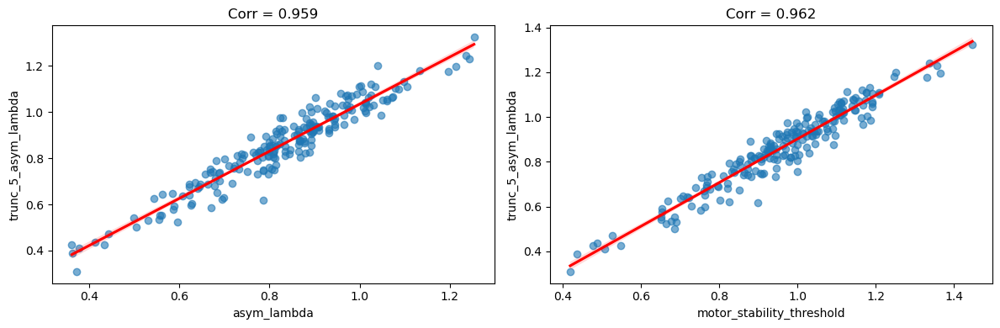

In [71]:
key_crash_features = ['asym_lambda', 'motor_stability_threshold']
trial_5_trunc_features = ['trunc_5_asym_lambda']

subset = filt_data[key_crash_features + trial_5_trunc_features]

fig, axes = plt.subplots(1, len(key_crash_features), figsize=(6 * len(key_crash_features), 2*len(key_crash_features)))

for i, feature in enumerate(key_crash_features):
    ax = axes[i] if len(key_crash_features) > 1 else axes
    x = subset[feature]
    y = subset[trial_5_trunc_features[0]]
    
    sns.regplot(x=x, y=y, ax=ax, scatter_kws={'alpha': 0.6}, line_kws={'color': 'red'})
    corr = x.corr(y)
    
    ax.set_xlabel(feature)
    ax.set_ylabel(trial_5_trunc_features[0])
    ax.set_title(f'Corr = {corr:.3f}', fontsize=12)

plt.tight_layout()
plt.show()

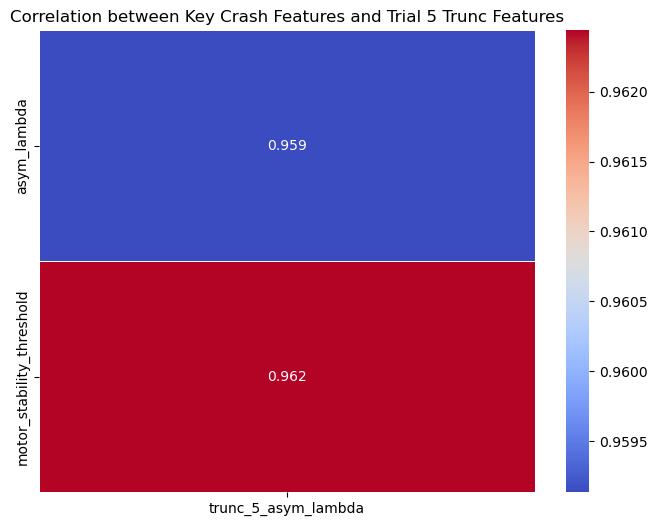

In [72]:
key_crash_features = ['asym_lambda', 'motor_stability_threshold']
trial_5_trunc_features = ['trunc_5_asym_lambda']

subset = filt_data[key_crash_features + trial_5_trunc_features]
correlation_matrix = subset.corr()
correlation_key_crash_trial_5 = correlation_matrix.loc[key_crash_features, trial_5_trunc_features]

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_key_crash_trial_5, annot=True, cmap='coolwarm', fmt=".3f", linewidths=0.5)
plt.title('Correlation between Key Crash Features and Trial 5 Trunc Features')
plt.show()

In [73]:
key_crash_features = ['peak', 'cal_duration', 'peak_trial']
trial_5_trunc_features = ['trial_5_peak', 'trial_5_peak_trial', 'trial_5_duration']

subset = filt_data[key_crash_features + trial_5_trunc_features]
correlation_matrix = subset.corr()
correlation_key_crash_trial_5 = correlation_matrix.loc[key_crash_features, trial_5_trunc_features]

correlation_key_crash_trial_5

,trial_5_peak,trial_5_peak_trial,trial_5_duration
peak,0.967451,0.037415,0.928029
cal_duration,0.930588,0.016331,0.965501
peak_trial,-0.144267,0.367612,-0.056920


## VO2Max

In [74]:
filt_data = merge_and_keep([wj_df, proc_cal_data, flanker_df, vo2_df], on='participant', drop=False)
filt_data = filt_data.dropna(subset=['BIA_Z', 'ACHBRF_Z'])

filt_data = filt_data[
    (filt_data['wj_outlier']==0)&
    (filt_data['flanker_outlier']==0)&
    (filt_data['calCST_outlier']==0)
                     ]

filt_data = filt_data[[col for col in filt_data.columns if 'outlier' not in col]]

In [75]:
format_p_value = lambda p: '<0.001***' if p < 0.01 else '<0.01**' if p < 0.01 else ('<0.05*' if p < 0.05 else f'{np.round(p, 3)}')
def format_t_test(p, t):
    t_test = (f'{np.round(t, 3)}***' if p < 0.001 else
              f'{np.round(t, 3)}**' if p < 0.01 else
              f'{np.round(t, 3)}*' if p < 0.05 else
              f'{np.round(t, 3)}')
    return t_test

def get_t(dep, ind, data):
    formula = f'{dep} ~ {ind}'
    model = smf.ols(formula, data=data).fit()
    asym_p, asym_t = model.pvalues[ind.split('+')[0].strip()], model.tvalues[ind.split('+')[0].strip()]

    return format_t_test(asym_p, asym_t)


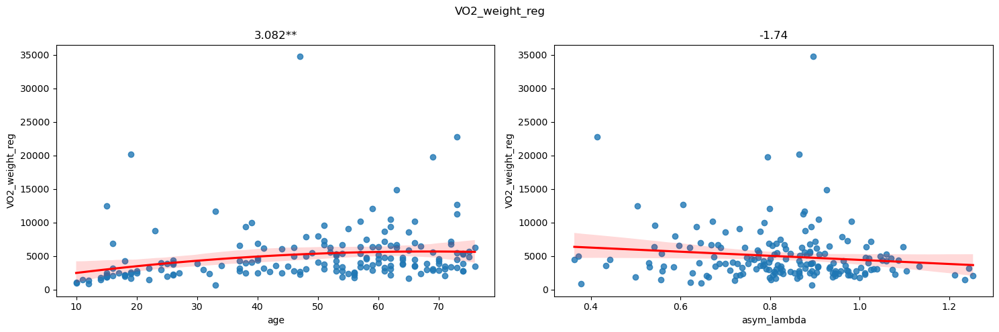

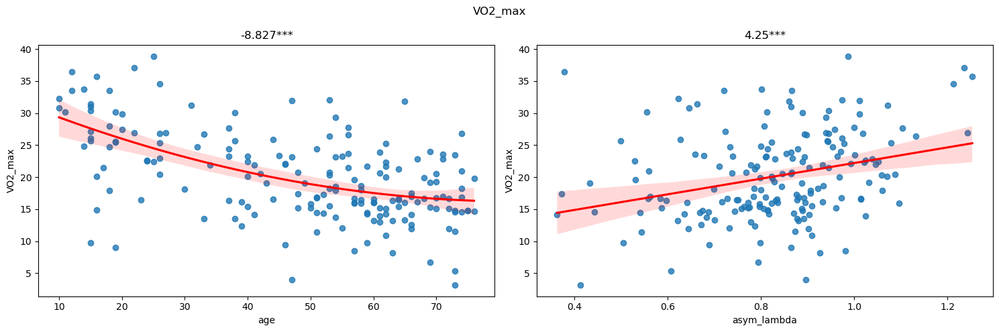

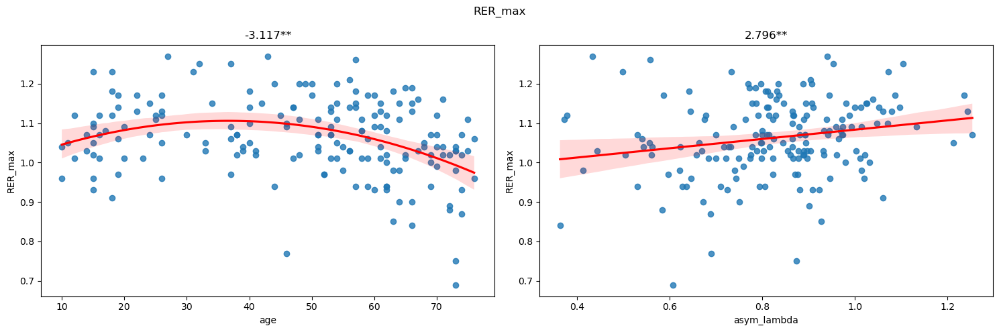

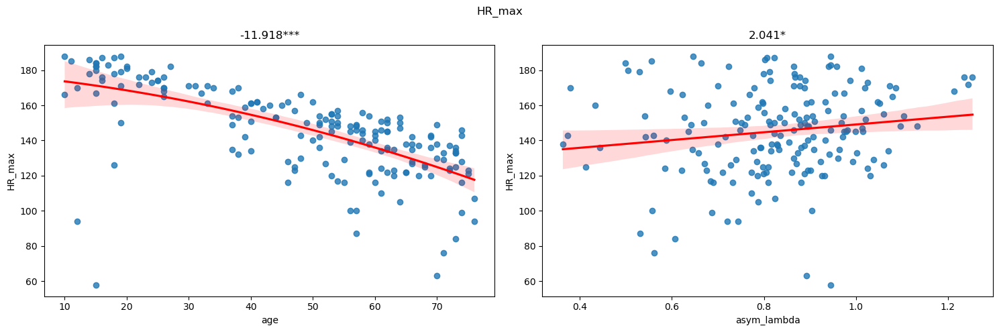

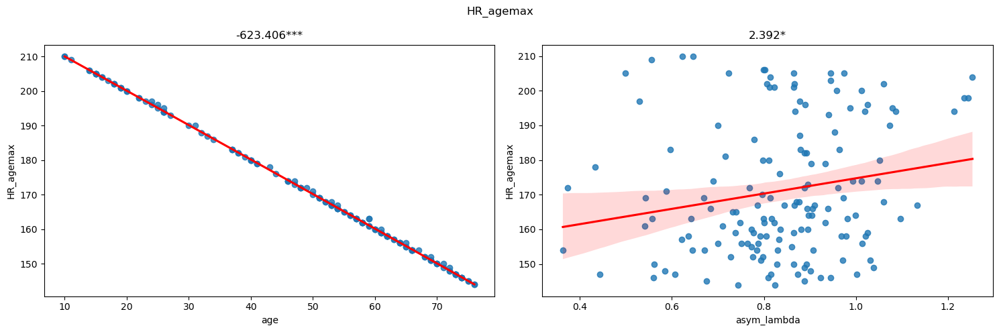

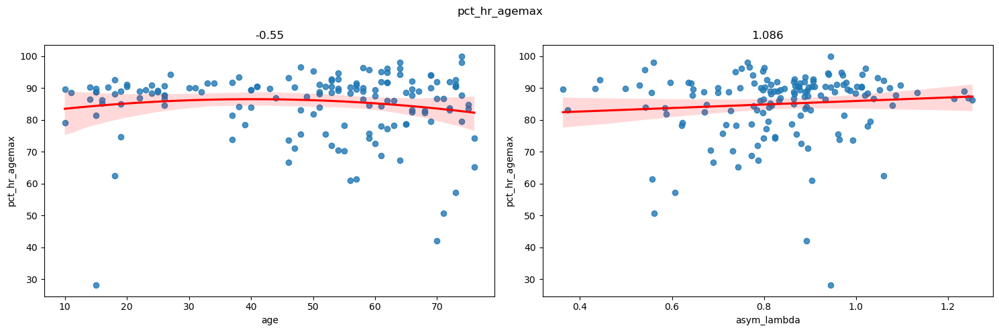

In [76]:
df = filt_data.copy()

for i, col in enumerate([col for col in vo2_df.columns if 'participant' not in col]):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    axes = axes.flatten()
    
    sns.regplot(x=df['age'], y=df[col], ax=axes[0], line_kws={'color': 'red'}, order=2)
    axes[0].set_title(get_t(col, 'age', df))
    
    sns.regplot(x=df['asym_lambda'], y=df[col], ax=axes[1], line_kws={'color': 'red'})
    axes[1].set_title(get_t(col, 'asym_lambda', df))

    plt.suptitle(col)
    plt.tight_layout()
    plt.show()


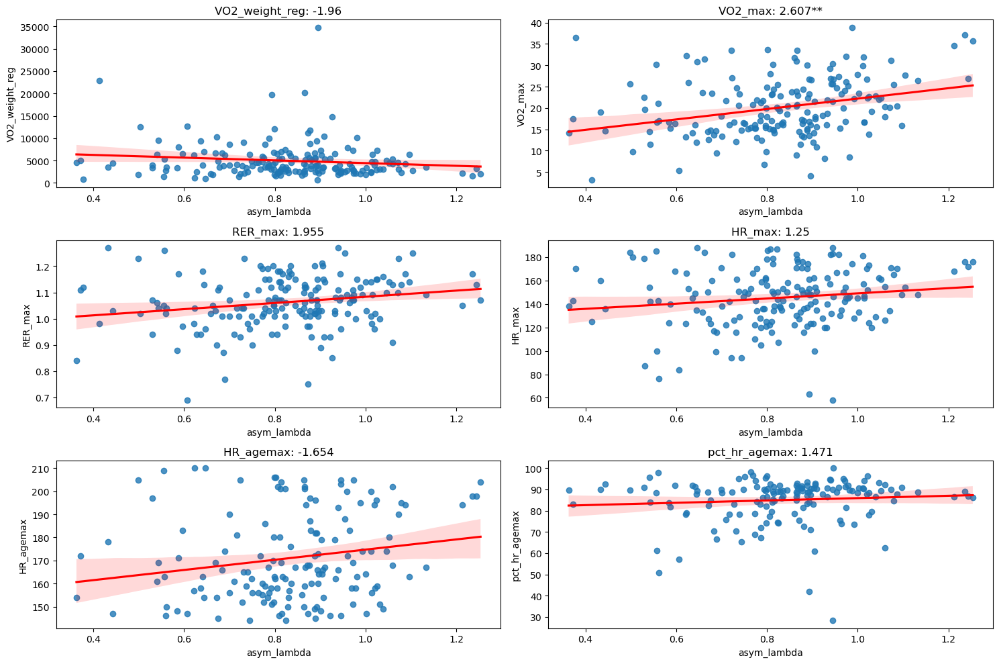

In [77]:
filt_data['age_squared'] = filt_data['age']**2

df = filt_data.copy()

nrows, ncols = 3, 2
fig, axes = plt.subplots(nrows, ncols, figsize=(nrows*5, ncols*5))
axes = axes.flatten()

for i, col in enumerate([col for col in vo2_df.columns if 'participant' not in col]):
    sns.regplot(x=df['asym_lambda'], y=df[col], ax=axes[i], line_kws={'color': 'red'})
    axes[i].set_title(f'{col}: {get_t(col, "asym_lambda + age_squared + sex_f", df)}')
plt.tight_layout()
plt.show()

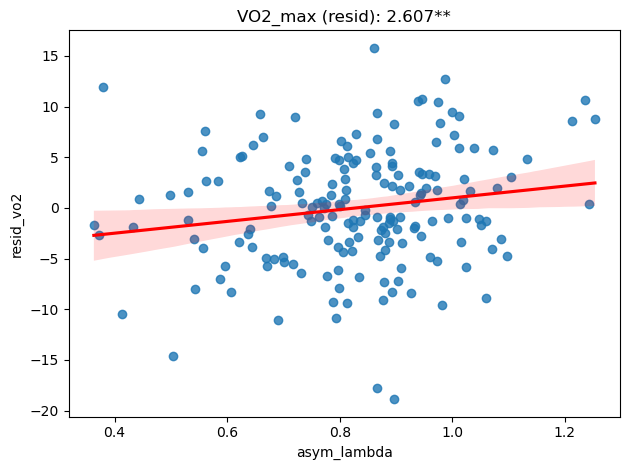

In [78]:
df = filt_data.copy()
col = 'VO2_max'

# Step 1: Residualize VO2_max against age_squared (and optionally sex_f)
resid_model = smf.ols(f'{col} ~ age_squared + sex_f', data=df).fit()
df['resid_vo2'] = resid_model.resid

# Step 2: Plot residuals against asym_lambda
sns.regplot(x=df['asym_lambda'], y=df['resid_vo2'], line_kws={'color': 'red'})

# Step 3: Get stats for asym_lambda predicting the residuals
formula = f'{col} ~ asym_lambda + age_squared + sex_f'
model = smf.ols(formula, data=df).fit()
t, p = model.tvalues.get('asym_lambda', float('nan')), model.pvalues.get('asym_lambda', float('nan'))

plt.title(f'{col} (resid): {format_t_test(p, t)}')
plt.tight_layout()
plt.show()


In [79]:
model.pvalues['asym_lambda']

0.009909528717112521

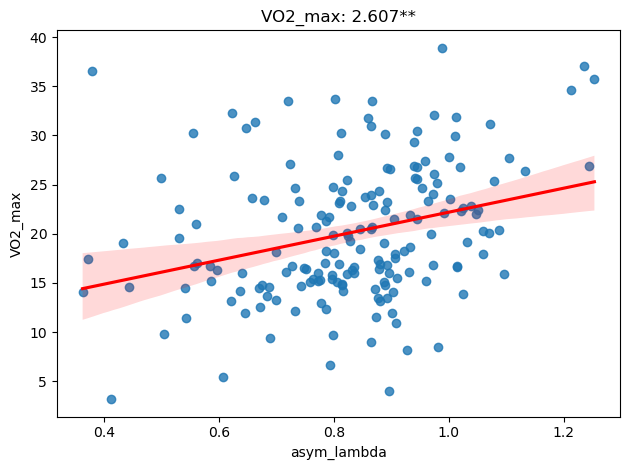

In [80]:
df = filt_data.copy()
col = 'VO2_max'
sns.regplot(x=df['asym_lambda'], y=df[col], line_kws={'color': 'red'})

formula = f'{col} ~ asym_lambda + age_squared + sex_f'
model = smf.ols(formula, data=df).fit()
t, p = model.tvalues.get('asym_lambda', float('nan')), model.pvalues.get('asym_lambda', float('nan'))

plt.title(f'{col}: {format_t_test(p, t)}')
plt.tight_layout()
plt.show()

## Regress against flanker RT and contrasts, cpCST, and WJ

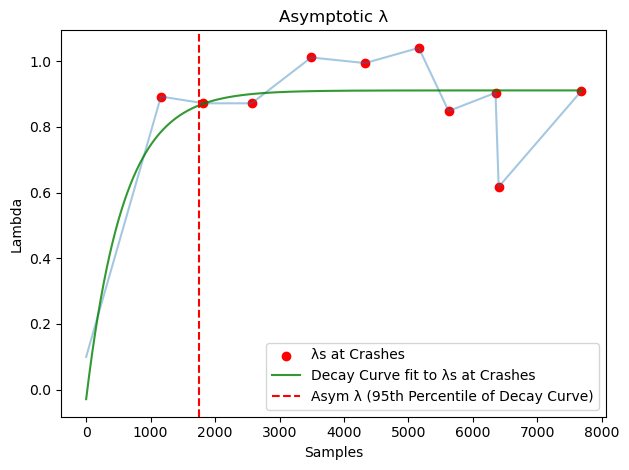

In [81]:
plot_idx = 0
ptp_ind = 100
ptp_num = filt_data.participant.values[ptp_ind]
ptp_data = filt_data.loc[ptp_ind]
lambda_vals = ptp_data['lambda_vals']
ind_at_crashes = filt_data.loc[ptp_ind, 'lambda_idx_at_crashes']
lambda_vals_at_crashes = filt_data.loc[ptp_ind, 'lambda_vals_at_crashes']
plt.scatter(ind_at_crashes, lambda_vals_at_crashes, color='red', alpha=1, label='λs at Crashes')
plt.plot(lambda_vals, alpha=0.4)
plt.plot(ptp_data['raw_fitted_curve'], color='g', label='Decay Curve fit to λs at Crashes', alpha=0.8)
plt.axvline(ptp_data['asym_idx'], color='r', linestyle='--', label='Asym λ (95th Percentile of Decay Curve)', alpha=1)
plt.ylabel('Lambda')
plt.xlabel('Samples')
plt.title('Asymptotic λ')
plt.legend()

plt.tight_layout()
plt.show()

In [82]:
ptp_data['asym_lambda'], np.mean(lambda_vals_at_crashes[-3:])

(0.865291908452844, 0.8098732762527757)

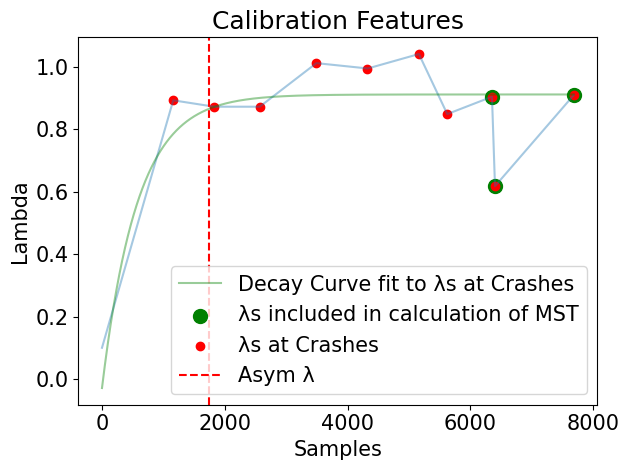

In [83]:
import heapq
import matplotlib.pyplot as plt
import matplotlib as mpl

fontscale = 1.5  # Adjust this value to scale all fonts proportionally

# Helper to scale font sizes safely
def scale_fontsize(param):
    val = mpl.rcParams[param]
    if isinstance(val, (int, float)):
        return val * fontscale
    # For string sizes ('medium', 'large', etc.), map to numeric equivalents and rescale
    mapping = {
        'xx-small': 6, 'x-small': 7, 'small': 8, 'medium': 10,
        'large': 12, 'x-large': 14, 'xx-large': 16
    }
    return mapping.get(val, 10) * fontscale

mpl.rcParams.update({
    'axes.titlesize': scale_fontsize('axes.titlesize'),
    'axes.labelsize': scale_fontsize('axes.labelsize'),
    'xtick.labelsize': scale_fontsize('xtick.labelsize'),
    'ytick.labelsize': scale_fontsize('ytick.labelsize'),
    'legend.fontsize': scale_fontsize('legend.fontsize'),
})

plot_idx = 0
ptp_ind = 100
ptp_num = filt_data.participant.values[ptp_ind]
ptp_data = filt_data.loc[ptp_ind]
lambda_vals = ptp_data['lambda_vals']
ind_at_crashes = filt_data.loc[ptp_ind, 'lambda_idx_at_crashes']
lambda_vals_at_crashes = filt_data.loc[ptp_ind, 'lambda_vals_at_crashes']
top3 = heapq.nlargest(3, enumerate(lambda_vals_at_crashes), key=lambda x: x[1])

plt.plot(lambda_vals, alpha=0.4)
plt.plot(ptp_data['raw_fitted_curve'], color='g', label='Decay Curve fit to λs at Crashes', alpha=0.4)

plt.scatter(ind_at_crashes[-3:], lambda_vals_at_crashes[-3:], color='g', label='λs included in calculation of MST', s=100)
plt.scatter(ind_at_crashes, lambda_vals_at_crashes, color='red', alpha=1, label='λs at Crashes')
plt.axvline(ptp_data['asym_idx'], color='r', linestyle='--', label='Asym λ', alpha=1)

plt.xlabel('Samples')
plt.ylabel('Lambda')
plt.title('Calibration Features')
plt.legend()
plt.tight_layout()
plt.show()

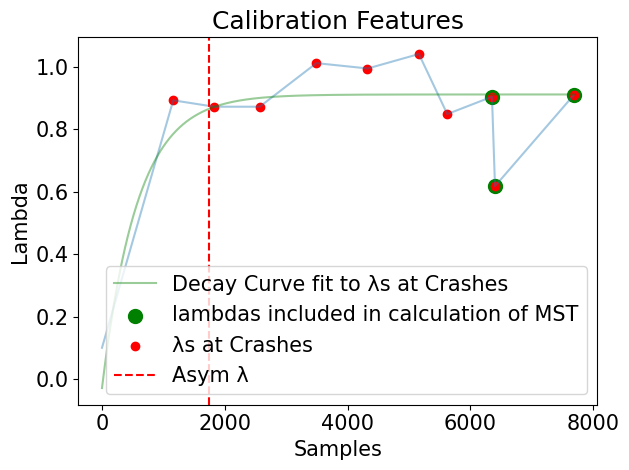

In [84]:
import heapq

plot_idx = 0
ptp_ind = 100
ptp_num = filt_data.participant.values[ptp_ind]
ptp_data = filt_data.loc[ptp_ind]
lambda_vals = ptp_data['lambda_vals']
ind_at_crashes = filt_data.loc[ptp_ind, 'lambda_idx_at_crashes']
lambda_vals_at_crashes = filt_data.loc[ptp_ind, 'lambda_vals_at_crashes']
top3 = heapq.nlargest(3, enumerate(lambda_vals_at_crashes), key=lambda x: x[1])
plt.plot(lambda_vals, alpha=0.4)
plt.plot(ptp_data['raw_fitted_curve'], color='g', label='Decay Curve fit to λs at Crashes', alpha=0.4)


plt.scatter(ind_at_crashes[-3:], lambda_vals_at_crashes[-3:], color='g', label=f'lambdas included in calculation of MST', s=100)
plt.scatter(ind_at_crashes, lambda_vals_at_crashes, color='red', alpha=1, label='λs at Crashes')
plt.axvline(ptp_data['asym_idx'], color='r', linestyle='--', label='Asym λ', alpha=1)
plt.ylabel('Lambda')
plt.xlabel('Samples')
plt.title('Calibration Features')
plt.legend()

plt.tight_layout()
plt.show()

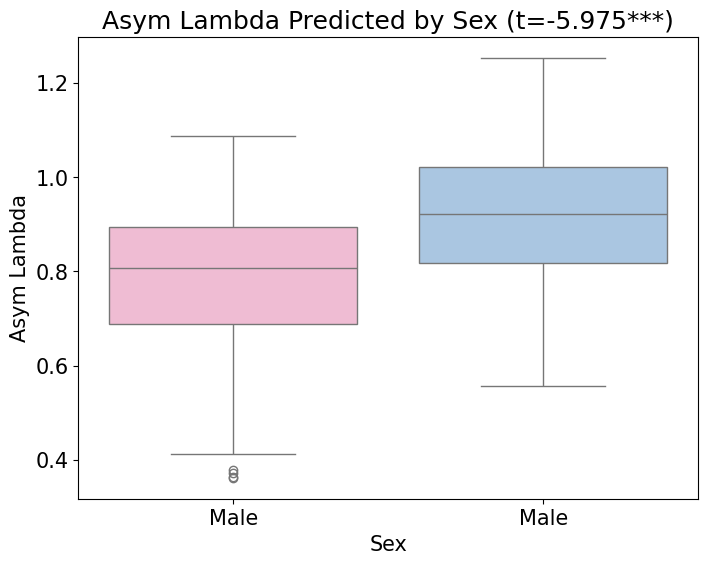

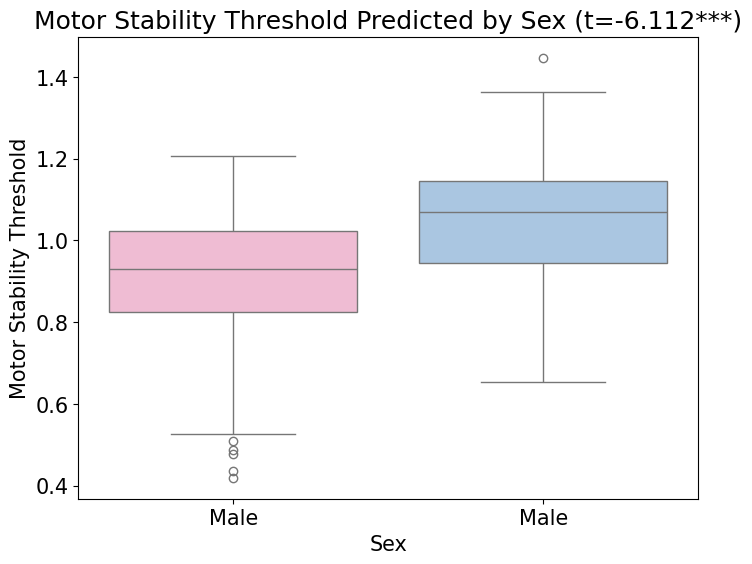

In [85]:
palette = {'0.0': '#a1c6ea', '1.0': '#f8b3d2'}

filt_data['sex_f'] = filt_data['sex_f'].astype(str)
available_sex_levels = sorted(filt_data['sex_f'].unique(), reverse=True)

model1 = smf.ols('asym_lambda ~ sex_f', data=filt_data.dropna(subset=['asym_lambda'])).fit()

plt.figure(figsize=(8, 6))
sns.boxplot(
    x='sex_f',
    y='asym_lambda',
    data=filt_data,
    order=available_sex_levels,
    palette=palette
)
plt.xlabel('Sex')
plt.ylabel('Asym Lambda')
plt.title(f"Asym Lambda Predicted by Sex (t={format_t_test(model1.pvalues['sex_f[T.1.0]'], model1.tvalues['sex_f[T.1.0]'])})")
plt.xticks(ticks=range(len(available_sex_levels)), labels=['Female' if x == '1' else 'Male' for x in available_sex_levels])
plt.show()

model2 = smf.ols('motor_stability_threshold ~ sex_f', data=filt_data.dropna(subset=['motor_stability_threshold'])).fit()

plt.figure(figsize=(8, 6))
sns.boxplot(
    x='sex_f',
    y='motor_stability_threshold',
    data=filt_data,
    order=available_sex_levels,
    palette=palette
)
plt.xlabel('Sex')
plt.ylabel('Motor Stability Threshold')
plt.title(f"Motor Stability Threshold Predicted by Sex (t={format_t_test(model2.pvalues['sex_f[T.1.0]'], model2.tvalues['sex_f[T.1.0]'])})")
plt.xticks(ticks=range(len(available_sex_levels)), labels=['Female' if x == '1' else 'Male' for x in available_sex_levels])
plt.show()

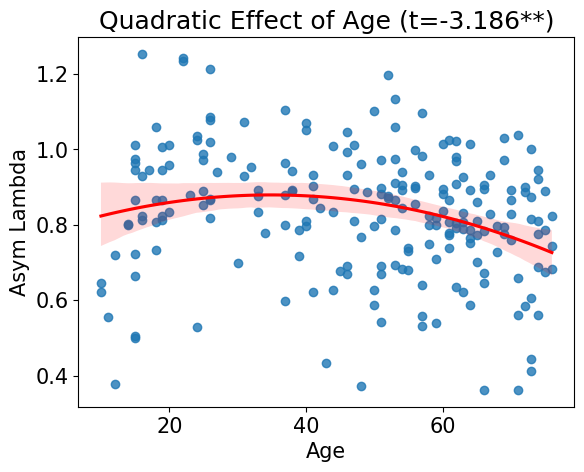

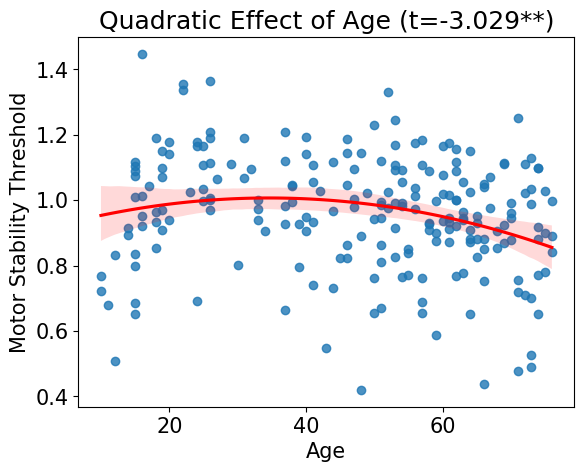

In [86]:
filt_data['age_sq'] = np.power(filt_data['age'], 2)
model = smf.ols('asym_lambda ~ age_sq', data=filt_data).fit()

sns.regplot(x=filt_data['age'], y=filt_data['asym_lambda'], order=2, line_kws={'color':'red'})

plt.xlabel('Age')
plt.ylabel('Asym Lambda')
plt.title(f'Quadratic Effect of Age (t={format_t_test(model.pvalues["age_sq"], model.tvalues["age_sq"])})')
plt.show()

model = smf.ols('motor_stability_threshold ~ age_sq', data=filt_data).fit()

sns.regplot(x=filt_data['age'], y=filt_data['motor_stability_threshold'], order=2, line_kws={'color':'red'})

plt.xlabel('Age')
plt.ylabel('Motor Stability Threshold')
plt.title(f'Quadratic Effect of Age (t={format_t_test(model.pvalues["age_sq"], model.tvalues["age_sq"])})')
plt.show()

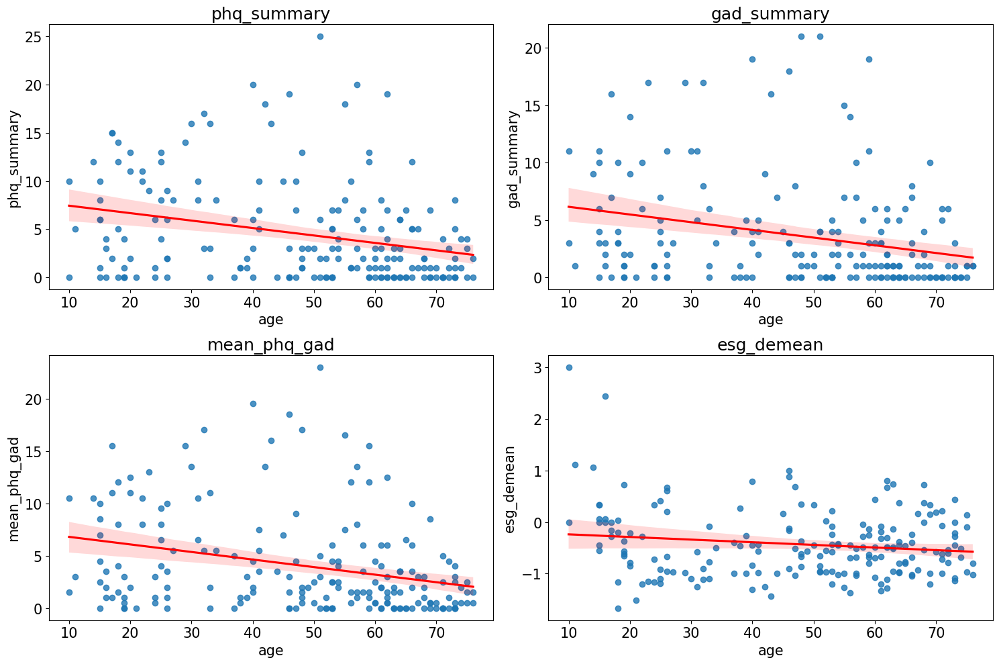

In [87]:
df = merge_and_keep([ml_df, proc_cal_data[['participant', 'age']]], on='participant')

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(['phq_summary', 'gad_summary', 'mean_phq_gad', 'esg_demean']):
    sns.regplot(x=df['age'], y=df[col], ax=axes[i], line_kws={'color': 'red'})
    axes[i].set_title(col)

plt.tight_layout()
plt.show()

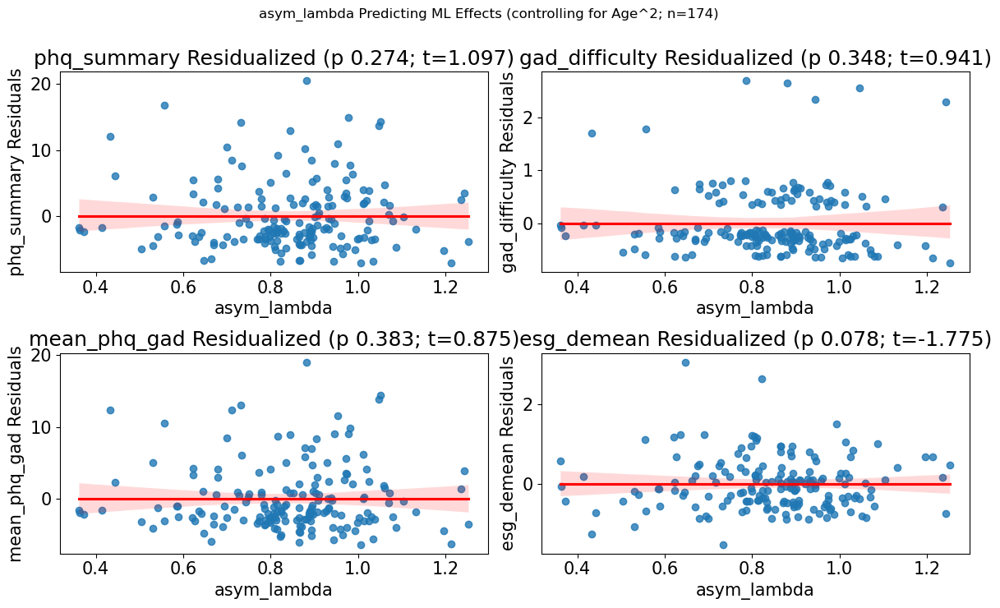

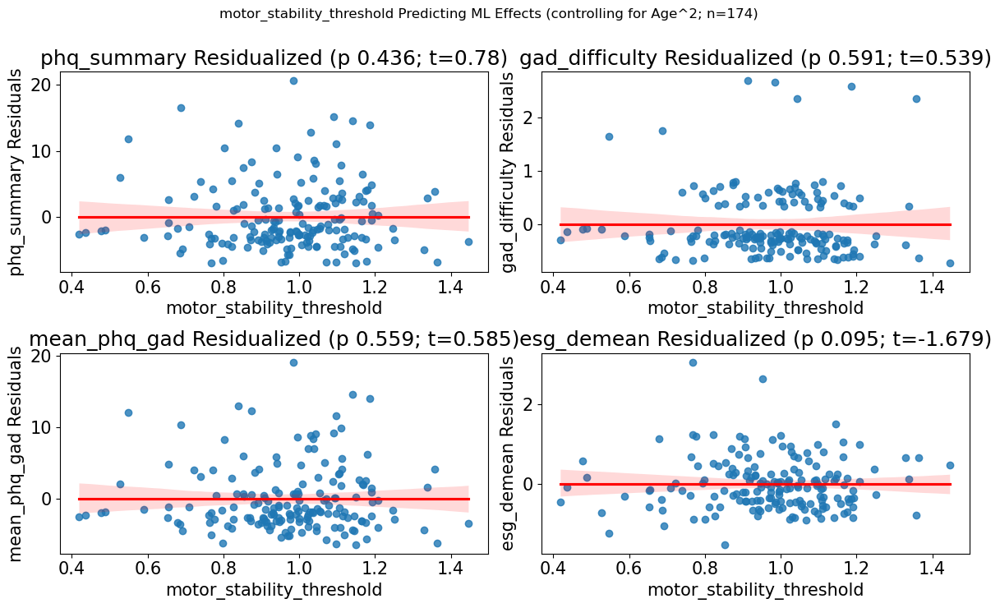

In [88]:
metrics = [col for col in ml_df.columns if 'participant' not in col and '_mean' not in col and 'gad_s' not in col]
cal_ml_df = merge_and_keep([filt_data, ml_df], on='participant', drop=False)
cal_ml_df = cal_ml_df[(cal_ml_df[feature].notna()) & (cal_ml_df['phq_summary'].notna()) & (cal_ml_df['esg_demean'].notna())]

for feature in ['asym_lambda', 'motor_stability_threshold']:
    cal_ml_df['age_sq'] = cal_ml_df['age']**2
    cols = 2
    rows = int(len(metrics) // cols)

    fig, axes = plt.subplots(rows, cols, figsize=(12, 7))
    axes = axes.flatten()
    
    for i, metric in enumerate(metrics):
        data = cal_ml_df.copy()
        model = smf.ols(f'{metric} ~ {feature} + age', data=data).fit()
        data[f'{metric}_residual'] = model.resid
        
        p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)
        sns.regplot(x=data[feature], y=data[f'{metric}_residual'], ax=axes[i], line_kws={'color': 'r'})
        axes[i].set(title=f'{metric} Residualized (p {p_value}; t={t_test})', xlabel=feature, ylabel=f'{metric} Residuals')

    plt.tight_layout()
    plt.suptitle(f'{feature} Predicting ML Effects (controlling for Age^2; n={len(data)})', y=1.05)
    plt.show()

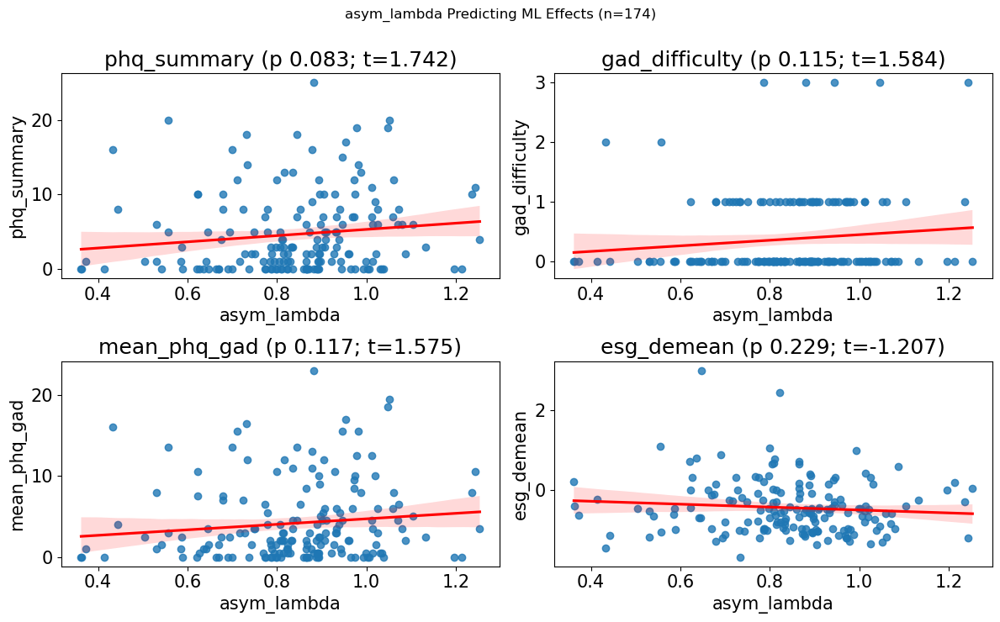

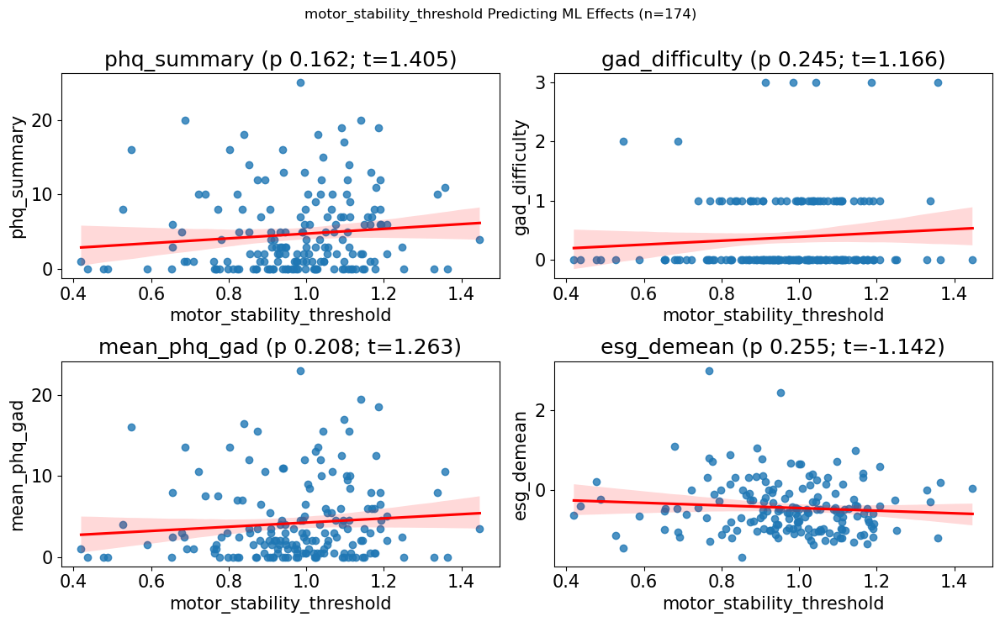

In [89]:
metrics = [col for col in ml_df.columns if 'participant' not in col and '_mean' not in col and 'gad_s' not in col]
cal_ml_df = merge_and_keep([filt_data, ml_df], on='participant', drop=False)
cal_ml_df = cal_ml_df[(cal_ml_df[feature].notna()) & (cal_ml_df['phq_summary'].notna()) & (cal_ml_df['esg_demean'].notna())]
    

for feature in ['asym_lambda', 'motor_stability_threshold']:
    cols = 2
    rows = int(len(metrics) // cols)

    fig, axes = plt.subplots(rows, cols, figsize=(12, 7))
    axes = axes.flatten()
    for i, metric in enumerate(metrics):
        data = cal_ml_df.copy()
        model = smf.ols(f'{metric} ~ {feature}', data=data).fit()
        p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)

        sns.regplot(x=data[feature], y=data[metric], ax=axes[i], line_kws={'color': 'r'})
        axes[i].set(title=f'{metric} (p {p_value}; t={t_test})', xlabel=feature, ylabel=metric)

    plt.tight_layout()
    plt.suptitle(f'{feature} Predicting ML Effects (n={len(data)})', y=1.05)
    plt.show()


In [90]:
metrics = ['BIA_Z', 'ACHBRF_Z']
ind_var_list = ['age', 'sex_f']
data = filt_data
data = data[data['age'] >= 30] 
data['age_sq'] = data['age']**2
print(len(data))
results = {}

df_list = []
for metric in metrics:
    formula = f'{metric} ~ asym_lambda + ' + ' + '.join(ind_var_list)
    model = smf.ols(formula, data=data).fit()
    asym_p, asym_t = model.pvalues['asym_lambda'], model.tvalues['asym_lambda']

    value_dict = {'asym_lambda': {'t': format_t_test(asym_p, asym_t)}}
    
    for ind_var in ind_var_list:
        if ind_var in model.pvalues:
            p, t = model.pvalues[ind_var], model.tvalues[ind_var]
            value_dict[ind_var] = {'t': format_t_test(p, t)}

    for predictor, values in value_dict.items():
        df_list.append({
            'metric': metric,
            'predictor': predictor,
            't_test': values['t']
        })

display(pd.DataFrame(df_list))


ind_var_list = ['age_sq', 'sex_f']
df_list = []
for metric in metrics:
    formula = f'{metric} ~ asym_lambda + ' + ' + '.join(ind_var_list)
    model = smf.ols(formula, data=data).fit()
    asym_p, asym_t = model.pvalues['asym_lambda'], model.tvalues['asym_lambda']

    value_dict = {'asym_lambda': {'t': format_t_test(asym_p, asym_t)}}
    
    for ind_var in ind_var_list:
        if ind_var in model.pvalues:
            p, t = model.pvalues[ind_var], model.tvalues[ind_var]
            value_dict[ind_var] = {'t': format_t_test(p, t)}

    for predictor, values in value_dict.items():
        df_list.append({
            'metric': metric,
            'predictor': predictor,
            't_test': values['t']
        })

display(pd.DataFrame(df_list))



165


,metric,predictor,t_test
0,BIA_Z,asym_lambda,3.371***
1,BIA_Z,age,2.751**
2,ACHBRF_Z,asym_lambda,2.549*
3,ACHBRF_Z,age,3.732***


,metric,predictor,t_test
0,BIA_Z,asym_lambda,3.459***
1,BIA_Z,age_sq,3.014**
2,ACHBRF_Z,asym_lambda,2.63**
3,ACHBRF_Z,age_sq,3.933***


In [91]:
cal_wj_data = merge_and_keep([proc_cal_data, wj_df], on='participant', drop=False)


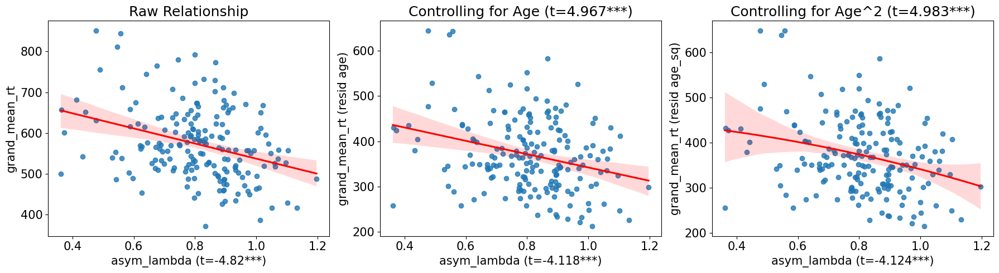

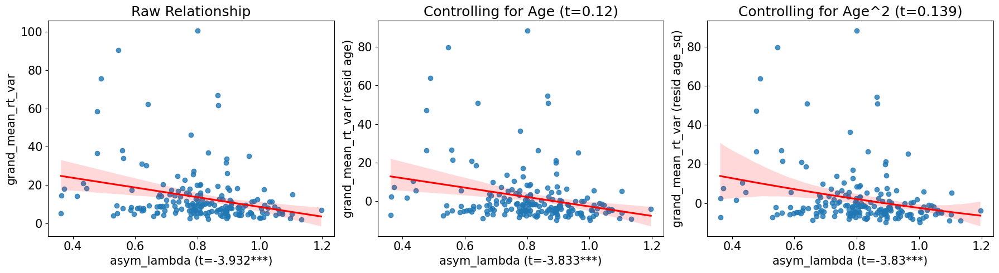

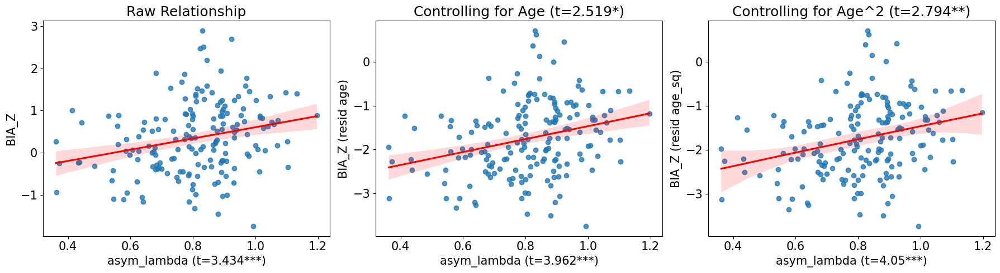

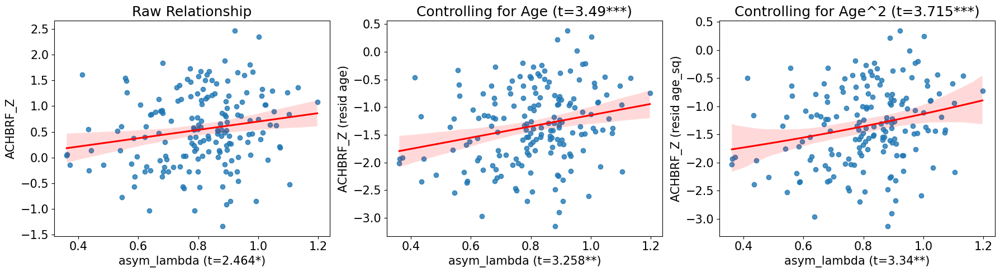

In [92]:
def plot_partial_residuals(data, dv):
    data = data.copy()
    data['age_sq'] = data['age'] ** 2

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    sns.regplot(x='asym_lambda', y=dv, data=data, ax=axes[0], line_kws={'color':'red'})
    
    model = smf.ols(f'{dv} ~ asym_lambda', data=data).fit()
    t = format_t_test(model.pvalues['asym_lambda'], model.tvalues['asym_lambda'])
    axes[0].set_xlabel(f"asym_lambda (t={t})")
    axes[0].set_ylabel(dv)
    axes[0].set_title("Raw Relationship")

    model = smf.ols(f'{dv} ~ age', data=data).fit()
    data[f'{dv}_resid'] = model.resid + np.min(data[dv])
    model = smf.ols(f'{dv} ~ asym_lambda + age', data=data).fit()
    sns.regplot(x='asym_lambda', y=f'{dv}_resid', data=data, ax=axes[1], line_kws={'color':'red'})
    axes[1].set_ylabel(f"{dv} (resid age)")

    t = format_t_test(model.pvalues['asym_lambda'], model.tvalues['asym_lambda'])
    axes[1].set_xlabel(f"asym_lambda (t={t})")

    t = format_t_test(model.pvalues['age'], model.tvalues['age'])
    axes[1].set_title(f"Controlling for Age (t={t})")

    model = smf.ols(f'{dv} ~ age_sq', data=data).fit()
    data[f'{dv}_resid'] = model.resid + np.min(data[dv])
    model = smf.ols(f'{dv} ~ asym_lambda + age_sq', data=data).fit()
    sns.regplot(x='asym_lambda', y=f'{dv}_resid', data=data, ax=axes[2], line_kws={'color':'red'}, order=2)
    axes[2].set_ylabel(f"{dv} (resid age_sq)")

    t = format_t_test(model.pvalues['asym_lambda'], model.tvalues['asym_lambda'])
    axes[2].set_xlabel(f"asym_lambda (t={t})")

    t = format_t_test(model.pvalues['age_sq'], model.tvalues['age_sq'])
    axes[2].set_title(f"Controlling for Age^2 (t={t})")

    plt.tight_layout()
    plt.show()

data = cal_flanker_data[
    (cal_flanker_data.calCST_outlier == 0) & 
    (cal_flanker_data.grand_mean_accuracy_outlier == 0) &
    (cal_flanker_data.grand_mean_rt_outlier == 0)]
data = data[data['age'] > 30]
for metric in ['grand_mean_rt', 'grand_mean_rt_var']:
    plot_partial_residuals(data, metric)
    
data = cal_wj_data[(cal_wj_data.calCST_outlier == 0) &
                   (cal_wj_data.wj_outlier == 0)]
data = data[data['age'] > 30]
for metric in ['BIA_Z', 'ACHBRF_Z']:
    plot_partial_residuals(data, metric)

In [93]:
results = []
df = filt_data.copy()

for col in [col for col in vo2_df.columns if 'participant' not in col]:
    formula = f'{col} ~ asym_lambda + age_squared + sex_f'
    model = smf.ols(formula, data=df).fit()
    t, p = model.tvalues.get('asym_lambda', float('nan')), model.pvalues.get('asym_lambda', float('nan'))
    t_age, p_age = model.tvalues.get('age_squared', float('nan')), model.pvalues.get('age_squared', float('nan'))
    t_sex, p_sex = model.tvalues.get('sex_f', float('nan')), model.pvalues.get('sex_f', float('nan'))

    results.append({'variable': col, 
                    't': format_t_test(p, t),
                    'age': format_t_test(p_age, t_age),
                    'sex': format_t_test(p_sex, t_sex)})

regression_df = pd.DataFrame(results)
print('Quadratic Effect of Age')
display(regression_df.T)

results = []
df = df[df['age'] >= 30]

for col in [col for col in vo2_df.columns if 'participant' not in col]:
    formula = f'{col} ~ asym_lambda + age + sex_f'
    model = smf.ols(formula, data=df).fit()
    t, p = model.tvalues.get('asym_lambda', float('nan')), model.pvalues.get('asym_lambda', float('nan'))
    t_age, p_age = model.tvalues.get('age', float('nan')), model.pvalues.get('age', float('nan'))
    t_sex, p_sex = model.tvalues.get('sex_f', float('nan')), model.pvalues.get('sex_f', float('nan'))

    results.append({'variable': col, 
                    't': format_t_test(p, t),
                    'age': format_t_test(p_age, t_age),
                    'sex': format_t_test(p_sex, t_sex)})

regression_df = pd.DataFrame(results)
print('Linear Effect of Age')
display(regression_df.T)


Quadratic Effect of Age


,0,1,2,3,4,5
variable,VO2_weight_reg,VO2_max,RER_max,HR_max,HR_agemax,pct_hr_agemax
t,-1.96,2.607**,1.955,1.25,-1.654,1.471
age,2.389*,-7.865***,-3.437***,-11.531***,-64.869***,-0.394
sex,nan,nan,nan,nan,nan,nan


Linear Effect of Age


,0,1,2,3,4,5
variable,VO2_weight_reg,VO2_max,RER_max,HR_max,HR_agemax,pct_hr_agemax
t,-2.057*,3.61***,1.596,1.752,-0.697,1.745
age,0.399,-3.006**,-3.848***,-7.827***,-308.026***,-0.844
sex,nan,nan,nan,nan,nan,nan


In [94]:
cal_wj_data = merge_and_keep([proc_cal_data, wj_df, flanker_df], on='participant', drop=False)
metrics = ['BIA_Z', 'ACHBRF_Z']
ind_var_list = ['age_sq', 'sex_f']
data = cal_wj_data[(cal_wj_data.calCST_outlier == 0) &
                   (cal_wj_data.wj_outlier == 0)]
data['age_sq'] = data['age']**2
data = data[data['age'] > 30]
print(len(data))
results = {}

df_list = []
for metric in metrics:
    formula = f'{metric} ~ asym_lambda + ' + ' + '.join(ind_var_list)
    model = smf.ols(formula, data=data).fit()
    asym_p, asym_t = model.pvalues['asym_lambda'], model.tvalues['asym_lambda']

    value_dict = {'asym_lambda': {'t': format_t_test(asym_p, asym_t)}}
    
    for ind_var in ind_var_list:
        if ind_var in model.pvalues:
            p, t = model.pvalues[ind_var], model.tvalues[ind_var]
            value_dict[ind_var] = {'t': format_t_test(p, t)}

    for predictor, values in value_dict.items():
        df_list.append({
            'metric': metric,
            'predictor': predictor,
            't_test': values['t']
        })

display(pd.DataFrame(df_list))



ind_var_list = ['age', 'sex_f']
df_list = []
for metric in metrics:
    formula = f'{metric} ~ asym_lambda + ' + ' + '.join(ind_var_list)
    model = smf.ols(formula, data=data).fit()
    asym_p, asym_t = model.pvalues['asym_lambda'], model.tvalues['asym_lambda']

    value_dict = {'asym_lambda': {'t': format_t_test(asym_p, asym_t)}}
    
    for ind_var in ind_var_list:
        if ind_var in model.pvalues:
            p, t = model.pvalues[ind_var], model.tvalues[ind_var]
            value_dict[ind_var] = {'t': format_t_test(p, t)}

    for predictor, values in value_dict.items():
        df_list.append({
            'metric': metric,
            'predictor': predictor,
            't_test': values['t']
        })

display(pd.DataFrame(df_list))

175


,metric,predictor,t_test
0,BIA_Z,asym_lambda,4.071***
1,BIA_Z,age_sq,2.839**
2,BIA_Z,sex_f,0.786
3,ACHBRF_Z,asym_lambda,3.464***
4,ACHBRF_Z,age_sq,3.771***
5,ACHBRF_Z,sex_f,0.954


,metric,predictor,t_test
0,BIA_Z,asym_lambda,3.971***
1,BIA_Z,age,2.553*
2,BIA_Z,sex_f,0.734
3,ACHBRF_Z,asym_lambda,3.367***
4,ACHBRF_Z,age,3.534***
5,ACHBRF_Z,sex_f,0.893


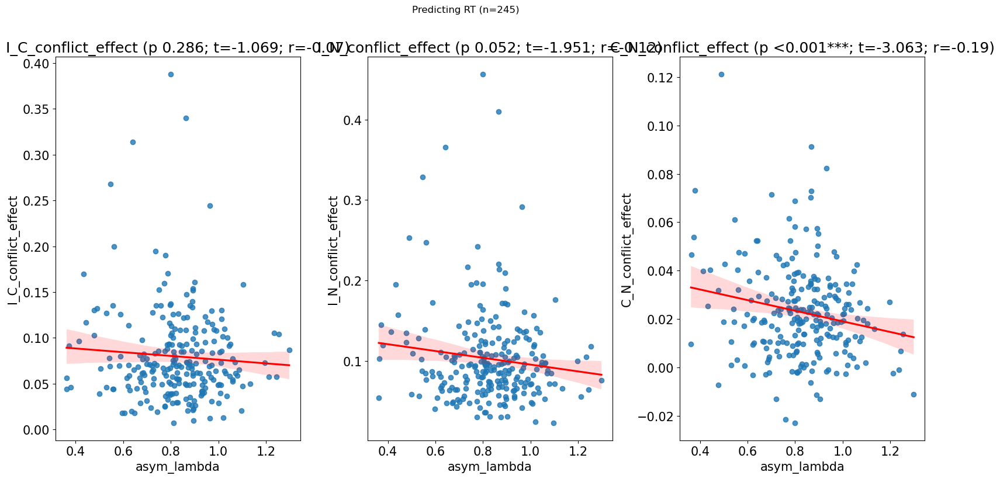

In [95]:
cal_flanker_data = merge_and_keep([proc_cal_data, flanker_df], on='participant', drop=True)

df_filt = cal_flanker_data[
    (cal_flanker_data.calCST_outlier == 0) & 
    (cal_flanker_data.grand_mean_accuracy_outlier == 0) &
    (cal_flanker_data.grand_mean_rt_outlier == 0)]

fig, axes = plt.subplots(1, 3, figsize=(16, 8))
axes = axes.flatten()

feature = 'asym_lambda'
for jdx, metric in enumerate(['I_C_conflict_effect', 'I_N_conflict_effect',
       'C_N_conflict_effect']):  
    data = df_filt.copy()
    model = smf.ols(f'{metric} ~ {feature}', data=data).fit()
    p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)

    # Calculate Pearson correlation
    correlation, _ = stats.pearsonr(data[feature], data[metric])

    sns.regplot(x=data[feature], y=data[metric], line_kws={'color': 'r'}, ax=axes[jdx])
    axes[jdx].set_title(f'{metric} (p {p_value}; t={t_test}; r={correlation:.2f})')

fig.suptitle(f'Predicting RT (n={len(data)})', y=1.02)
plt.tight_layout()
plt.show()

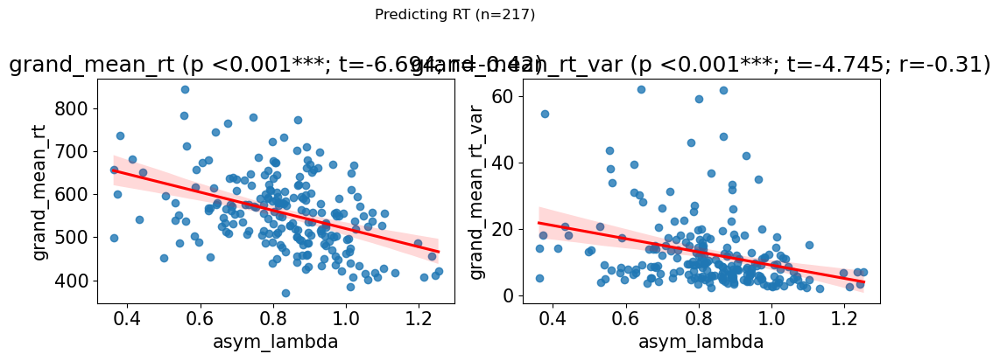

In [96]:
df_filt = filt_data

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes = axes.flatten()

for idx, feature in enumerate(['asym_lambda']):
    for jdx, metric in enumerate(['grand_mean_rt', 'grand_mean_rt_var']):
        ax = axes[idx * 2 + jdx]  
        data = df_filt.copy()
        model = smf.ols(f'{metric} ~ {feature}', data=data).fit()
        p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)

        # Calculate Pearson correlation
        correlation, _ = stats.pearsonr(data[feature], data[metric])

        sns.regplot(x=data[feature], y=data[metric], line_kws={'color': 'r'}, ax=ax)
        ax.set_title(f'{metric} (p {p_value}; t={t_test}; r={correlation:.2f})')

fig.suptitle(f'Predicting RT (n={len(data)})', y=1.02)
plt.tight_layout()
plt.show()

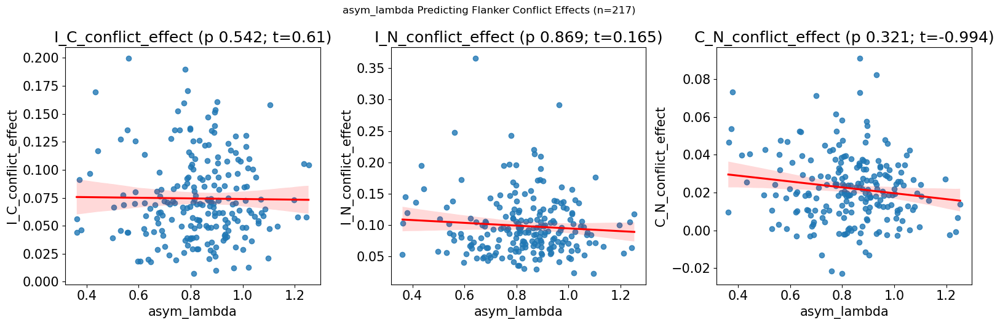

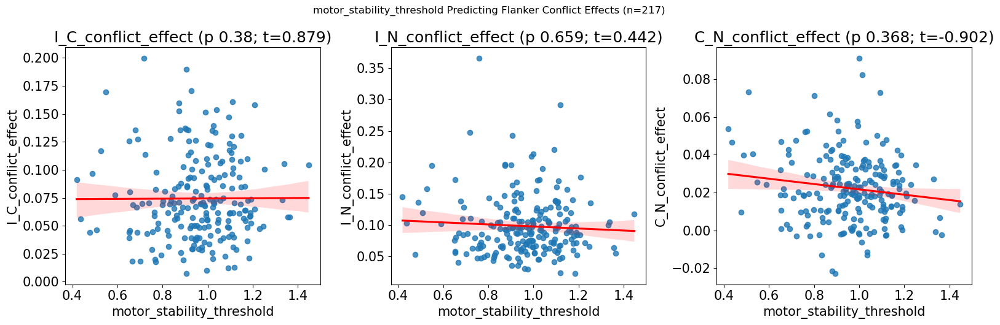

In [97]:
metrics = [col for col in flanker_df.columns if 'conflict' in col and 'outlier' not in col and 'var' not in col]

for feature in ['asym_lambda', 'motor_stability_threshold']:
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    for i, metric in enumerate(metrics[:3]):
        data = filt_data.copy()
        if 'I_C' in metric:
            data = data[data['I_C_conflict_effect'] < 0.2]
        model = smf.ols(f'{metric} ~ {feature} + base_rt', data=data).fit()
        p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)

        sns.regplot(x=data[feature], y=data[metric], ax=axes[i], line_kws={'color': 'r'})
        axes[i].set(title=f'{metric} (p {p_value}; t={t_test})', xlabel=feature, ylabel=metric)

    plt.tight_layout()
    plt.suptitle(f'{feature} Predicting Flanker Conflict Effects (n={len(data)})', y=1.05)
    plt.show()


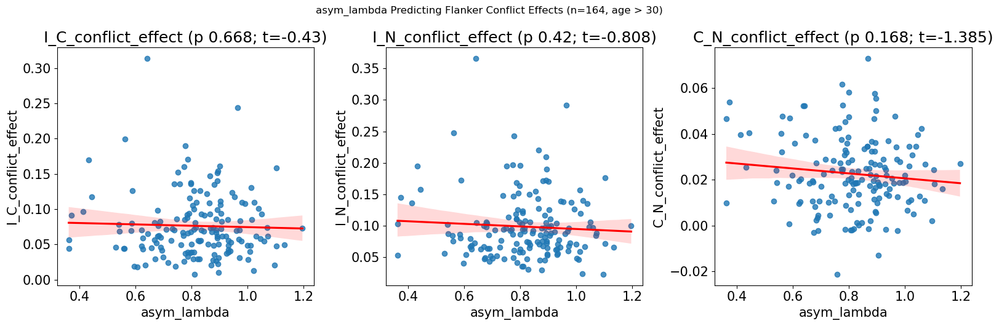

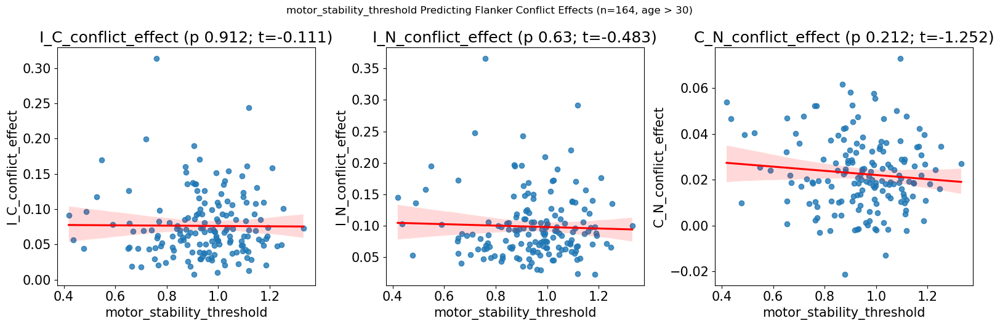

In [98]:
metrics = [col for col in flanker_df.columns if 'conflict' in col and 'outlier' not in col and 'var' not in col]

for feature in ['asym_lambda', 'motor_stability_threshold']:
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    for i, metric in enumerate(metrics[:3]):
        data = filt_data[filt_data.age > 30].copy()
        model = smf.ols(f'{metric} ~ {feature}', data=data).fit()
        p_value, t_test = format_p_value(model.pvalues[feature]), np.round(model.tvalues[feature], 3)

        sns.regplot(x=data[feature], y=data[metric], ax=axes[i], line_kws={'color': 'r'})
        axes[i].set(title=f'{metric} (p {p_value}; t={t_test})', xlabel=feature, ylabel=metric)

    plt.tight_layout()
    plt.suptitle(f'{feature} Predicting Flanker Conflict Effects (n={len(data)}, age > 30)', y=1.05)
    plt.show()
    

In [99]:
format_p_value = lambda p: '<0.001**' if p < 0.001 else ('<0.05*' if p < 0.05 else f'{np.round(p, 3)}')
metrics = [col for col in flanker_df.columns if 'conflict' in col and 'outlier' not in col and 'var' not in col]
ind_var_list = ['age + sex_f + base_rt']
data = filt_data[filt_data['age'] > 30]

results = {}

for ind in ind_var_list:
    df_list = []
    for metric in metrics[:3]:
        model = smf.ols(f'{metric} ~ asym_lambda' + (f' + {ind}' if ind else ''), data=data).fit()

        value_dict = {
            'asym_lambda': {
                'p': format_p_value(model.pvalues['asym_lambda']), 
                't': np.round(model.tvalues['asym_lambda'], 3)}
        }
        

        if ind:
            ind_list = [var.strip() for var in ind.split('+')]
            if 'sex_f' in ind_list:
                value_dict['sex_f'] = {
                    'p': format_p_value(model.pvalues['sex_f[T.1.0]']),
                    't': np.round(model.tvalues['sex_f[T.1.0]'])
                }
            for ind_var in ind_list:
                if ind_var in model.pvalues:
                    value_dict[ind_var] = {
                        'p': format_p_value(model.pvalues[ind_var]),
                        't': np.round(model.tvalues[ind_var], 3)
                    }

        for predictor, values in value_dict.items():
            df_list.append({
                'metric': metric,
                'predictor': predictor,
                'p_value': values['p'],
                't_test': values['t']  # Some variables might not have effect size
            })
    
    results[ind] = pd.DataFrame(df_list)

for ind, df in results.items():
    display(df)

,metric,predictor,p_value,t_test
0,I_C_conflict_effect,asym_lambda,0.908,-0.116
1,I_C_conflict_effect,sex_f,0.822,-0.000
2,I_C_conflict_effect,age,0.201,-1.285
3,I_C_conflict_effect,base_rt,<0.05*,2.254
4,I_N_conflict_effect,asym_lambda,0.759,-0.307
5,I_N_conflict_effect,sex_f,0.824,-0.000
6,I_N_conflict_effect,age,0.387,-0.867
7,I_N_conflict_effect,base_rt,<0.05*,2.473
8,C_N_conflict_effect,asym_lambda,0.509,-0.661
9,C_N_conflict_effect,sex_f,0.943,-0.000


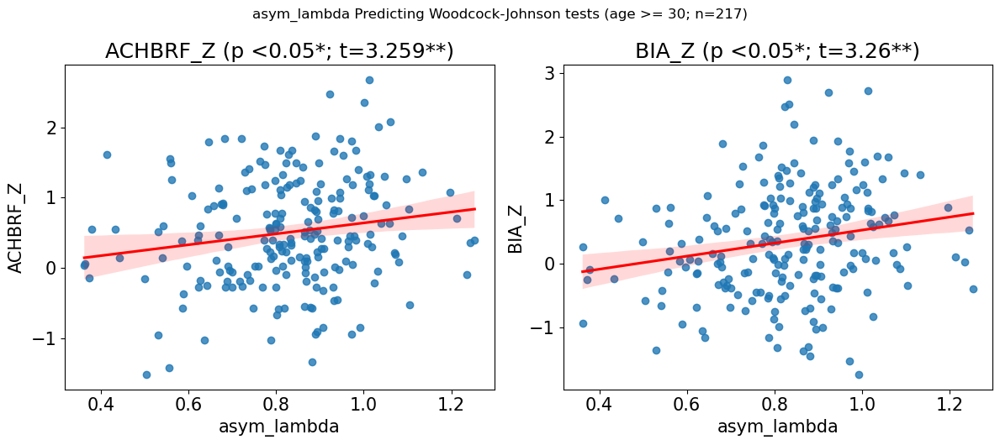

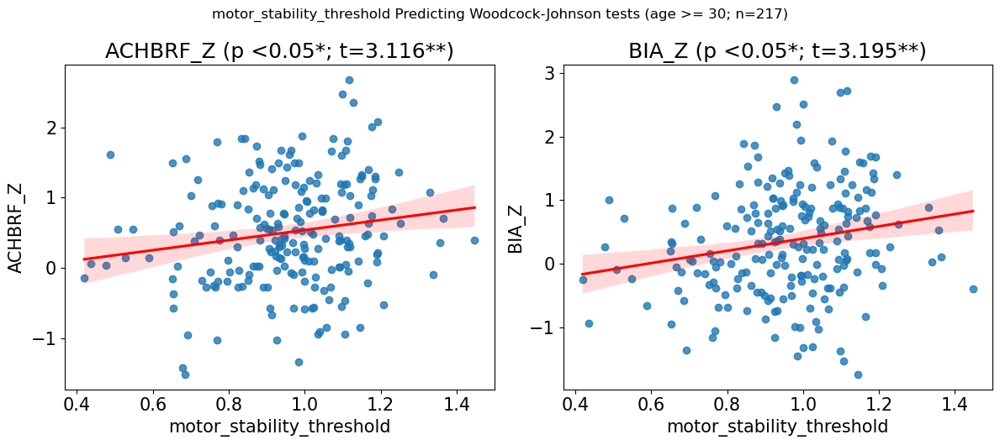

In [100]:
metrics = ['ACHBRF_Z', 'BIA_Z']
cal_wj_df = filt_data.copy()

for feature in ['asym_lambda', 'motor_stability_threshold']:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for i, metric in enumerate(metrics[:2]):
        data = cal_wj_df
        model = smf.ols(f'{metric} ~ {feature} + np.power(age, 2) + sex_f', data=data).fit()
        valid_data = data.loc[model.model.data.row_labels].sort_values(feature)

        p_value = format_p_value(model.pvalues[feature])
#         p_value = '<0.001*' if p_value < 0.001 else '<0.05*' if p_value < 0.05 else p_value
        t_test = format_t_test(model.pvalues[feature], model.tvalues[feature])

        sns.regplot(x=valid_data[feature], y=valid_data[metric], ax=axes[i], line_kws={'color': 'r'})
        axes[i].set(title=f'{metric} (p {p_value}; t={t_test})', xlabel=feature, ylabel=metric)

    plt.tight_layout()
    plt.suptitle(f'{feature} Predicting Woodcock-Johnson tests (age >= 30; n={len(valid_data)})', y=1.05)
    plt.show()

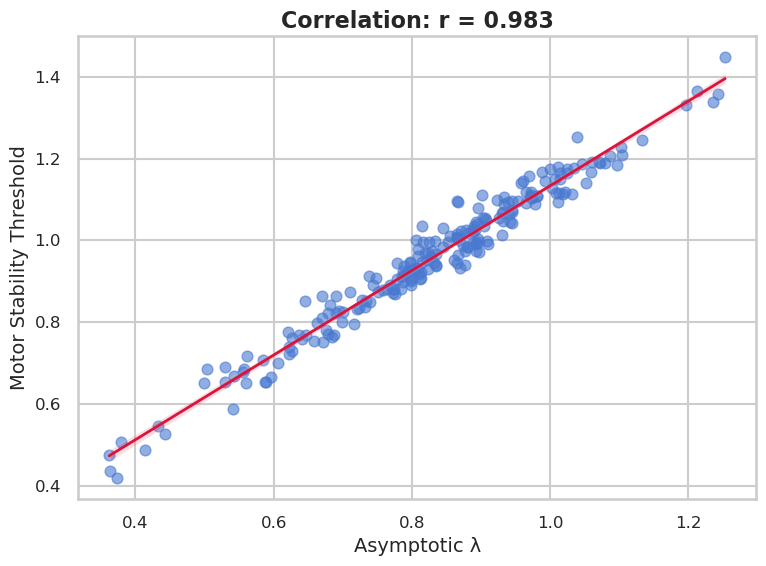

In [101]:
plt.figure(figsize=(8, 6))

sns.set(style="whitegrid", context="talk", palette="muted")

sns.regplot(
    x=filt_data['asym_lambda'],
    y=filt_data['motor_stability_threshold'],
    line_kws={'color': 'crimson', 'linewidth': 2},
    scatter_kws={'alpha': 0.6, 's': 60}
)

r, p = pearsonr(filt_data['asym_lambda'], filt_data['motor_stability_threshold'])

plt.title(f'Correlation: r = {r:.3f}', fontsize=16, weight='bold')
plt.xlabel('Asymptotic λ', fontsize=14)
plt.ylabel('Motor Stability Threshold', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

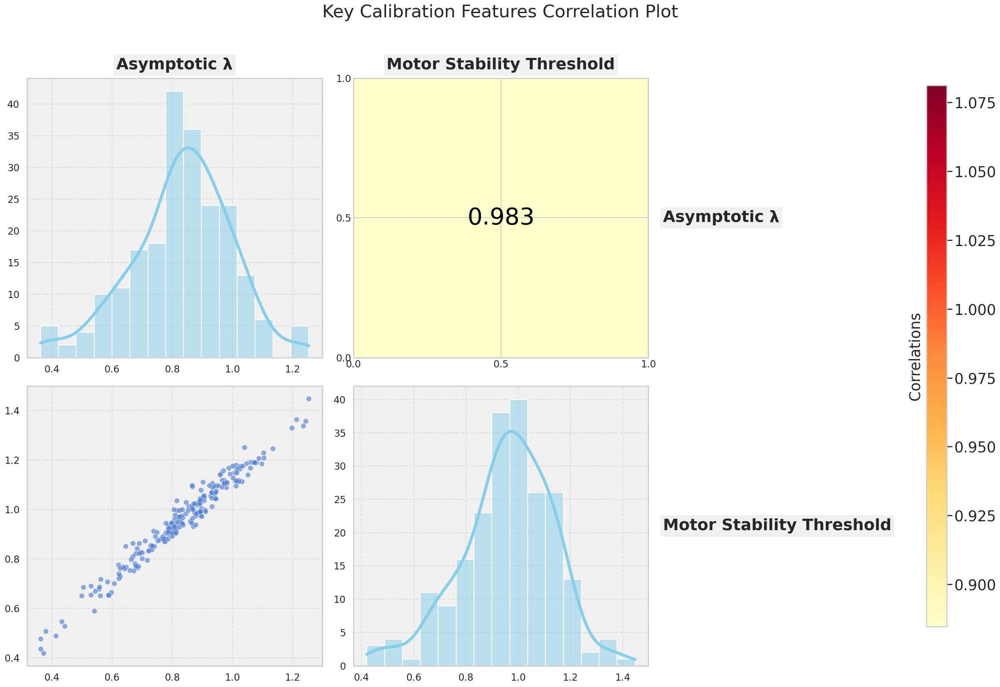

In [102]:
features = {'asym_lambda': 'Asymptotic λ',
            'motor_stability_threshold':'Motor Stability Threshold'}
feature_list = list(features.keys())
subset = filt_data[feature_list]
corr = subset.corr()
corr_values = list(set(np.concatenate(corr.values)))
corr_values = [val for val in corr_values if val != 1]
corr_palette = 'YlOrRd'

vmin, vmax = corr.min().min(), corr.max().max()

fig, axes = plt.subplots(len(features), len(features), figsize=(24, 16))

for i in range(len(features)):
    for j in range(len(features)):
        ax = axes[i, j]
        
        if i == j:
            sns.histplot(subset.iloc[:, i], bins=15, kde=True, ax=ax, color='skyblue', 
                         line_kws={'linewidth': 5, 'color':'red'})
            ax.set_facecolor('#f0f0f0')
            ax.grid(True, linestyle='--', alpha=0.5)
            ax.set_xlabel('')
            ax.set_ylabel('')
            
            x_labels = [label.get_text() for label in ax.get_xticklabels()]
            if any(len(label) > 4 for label in x_labels):
                ax.tick_params(axis='x', rotation=45)
        
        elif i > j:
            scatter = sns.scatterplot(x=subset.iloc[:, j], y=subset.iloc[:, i], ax=ax, alpha=0.6, 
                                      legend=False)
            ax.set_facecolor('#f0f0f0')
            ax.grid(True, linestyle='--', alpha=0.5)
            ax.set_xlabel('')
            ax.set_ylabel('')
            
            x_labels = [label.get_text() for label in ax.get_xticklabels()]
            if any(len(label) > 4 for label in x_labels):
                ax.tick_params(axis='x', rotation=45)
        
        else:
            corr_value = corr.iloc[i, j]
            
            norm = plt.Normalize(np.min(corr_values), np.max(corr_values))
            color = plt.cm.get_cmap(corr_palette)(norm(corr_value))
            
            ax.set_facecolor(color)
            if np.mean(color[0:3]) < 0.4:
                ax.text(0.5, 0.5, f"{corr_value:.3f}", color='lightgrey', fontsize=40, ha='center', va='center')
            else:                
                ax.text(0.5, 0.5, f"{corr_value:.3f}", color='black', fontsize=40, ha='center', va='center')

            ax.set_xticks(np.linspace(*ax.get_xlim(), num=3))
            ax.set_yticks(np.linspace(*ax.get_ylim(), num=3))
            ax.tick_params(axis='both', which='both', length=0)

            ax.set_xlabel('')
            ax.set_ylabel('')

for idx, var in enumerate(subset.columns):
    axes[0, idx].set_title(features[var], fontsize=27, pad=15, fontweight='bold', backgroundcolor='#f0f0f0')
    axes[idx, -1].annotate(features[var], xy=(1.05, 0.5), xycoords='axes fraction', fontsize=27, fontweight='bold', backgroundcolor='#f0f0f0', ha='left', va='center', rotation=0)

left = 0.92
bottom = 0.1
width = 0.02
height = 0.8
cbar_ax = fig.add_axes([left, bottom, width, height])

norm = plt.Normalize(np.min(corr_values), np.max(corr_values))
sm = plt.cm.ScalarMappable(cmap=corr_palette, norm=norm)
sm.set_array(corr_values)
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Correlations', fontsize=25, labelpad=-150)
cbar.ax.tick_params(labelsize=25)

plt.suptitle('Key Calibration Features Correlation Plot', fontsize=30, y=1.02)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

# cpCST vs Dimensional Data

In [103]:
df = merge_and_keep([proc_cal_data, flanker_df], on='participant', drop=True)

In [104]:
outlier_cols = ['calCST_outlier', 'grand_mean_outlier']
filt_ptp_list = []
for col in outlier_cols:
    temp_list = df[df[col] == 1].participant.values
    filt_ptp_list.append(temp_list)
    
filt_ptp_list = [val for slist in filt_ptp_list for val in slist]
filt_ptp_list = list(set(filt_ptp_list))
    

# Plotting Age Comparisons: Maturing (age < 30) vs Declining (age >= 30)

In [105]:
cal_flanker_wj_df = merge_and_keep([proc_cal_data, wj_df, flanker_df], on='participant', drop=True)


In [106]:
def present_col_age_split(df, col):
    young = df[df['age'] < 30]
    old = df[df['age'] >= 30]
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    axes = axes.flatten()
    
    model = smf.ols(f'{col} ~ age', data=young).fit()
    p_value, t_test = format_p_value(model.pvalues['age']), np.round(model.tvalues['age'], 3)
    t_test = format_t_test(model.pvalues['age'], model.tvalues['age'])
    sns.regplot(x=young['age'], y=young[col], ax=axes[0], line_kws={'color':'red'})
    axes[0].set_xlabel(f'Age')
    axes[0].set_ylabel(col)
    axes[0].set_title(f'Maturing Sample (t={t_test}; age < 30; n={len(young)})')
    
    model = smf.ols(f'{col} ~ age', data=old).fit()
    p_value, t_test = format_p_value(model.pvalues['age']), np.round(model.tvalues['age'], 3)
    t_test = format_t_test(model.pvalues['age'], model.tvalues['age'])
    sns.regplot(x=old['age'], y=old[col], ax=axes[1], line_kws={'color':'red'})
    axes[1].set_xlabel(f'Age')
    axes[1].set_ylabel(col)
    axes[1].set_title(f'Declining Sample (t={t_test}; age >= 30; n={len(old)})')
    
    plt.suptitle(f'Full Sample (n={len(df)})')
    fig.tight_layout()
    plt.show()
    

In [107]:
def present_col_age_split(df, col):
    young = df[df['age'] < 30]
    old = df[df['age'] >= 30]
    
    model = smf.ols(f'{col} ~ age', data=young).fit()
    p_value, t_test = format_p_value(model.pvalues['age']), np.round(model.tvalues['age'], 3)
    young_t_test = format_t_test(model.pvalues['age'], model.tvalues['age'])
    
    model = smf.ols(f'{col} ~ age', data=old).fit()
    p_value, t_test = format_p_value(model.pvalues['age']), np.round(model.tvalues['age'], 3)
    old_t_test = format_t_test(model.pvalues['age'], model.tvalues['age'])
    
    sns.regplot(x=young['age'], y=young[col], line_kws={'color':'orange'}, scatter_kws={'color':'orange'})
    sns.regplot(x=old['age'], y=old[col], line_kws={'color':'blue'}, scatter_kws={'color':'blue'})
    plt.xlabel(f'Age')
    plt.ylabel(col)
    plt.title(f'Maturing Sample (t={young_t_test}; age < 30; n={len(young)})\nDeclining Sample (t={old_t_test}; age >= 30; n={len(old)})')
    
    plt.suptitle(f'Full Sample (n={len(df)})', y=1.01)
    fig.tight_layout()
    plt.show()
    

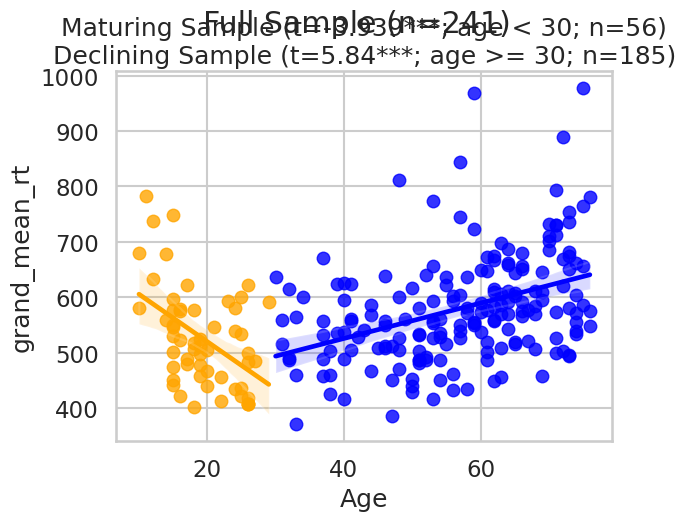

In [108]:
present_col_age_split(cal_flanker_wj_df, 'grand_mean_rt')

In [109]:
def compare_age_slopes(df, col, dep):
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    axes = axes.flatten()
    
    df = df.copy()
    df['age_group'] = np.where(df['age'] < 30, 'maturing', 'declining')

    model = smf.ols(f'{col} ~ age * age_group', data=df).fit()
    interaction_term = 'age:age_group[T.maturing]'
    t_test = format_t_test(model.pvalues.get(interaction_term, np.nan), model.tvalues.get(interaction_term, np.nan))
    
    sns.scatterplot(data=df, x='age', y=col, hue='age_group', ax=axes[0], palette='coolwarm', alpha=0.6)
    sns.regplot(data=df[df['age_group'] == 'maturing'], x='age', ax=axes[0],  y=col, scatter=False, color='blue')
    sns.regplot(data=df[df['age_group'] == 'declining'], x='age', ax=axes[0],  y=col, scatter=False, color='red')
    axes[0].set_title(f'Age Interaction: t={t_test}\nMaturing Sample (age < 30; n={len(df[df["age"] < 30])})\nDeclining Sample (age >= 30; n={len(df[df["age"] >= 30])})')
    
    resid_col = col + '_resid'
    resid_model = smf.ols(f'{col} ~ {("+").join(dep)}', data=df).fit()
    df[resid_col] = resid_model.resid
    model = smf.ols(f'{resid_col} ~ asym_lambda * age_group', data=df).fit()
    interaction_term = 'asym_lambda:age_group[T.maturing]'
    t_test = format_t_test(model.pvalues.get(interaction_term, np.nan), model.tvalues.get(interaction_term, np.nan))

    sns.scatterplot(data=df, x='asym_lambda', y=resid_col, hue='age_group', ax=axes[1], palette='coolwarm', alpha=0.6)
    sns.regplot(data=df[df['age_group'] == 'maturing'], x='asym_lambda', ax=axes[1], y=resid_col, scatter=False, color='blue')
    sns.regplot(data=df[df['age_group'] == 'declining'], x='asym_lambda', ax=axes[1], y=resid_col, scatter=False, color='red')
    axes[1].set_title(f'Age Interaction: t={t_test}\nMaturing Sample (age < 30; n={len(df[df["age"] < 30])})\nDeclining Sample (age >= 30; n={len(df[df["age"] >= 30])})')
    
    plt.legend()
    plt.tight_layout()
    plt.show()

In [110]:
cal_flanker_wj_data = merge_and_keep([flanker_df, proc_cal_data, wj_df], on='participant', drop=False)

n_filt_data = cal_flanker_wj_data[
    (cal_flanker_wj_data['calCST_outlier']==0)&
    (cal_flanker_wj_data['I_C_conflict_effect_outlier']==0)&
    (cal_flanker_wj_data['I_N_conflict_effect_outlier']==0)&
    (cal_flanker_wj_data['C_N_conflict_effect_outlier']==0)&
    (cal_flanker_wj_data['grand_mean_outlier']==0)&
    (cal_flanker_wj_data['BIA_Z_outlier']==0)&
    (cal_flanker_wj_data['ACHBRF_Z_outlier']==0)
]

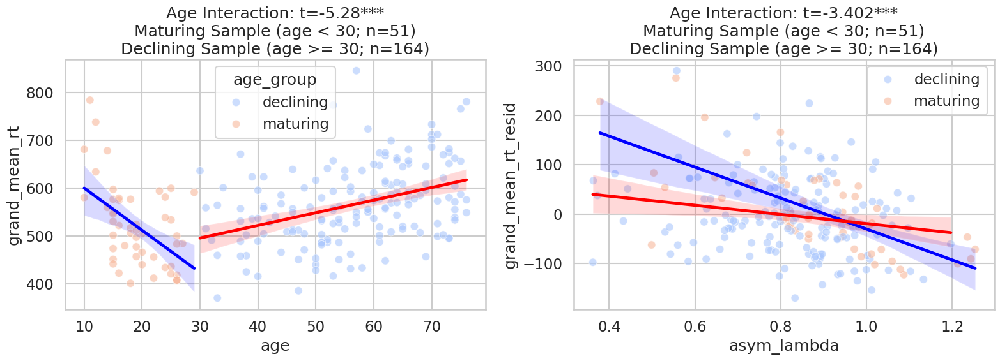

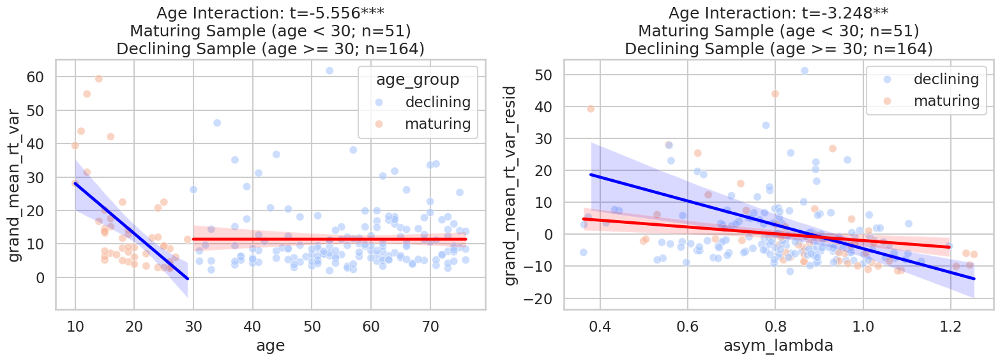

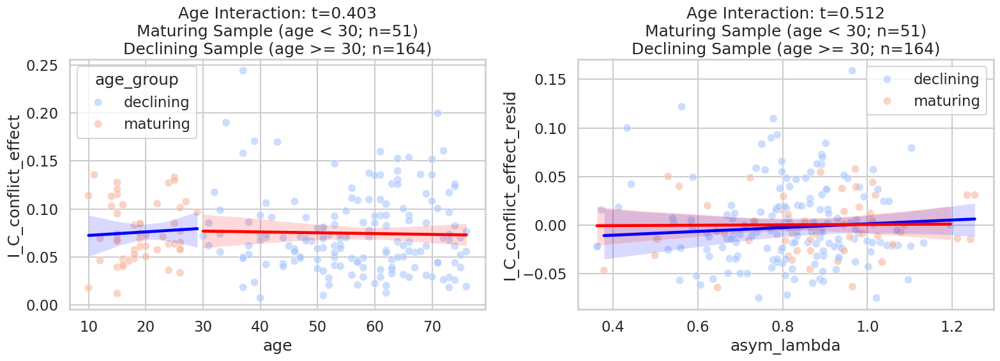

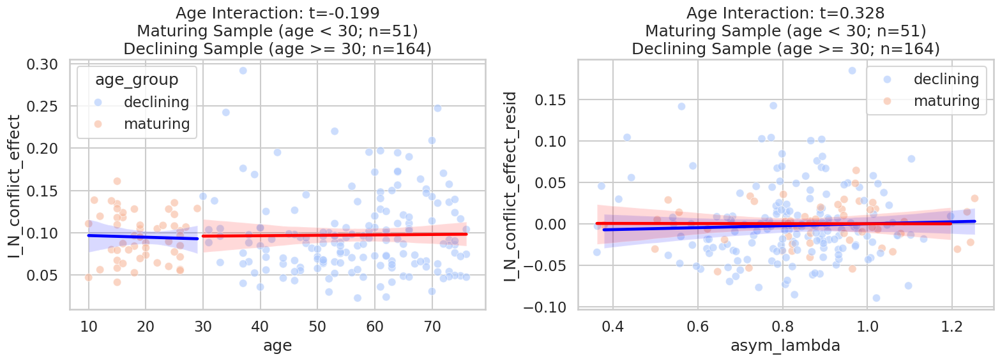

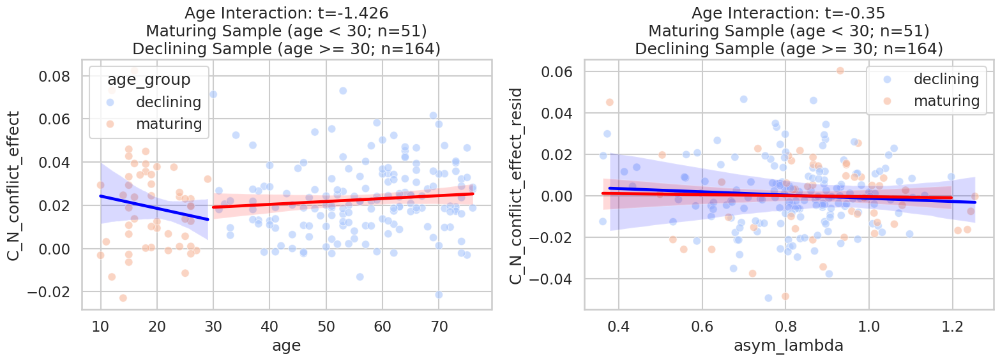

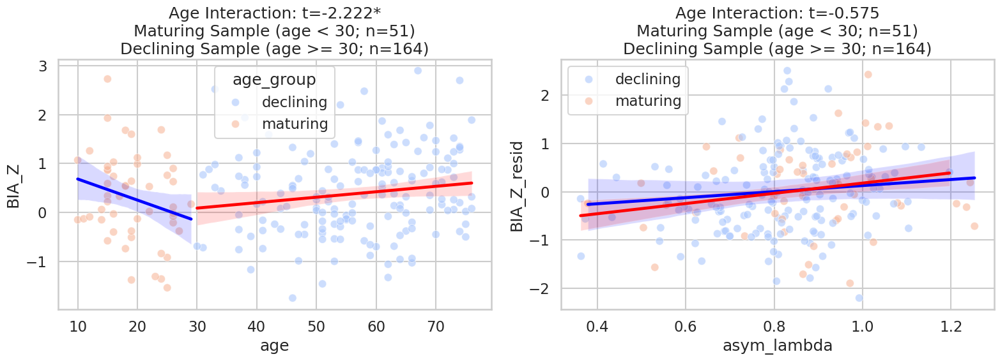

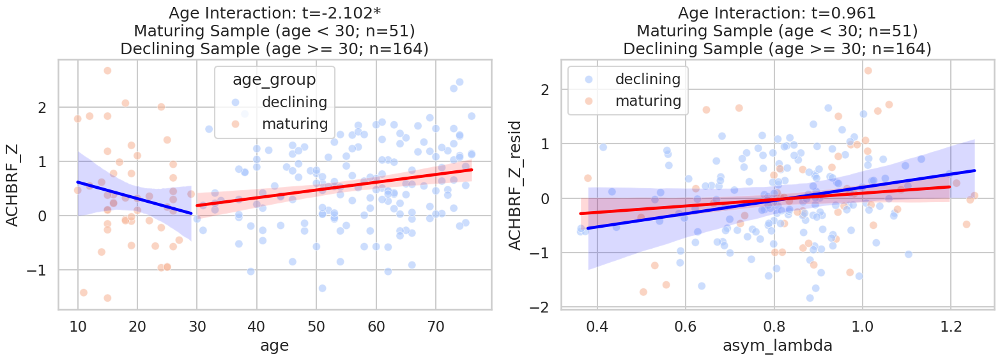

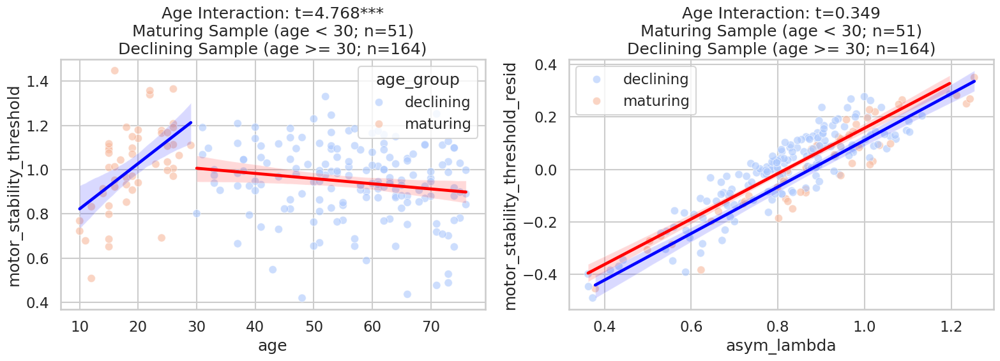

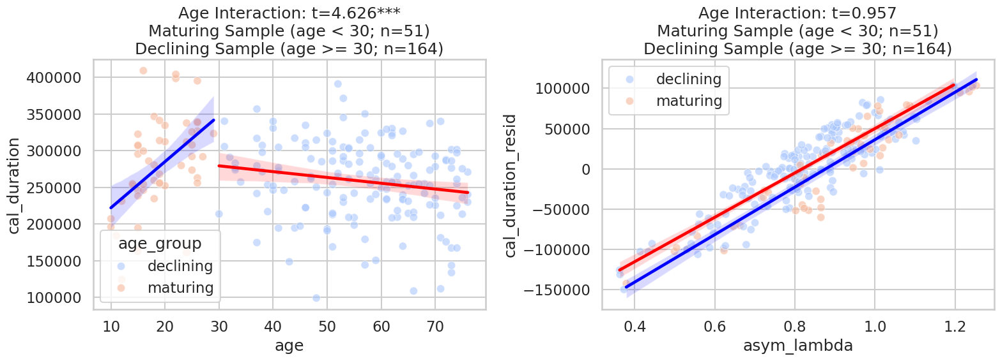

In [111]:
col_list = ['grand_mean_rt', 'grand_mean_rt_var', 'I_C_conflict_effect', 'I_N_conflict_effect',
       'C_N_conflict_effect', 'BIA_Z', 'ACHBRF_Z', 'motor_stability_threshold', 'cal_duration']
dep = ['age', 'sex_f']
col_dict = {col: dep + ['base_rt'] if 'conflict' in col else dep for col in col_list}
for col, dep_list in col_dict.items():
    compare_age_slopes(n_filt_data, col, dep_list)